# Линейная регрессия и стохастический градиентный спуск

Задание основано на материалах лекций по линейной регрессии и градиентному спуску. Вы будете прогнозировать выручку компании в зависимости от уровня ее инвестиций в рекламу по TV, в газетах и по радио.

## Вы научитесь:
- решать задачу восстановления линейной регрессии
- реализовывать стохастический градиентный спуск для ее настройки
- решать задачу линейной регрессии аналитически

## Введение
Линейная регрессия - один из наиболее хорошо изученных методов машинного обучения, позволяющий прогнозировать значения количественного признака в виде линейной комбинации прочих признаков с параметрами - весами модели. Оптимальные (в смысле минимальности некоторого функционала ошибки) параметры линейной регрессии можно найти аналитически с помощью нормального уравнения или численно с помощью методов оптимизации.  

Линейная регрессия использует простой функционал качества - среднеквадратичную ошибку. Мы будем работать с выборкой, содержащей 3 признака. Для настройки параметров (весов) модели решается следующая задача:
$$\Large \frac{1}{\ell}\sum_{i=1}^\ell{{((w_0 + w_1x_{i1} + w_2x_{i2} +  w_3x_{i3}) - y_i)}^2} \rightarrow \min_{w_0, w_1, w_2, w_3},$$
где $x_{i1}, x_{i2}, x_{i3}$ - значения признаков $i$-го объекта, $y_i$ - значение целевого признака $i$-го объекта, $\ell$ - число объектов в обучающей выборке.

## Градиентный спуск
Параметры $w_0, w_1, w_2, w_3$, по которым минимизируется среднеквадратичная ошибка, можно находить численно с помощью градиентного спуска.
Градиентный шаг для весов будет выглядеть следующим образом:
$$\Large w_0 \leftarrow w_0 - \frac{2\eta}{\ell} \sum_{i=1}^\ell{{((w_0 + w_1x_{i1} + w_2x_{i2} +  w_3x_{i3}) - y_i)}}$$
$$\Large w_j \leftarrow w_j - \frac{2\eta}{\ell} \sum_{i=1}^\ell{{x_{ij}((w_0 + w_1x_{i1} + w_2x_{i2} +  w_3x_{i3}) - y_i)}},\ j \in \{1,2,3\}$$
Здесь $\eta$ - параметр, шаг градиентного спуска.

## Стохастический градиентный спуск
Проблема градиентного спуска, описанного выше, в том, что на больших выборках считать на каждом шаге градиент по всем имеющимся данным может быть очень вычислительно сложно. 
В стохастическом варианте градиентного спуска поправки для весов вычисляются только с учетом одного случайно взятого объекта обучающей выборки:
$$\Large w_0 \leftarrow w_0 - \frac{2\eta}{\ell} {((w_0 + w_1x_{k1} + w_2x_{k2} +  w_3x_{k3}) - y_k)}$$
$$\Large w_j \leftarrow w_j - \frac{2\eta}{\ell} {x_{kj}((w_0 + w_1x_{k1} + w_2x_{k2} +  w_3x_{k3}) - y_k)},\ j \in \{1,2,3\},$$
где $k$ - случайный индекс, $k \in \{1, \ldots, \ell\}$.

## Нормальное уравнение 
Нахождение вектора оптимальных весов $w$ может быть сделано и аналитически.
Мы хотим найти такой вектор весов $w$, чтобы вектор $y$, приближающий целевой признак, получался умножением матрицы $X$ (состоящей из всех признаков объектов обучающей выборки, кроме целевого) на вектор весов $w$. То есть, чтобы выполнялось матричное уравнение:
$$\Large y = Xw$$
Домножением слева на $X^T$ получаем:
$$\Large X^Ty = X^TXw$$
Это хорошо, поскольку теперь матрица $X^TX$ - квадратная, и можно найти решение (вектор $w$) в виде:
$$\Large w = {(X^TX)}^{-1}X^Ty$$
Матрица ${(X^TX)}^{-1}X^T$ - [*псевдообратная*](https://ru.wikipedia.org/wiki/Псевдообратная_матрица) для матрицы $X$. В NumPy такую матрицу можно вычислить с помощью функции [numpy.linalg.pinv](http://docs.scipy.org/doc/numpy-1.10.0/reference/generated/numpy.linalg.pinv.html).

Однако, нахождение псевдообратной матрицы - операция вычислительно сложная и нестабильная в случае малого определителя матрицы $X$ (проблема мультиколлинеарности). 
На практике лучше находить вектор весов $w$ решением матричного уравнения 
$$\Large X^TXw = X^Ty$$Это может быть сделано с помощью функции [numpy.linalg.solve](http://docs.scipy.org/doc/numpy-1.10.1/reference/generated/numpy.linalg.solve.html).

Но все же на практике для больших матриц $X$ быстрее работает градиентный спуск, особенно его стохастическая версия.

## Инструкции по выполнению

В начале напишем простую функцию для записи ответов в текстовый файл. Ответами будут числа, полученные в ходе решения этого задания, округленные до 3 знаков после запятой. Полученные файлы после выполнения задания надо отправить в форму на странице задания на Coursera.org.

In [1]:
def write_answer_to_file(answer, filename):
    with open(filename, 'w') as f_out:
        f_out.write(str(round(answer, 3)))

**1. Загрузите данные из файла *advertising.csv* в объект pandas DataFrame. [Источник данных](http://www-bcf.usc.edu/~gareth/ISL/data.html).**

In [2]:
import pandas as pd
adver_data = pd.read_csv('advertising.csv')

**Посмотрите на первые 5 записей и на статистику признаков в этом наборе данных.**

In [3]:
# Ваш код здесь
adver_data.head(5)

,TV,Radio,Newspaper,Sales
1,230.1,37.8,69.2,22.1
2,44.5,39.3,45.1,10.4
3,17.2,45.9,69.3,9.3
4,151.5,41.3,58.5,18.5
5,180.8,10.8,58.4,12.9


In [4]:
# Ваш код здесь
adver_data.shape

(200, 4)

**Создайте массивы NumPy *X* из столбцов TV, Radio и Newspaper и *y* - из столбца Sales. Используйте атрибут *values* объекта pandas DataFrame.**

In [5]:
X = adver_data.drop("Sales", axis=1).values# Ваш код здесь
y = adver_data["Sales"].values
X, y

(array([[230.1,  37.8,  69.2],
        [ 44.5,  39.3,  45.1],
        [ 17.2,  45.9,  69.3],
        [151.5,  41.3,  58.5],
        [180.8,  10.8,  58.4],
        [  8.7,  48.9,  75. ],
        [ 57.5,  32.8,  23.5],
        [120.2,  19.6,  11.6],
        [  8.6,   2.1,   1. ],
        [199.8,   2.6,  21.2],
        [ 66.1,   5.8,  24.2],
        [214.7,  24. ,   4. ],
        [ 23.8,  35.1,  65.9],
        [ 97.5,   7.6,   7.2],
        [204.1,  32.9,  46. ],
        [195.4,  47.7,  52.9],
        [ 67.8,  36.6, 114. ],
        [281.4,  39.6,  55.8],
        [ 69.2,  20.5,  18.3],
        [147.3,  23.9,  19.1],
        [218.4,  27.7,  53.4],
        [237.4,   5.1,  23.5],
        [ 13.2,  15.9,  49.6],
        [228.3,  16.9,  26.2],
        [ 62.3,  12.6,  18.3],
        [262.9,   3.5,  19.5],
        [142.9,  29.3,  12.6],
        [240.1,  16.7,  22.9],
        [248.8,  27.1,  22.9],
        [ 70.6,  16. ,  40.8],
        [292.9,  28.3,  43.2],
        [112.9,  17.4,  38.6],
        

**Отмасштабируйте столбцы матрицы *X*, вычтя из каждого значения среднее по соответствующему столбцу и поделив результат на стандартное отклонение. Для определенности, используйте методы mean и std векторов NumPy (реализация std в Pandas может отличаться). Обратите внимание, что в numpy вызов функции .mean() без параметров возвращает среднее по всем элементам массива, а не по столбцам, как в pandas. Чтобы произвести вычисление по столбцам, необходимо указать параметр axis.**

In [6]:
print(adver_data["Sales"].mean(), adver_data["TV"].mean(), adver_data["Radio"].mean(), adver_data["Newspaper"].mean())


14.022500000000003 147.0425 23.264000000000024 30.553999999999995


In [7]:
X = (X - X.mean(axis=0))/X.std(axis=0)

**Добавьте к матрице *X* столбец из единиц, используя методы *hstack*, *ones* и *reshape* библиотеки NumPy. Вектор из единиц нужен для того, чтобы не обрабатывать отдельно коэффициент $w_0$ линейной регрессии.**

In [12]:
import numpy as np
X = np.hstack((Xmas,np.ones((Xmas.shape[0],1))))
X

array([[ 9.69852266e-01,  9.81522472e-01,  1.77894547e+00,
         1.00000000e+00],
       [-1.19737623e+00,  1.08280781e+00,  6.69578760e-01,
         1.00000000e+00],
       [-1.51615499e+00,  1.52846331e+00,  1.78354865e+00,
         1.00000000e+00],
       [ 5.20496822e-02,  1.21785493e+00,  1.28640506e+00,
         1.00000000e+00],
       [ 3.94182198e-01, -8.41613655e-01,  1.28180188e+00,
         1.00000000e+00],
       [-1.61540845e+00,  1.73103399e+00,  2.04592999e+00,
         1.00000000e+00],
       [-1.04557682e+00,  6.43904671e-01, -3.24708413e-01,
         1.00000000e+00],
       [-3.13436589e-01, -2.47406325e-01, -8.72486994e-01,
         1.00000000e+00],
       [-1.61657614e+00, -1.42906863e+00, -1.36042422e+00,
         1.00000000e+00],
       [ 6.16042873e-01, -1.39530685e+00, -4.30581584e-01,
         1.00000000e+00],
       [-9.45155670e-01, -1.17923146e+00, -2.92486143e-01,
         1.00000000e+00],
       [ 7.90028350e-01,  4.96973404e-02, -1.22232878e+00,
      

**2. Реализуйте функцию *mserror* - среднеквадратичную ошибку прогноза. Она принимает два аргумента - объекты Series *y* (значения целевого признака) и *y\_pred* (предсказанные значения). Не используйте в этой функции циклы - тогда она будет вычислительно неэффективной.**

In [13]:
def mserror(y, y_pred):
    return (sum((y-y_pred)**2))/y.shape[0]



**Какова среднеквадратичная ошибка прогноза значений Sales, если всегда предсказывать медианное значение Sales по исходной выборке? Запишите ответ в файл '1.txt'.**

In [14]:
answer1 = mserror(y, np.repeat(adver_data["Sales"].median(), adver_data.shape[0]))
print(answer1)
write_answer_to_file(answer1, '1.txt')

28.34575


**3. Реализуйте функцию *normal_equation*, которая по заданным матрицам (массивам NumPy) *X* и *y* вычисляет вектор весов $w$ согласно нормальному уравнению линейной регрессии.**

In [15]:
def normal_equation(X, y):
    a = np.dot(X.T, X) 
    b = np.dot(X.T, y) 
    res = np.linalg.solve(a, b) # решаем систему
    return res

In [16]:
norm_eq_weights = normal_equation(X, y)
print(norm_eq_weights)

[ 3.91925365  2.79206274 -0.02253861 14.0225    ]


**Какие продажи предсказываются линейной моделью с весами, найденными с помощью нормального уравнения, в случае средних инвестиций в рекламу по ТВ, радио и в газетах? (то есть при нулевых значениях масштабированных признаков TV, Radio и Newspaper). Запишите ответ в файл '2.txt'.**

In [17]:
def sale_pred(x, w):
    return np.dot(x, w)
a = np.array([[0,0,0,1]])
answer2 = sale_pred(a,norm_eq_weights)[0]
print(answer2)
write_answer_to_file(answer2, '2.txt')

14.022500000000004


**4. Напишите функцию *linear_prediction*, которая принимает на вход матрицу *X* и вектор весов линейной модели *w*, а возвращает вектор прогнозов в виде линейной комбинации столбцов матрицы *X* с весами *w*.**

In [18]:
def linear_prediction(X, w):
    return np.dot(X, w)

**Какова среднеквадратичная ошибка прогноза значений Sales в виде линейной модели с весами, найденными с помощью нормального уравнения? Запишите ответ в файл '3.txt'.**

In [19]:
answer3 = mserror(y, linear_prediction(X, norm_eq_weights))# Ваш код здесь
print(answer3)
write_answer_to_file(answer3, '3.txt')

2.7841263145109356


**5. Напишите функцию *stochastic_gradient_step*, реализующую шаг стохастического градиентного спуска для линейной регрессии. Функция должна принимать матрицу *X*, вектора *y* и *w*, число *train_ind* - индекс объекта обучающей выборки (строки матрицы *X*), по которому считается изменение весов, а также число *$\eta$* (eta) - шаг градиентного спуска (по умолчанию *eta*=0.01). Результатом будет вектор обновленных весов. Наша реализация функции будет явно написана для данных с 3 признаками, но несложно модифицировать для любого числа признаков, можете это сделать.**

In [20]:
def stochastic_gradient_step(X, y, w, train_ind, eta=0.01):
    grad0 = (2*(np.dot(X[train_ind],w)-y[train_ind])*X[train_ind,0])/len(X)
    grad1 = (2*(np.dot(X[train_ind],w)-y[train_ind])*X[train_ind,1])/len(X)
    grad2 = (2*(np.dot(X[train_ind],w)-y[train_ind])*X[train_ind,2])/len(X)
    grad3 = (2*(np.dot(X[train_ind],w)-y[train_ind])*X[train_ind,3])/len(X)
    return  w - eta * np.array([grad0, grad1, grad2, grad3])

**6. Напишите функцию *stochastic_gradient_descent*, реализующую стохастический градиентный спуск для линейной регрессии. Функция принимает на вход следующие аргументы:**
- X - матрица, соответствующая обучающей выборке
- y - вектор значений целевого признака
- w_init - вектор начальных весов модели
- eta - шаг градиентного спуска (по умолчанию 0.01)
- max_iter - максимальное число итераций градиентного спуска (по умолчанию 10000)
- max_weight_dist - максимальное евклидово расстояние между векторами весов на соседних итерациях градиентного спуска,
при котором алгоритм прекращает работу (по умолчанию 1e-8)
- seed - число, используемое для воспроизводимости сгенерированных псевдослучайных чисел (по умолчанию 42)
- verbose - флаг печати информации (например, для отладки, по умолчанию False)

**На каждой итерации в вектор (список) должно записываться текущее значение среднеквадратичной ошибки. Функция должна возвращать вектор весов $w$, а также вектор (список) ошибок.**

In [21]:
def stochastic_gradient_descent(X, y, w_init, eta=1e-2, max_iter=1e4,
                                min_weight_dist=1e-8, seed=42, verbose=False):
    # Инициализируем расстояние между векторами весов на соседних
    # итерациях большим числом. 
    weight_dist = np.inf
    # Инициализируем вектор весов
    w = w_init
    # Сюда будем записывать ошибки на каждой итерации
    errors = []
    # Счетчик итераций
    iter_num = 0
    # Будем порождать псевдослучайные числа 
    # (номер объекта, который будет менять веса), а для воспроизводимости
    # этой последовательности псевдослучайных чисел используем seed.
    np.random.seed(seed)
        
    # Основной цикл
    while weight_dist > min_weight_dist and iter_num < max_iter:
 
        # порождаем псевдослучайный 
        # индекс объекта обучающей выборки
        random_ind = np.random.randint(X.shape[0])
        w_new = stochastic_gradient_step(X, y, w, random_ind, eta=0.01)
        #print("W_new:",w_new)
        s = 0
        for i in range(len(w_new)):
            s += (w[i] - w_new[i])**2
        weight_dist = np.sqrt(s)
        w = w_new
        
        err=mserror(y, linear_prediction(X, w))
        errors.append(err)
        if verbose:
            print("iter: {}, weights: {}, err: {}, dist: {}".format(iter_num,w,err, weight_dist))
        iter_num+=1
        
    return w, errors

 **Запустите $10^5$ итераций стохастического градиентного спуска. Укажите вектор начальных весов *w_init*, состоящий из нулей. Оставьте параметры  *eta* и *seed* равными их значениям по умолчанию (*eta*=0.01, *seed*=42 - это важно для проверки ответов).**

In [22]:
%%time
stoch_grad_desc_weights, stoch_errors_by_iter = stochastic_gradient_descent(X, y, [0,0,0,0], eta=1e-2, max_iter=1e5,
                                min_weight_dist=1e-8, seed=42, verbose=True)

iter: 0, weights: [ 0.0023012  -0.00131554 -0.00062364  0.00148   ], err: 223.66538899863147, dist: 0.00309927214727702
iter: 1, weights: [ 0.00257416 -0.00244372 -0.00137476  0.00273965], err: 223.63640485031922, dist: 0.0018703459939071931
iter: 2, weights: [ 0.00417466 -0.00110295  0.00116534  0.00467951], err: 223.55491009541456, dist: 0.0038176491298335443
iter: 3, weights: [0.00544003 0.00013281 0.00251571 0.00657875], err: 223.48076245155767, dist: 0.0029255613184442615
iter: 4, weights: [ 0.00441378 -0.00046354  0.0024874   0.00729889], err: 223.47256426508554, dist: 0.001388606868643157
iter: 5, weights: [ 0.00387479 -0.00121374  0.00255279  0.00853831], err: 223.4465523189048, dist: 0.0015471752822156632
iter: 6, weights: [ 0.00645269 -0.0022183   0.00058886  0.01012707], err: 223.3917514492022, dist: 0.003746443182660263
iter: 7, weights: [ 0.00795122 -0.0016796   0.0024802   0.01192552], err: 223.32145217573233, dist: 0.003057345835957242
iter: 8, weights: [ 0.01024857 -0.0

iter: 562, weights: [0.26773725 0.16795351 0.04608526 0.78883476], err: 199.0326819711694, dist: 0.0016383244566607758
iter: 563, weights: [0.27106813 0.16853652 0.04350905 0.79078113], err: 198.9581642043899, dist: 0.004675454472048124
iter: 564, weights: [0.27191366 0.16732236 0.04327773 0.79199085], err: 198.92704275207004, dist: 0.0019251125820954904
iter: 565, weights: [0.27402355 0.16778229 0.04265211 0.79376654], err: 198.86284432859037, dist: 0.002864891577978573
iter: 566, weights: [0.27312515 0.1673404  0.0418031  0.79481129], err: 198.84630096526698, dist: 0.0016777092111450824
iter: 567, weights: [0.27442334 0.16742206 0.03979454 0.7964545 ], err: 198.79685346425802, dist: 0.0029028305906789093
iter: 568, weights: [0.27391548 0.16673576 0.03880196 0.79755164], err: 198.77765784873515, dist: 0.001708170924836678
iter: 569, weights: [0.2743748  0.16666344 0.03886301 0.7989536 ], err: 198.73737484169874, dist: 0.001478318841165742
iter: 570, weights: [0.27342669 0.1659572  0.0

iter: 1047, weights: [0.43208433 0.25281298 0.09135687 1.40451134], err: 181.33969638856018, dist: 0.0023538357125774782
iter: 1048, weights: [0.43499091 0.25567211 0.09377831 1.40668991], err: 181.24356693914825, dist: 0.005218465331232984
iter: 1049, weights: [0.43694649 0.25546407 0.09373831 1.40825864], err: 181.19104207690054, dist: 0.0025159667632281787
iter: 1050, weights: [0.43735909 0.25772662 0.09151936 1.41004705], err: 181.1351402528192, dist: 0.0036621694474224392
iter: 1051, weights: [0.43660043 0.25793216 0.0910727  1.41050574], err: 181.12882711512248, dist: 0.0010137591115552418
iter: 1052, weights: [0.43540454 0.25959451 0.09001975 1.41154294], err: 181.10445633541087, dist: 0.002525478868076281
iter: 1053, weights: [0.43681038 0.2582077  0.08949099 1.41258211], err: 181.07656540358752, dist: 0.0022932663896798556
iter: 1054, weights: [0.43834252 0.25677518 0.08917171 1.41359409], err: 181.04829183586742, dist: 0.0023506660577637863
iter: 1055, weights: [0.43730838 0.

iter: 1472, weights: [0.58416648 0.35070812 0.1216398  1.93504412], err: 166.5832805118094, dist: 0.0025797975522802424
iter: 1473, weights: [0.58410335 0.35124003 0.12056121 1.9363492 ], err: 166.55139406714244, dist: 0.0017758126054835575
iter: 1474, weights: [0.58339486 0.35138182 0.12077798 1.93678339], err: 166.54467922877632, dist: 0.0008703836502216427
iter: 1475, weights: [0.58650821 0.35200342 0.12184208 1.93861137], err: 166.47382123421937, dist: 0.0038148559142270793
iter: 1476, weights: [0.58793875 0.35316723 0.12296954 1.94029519], err: 166.41520713109443, dist: 0.002739947240610297
iter: 1477, weights: [0.58866049 0.3519056  0.12243847 1.94132953], err: 166.39267487971154, dist: 0.00186131615598326
iter: 1478, weights: [0.58925287 0.35170074 0.12191082 1.94266957], err: 166.35821556900072, dist: 0.001570673514040983
iter: 1479, weights: [0.59044765 0.3517759  0.12006225 1.9441819 ], err: 166.31639919241215, dist: 0.00267161514733707
iter: 1480, weights: [0.59204228 0.3542

iter: 1915, weights: [0.7390431  0.462099   0.17566378 2.45601782], err: 152.56316390593557, dist: 0.0018337679371205294
iter: 1916, weights: [0.74019274 0.46217132 0.17388507 2.45747301], err: 152.5244461977081, dist: 0.0025706621517632353
iter: 1917, weights: [0.74334137 0.4643851  0.17621737 2.45947995], err: 152.44275021304836, dist: 0.004927694085704787
iter: 1918, weights: [0.74438192 0.46540129 0.17732781 2.46104173], err: 152.39305769781762, dist: 0.0024057422645407845
iter: 1919, weights: [0.7443213  0.46591205 0.17629211 2.46229491], err: 152.3636648961234, dist: 0.0017051967845126532
iter: 1920, weights: [0.74386319 0.46527444 0.17634768 2.46334832], err: 152.34533577409724, dist: 0.0013149770490420275
iter: 1921, weights: [0.74500496 0.46592123 0.17484488 2.46488436], err: 152.30158956467963, dist: 0.002517887020956539
iter: 1922, weights: [0.74524689 0.46486244 0.17405209 2.46585443], err: 152.28400159304954, dist: 0.0016580481152440923
iter: 1923, weights: [0.74467841 0.4

iter: 2346, weights: [0.92743512 0.58759214 0.25389705 2.95857025], err: 139.27944240818843, dist: 0.0039212011465971875
iter: 2347, weights: [0.93069319 0.59131154 0.25500935 2.96071891], err: 139.1933630040203, dist: 0.005504803968110416
iter: 2348, weights: [0.92988285 0.59159212 0.25435215 2.96169989], err: 139.17628602769915, dist: 0.0014593208933680777
iter: 2349, weights: [0.93133241 0.59407182 0.2540774  2.96347947], err: 139.1170893029292, dist: 0.003390058538709628
iter: 2350, weights: [0.93171412 0.59401172 0.25412813 2.96464457], err: 139.08916411204555, dist: 0.0012285539458688742
iter: 2351, weights: [0.93122741 0.59287067 0.25387903 2.96538044], err: 139.0814029016316, dist: 0.0014637073333733255
iter: 2352, weights: [0.9320189  0.59162981 0.25327273 2.96626122], err: 139.0634684300165, dist: 0.0018192133101198576
iter: 2353, weights: [0.93121464 0.59107082 0.25287565 2.96697097], err: 139.0558178676995, dist: 0.0012730806031018749
iter: 2354, weights: [0.93236568 0.5914

iter: 2833, weights: [1.00951185 0.64760435 0.24465869 3.4693488 ], err: 127.47992973140067, dist: 0.0012362420984269756
iter: 2834, weights: [1.00986672 0.64955037 0.24275018 3.470887  ], err: 127.4392424645696, dist: 0.0031498200529494714
iter: 2835, weights: [1.01009879 0.64865421 0.24293372 3.47174523], err: 127.4234503436274, dist: 0.00127562432012475
iter: 2836, weights: [1.01014078 0.64978132 0.24140434 3.47309835], err: 127.39168322648156, dist: 0.002332824958875487
iter: 2837, weights: [1.011123   0.64925243 0.24233886 3.47414775], err: 127.36473247645762, dist: 0.0017941655649206098
iter: 2838, weights: [1.01258507 0.64812457 0.24145404 3.47501933], err: 127.34369394103591, dist: 0.0022253700044926935
iter: 2839, weights: [1.01199908 0.64747542 0.24127438 3.47585793], err: 127.33263815911668, dist: 0.0012248689145550704
iter: 2840, weights: [1.01190302 0.64684667 0.2402789  3.47692042], err: 127.31490240543319, dist: 0.001588837946707364
iter: 2841, weights: [1.01156244 0.647

iter: 3333, weights: [1.11637243 0.71799667 0.26203774 3.9727628 ], err: 116.14909228272536, dist: 0.001258343108025726
iter: 3334, weights: [1.1165422  0.71788708 0.26213768 3.97266345], err: 116.15044887283055, dist: 0.0002463494293309545
iter: 3335, weights: [1.11703359 0.71677625 0.26119304 3.97349582], err: 116.13674698706069, dist: 0.0017494527595755432
iter: 3336, weights: [1.11624631 0.71595794 0.26071531 3.97411527], err: 116.13293174672494, dist: 0.0013789130149673037
iter: 3337, weights: [1.11550485 0.71541838 0.26029265 3.97486458], err: 116.12499064717082, dist: 0.0012573693674957516
iter: 3338, weights: [1.11761179 0.71867929 0.26147999 3.97674104], err: 116.05973532565389, dist: 0.0044725335274017975
iter: 3339, weights: [1.11694637 0.71946564 0.26228162 3.97767003], err: 116.04061155988776, dist: 0.001602111187726159
iter: 3340, weights: [1.11733785 0.72099955 0.26273626 3.97905215], err: 116.00350719702192, dist: 0.0021501319812136004
iter: 3341, weights: [1.11677771 0

iter: 3832, weights: [1.222902   0.80350307 0.27646317 4.44888551], err: 105.82762831327383, dist: 0.0015195316307710042
iter: 3833, weights: [1.22226586 0.80287513 0.27637041 4.44929224], err: 105.82604272773959, dist: 0.0009864123418325088
iter: 3834, weights: [1.22279991 0.8025497  0.27797345 4.45028309], err: 105.80362837561876, dist: 0.001985599294049789
iter: 3835, weights: [1.22409933 0.80454703 0.27864155 4.45188755], err: 105.75681854812737, dist: 0.0029493169305154915
iter: 3836, weights: [1.22476191 0.80350826 0.278134   4.45262489], err: 105.74379242470734, dist: 0.0015229377404286555
iter: 3837, weights: [1.22405848 0.80375184 0.2775635  4.45347645], err: 105.73106121605814, dist: 0.001266794688675055
iter: 3838, weights: [1.22507568 0.80280077 0.27735152 4.45414831], err: 105.71663215476028, dist: 0.0015606262427735982
iter: 3839, weights: [1.22530932 0.80264995 0.27748906 4.45401159], err: 105.71840604898055, dist: 0.00033903249551406003
iter: 3840, weights: [1.22571384 

iter: 4332, weights: [1.35917011 0.91771023 0.34133781 4.91839902], err: 95.8058490079175, dist: 0.0016975968988519575
iter: 4333, weights: [1.35874572 0.9169913  0.34037102 4.91917823], err: 95.79747818804975, dist: 0.0014962713547767412
iter: 4334, weights: [1.36024092 0.91803806 0.33873809 4.92058291], err: 95.76151409350881, dist: 0.0028232834463571177
iter: 4335, weights: [1.36081614 0.92018366 0.34053303 4.92196831], err: 95.72356858697589, dist: 0.003174206731103849
iter: 4336, weights: [1.36109533 0.91985616 0.34053934 4.92290752], err: 95.70622873883205, dist: 0.0010331277002002116
iter: 4337, weights: [1.36129264 0.91909425 0.34069539 4.92363719], err: 95.69464035774418, dist: 0.0010845327674987796
iter: 4338, weights: [1.36190213 0.91829374 0.34218567 4.92423401], err: 95.68225535348932, dist: 0.001894582709927457
iter: 4339, weights: [1.36240154 0.91814041 0.3411687  4.92528335], err: 95.66200753667447, dist: 0.001551859843245722
iter: 4340, weights: [1.36322283 0.91894248 

iter: 4831, weights: [1.47618987 1.01764165 0.37150048 5.35899208], err: 86.98384919146966, dist: 0.001280153876325338
iter: 4832, weights: [1.47597389 1.01917207 0.37141214 5.36015225], err: 86.95949002836188, dist: 0.0019345904214682185
iter: 4833, weights: [1.47535841 1.01902503 0.37147796 5.36088695], err: 86.95033295116068, dist: 0.0009718829636881227
iter: 4834, weights: [1.47569741 1.02035327 0.37187164 5.36208376], err: 86.92290822568768, dist: 0.0018618474726153295
iter: 4835, weights: [1.47606165 1.01952827 0.37161705 5.36267502], err: 86.91393673194047, dist: 0.0011080171918619317
iter: 4836, weights: [1.47724553 1.02134801 0.37222575 5.36413682], err: 86.87578193397049, dist: 0.0026870780983463656
iter: 4837, weights: [1.47686778 1.02145035 0.37200335 5.36436522], err: 86.87353212392416, dist: 0.0005047734357785596
iter: 4838, weights: [1.47801409 1.02418845 0.37250983 5.36590495], err: 86.8310719987374, dist: 0.003382091777874067
iter: 4839, weights: [1.47723783 1.02429969

iter: 5331, weights: [1.59653728 1.12603686 0.37291541 5.77677165], err: 78.95672832941206, dist: 0.0024296690769871434
iter: 5332, weights: [1.59648144 1.1251307  0.3728     5.77740574], err: 78.94961127434614, dist: 0.0011133868814571003
iter: 5333, weights: [1.59594569 1.1263104  0.3735927  5.7782691 ], err: 78.9335199613459, dist: 0.0017471334000379699
iter: 5334, weights: [1.5983597  1.12822566 0.37607677 5.77978299], err: 78.88908380656282, dist: 0.004237708803668579
iter: 5335, weights: [1.59878138 1.12786375 0.37556193 5.78066686], err: 78.87402488471784, dist: 0.0011640797796507248
iter: 5336, weights: [1.59805953 1.12710728 0.37532736 5.78118399], err: 78.87159987852468, dist: 0.0011898549858404368
iter: 5337, weights: [1.59800723 1.12614899 0.37466827 5.78184828], err: 78.86449365605799, dist: 0.001340432334278403
iter: 5338, weights: [1.5974012  1.12669703 0.37500716 5.78235441], err: 78.8570189735196, dist: 0.0010191339331721088
iter: 5339, weights: [1.59713402 1.12648613 

iter: 5830, weights: [1.73446522 1.22697643 0.4087866  6.18429031], err: 71.42047005933561, dist: 0.0038828530044064365
iter: 5831, weights: [1.73567361 1.22633171 0.40794832 6.18504426], err: 71.405614738212, dist: 0.001773989575036697
iter: 5832, weights: [1.73717527 1.22803705 0.40717987 6.18642919], err: 71.37232261255302, dist: 0.002769789040019317
iter: 5833, weights: [1.73835194 1.22925037 0.40726272 6.18767391], err: 71.34378285543272, dist: 0.002100688297620004
iter: 5834, weights: [1.73874091 1.22837108 0.40651498 6.18833279], err: 71.33477701179203, dist: 0.0013848027613630335
iter: 5835, weights: [1.73801521 1.22906706 0.40585649 6.18891068], err: 71.32717308669432, dist: 0.0013336431703989376
iter: 5836, weights: [1.7387214  1.22836304 0.40514122 6.18962169], err: 71.3153795017742, dist: 0.0014182699303098075
iter: 5837, weights: [1.73938113 1.22820058 0.40431582 6.19052485], err: 71.29918436802708, dist: 0.0013995038208153164
iter: 5838, weights: [1.74014919 1.22743511 0.

iter: 6330, weights: [1.83242613 1.29098004 0.4092434  6.56045482], err: 65.0430515053385, dist: 0.0013247285127761894
iter: 6331, weights: [1.83237486 1.29014827 0.40913747 6.56103685], err: 65.03706539144213, dist: 0.0010219790727099337
iter: 6332, weights: [1.83185917 1.29063475 0.40976327 6.56165073], err: 65.02842083873699, dist: 0.0011274217621495912
iter: 6333, weights: [1.83341033 1.29103389 0.41117041 6.56269955], err: 65.00434187013516, dist: 0.0023760210317504108
iter: 6334, weights: [1.83282283 1.29059626 0.4115027  6.56327493], err: 64.99941284440692, dist: 0.00098901214126474
iter: 6335, weights: [1.83308795 1.2920501  0.41007688 6.56442409], err: 64.9775002560484, dist: 0.0023531873884435855
iter: 6336, weights: [1.83385582 1.29248508 0.40906622 6.56545711], err: 64.95796866509187, dist: 0.0016933325601064314
iter: 6337, weights: [1.83340276 1.29292598 0.41094695 6.56594674], err: 64.95050629916517, dist: 0.0020436594298837555
iter: 6338, weights: [1.83357049 1.29342332 

iter: 6829, weights: [1.92207163 1.35136005 0.41821117 6.9264517 ], err: 59.16262168346853, dist: 0.001041375047502026
iter: 6830, weights: [1.92257568 1.3521182  0.42012957 6.92737688], err: 59.14461592197543, dist: 0.002316269961171431
iter: 6831, weights: [1.922148   1.35239275 0.42001268 6.92766049], err: 59.14162315178133, dist: 0.0005936204239011529
iter: 6832, weights: [1.9219767  1.35231191 0.41989526 6.92776312], err: 59.14113705405151, dist: 0.0002453524564116936
iter: 6833, weights: [1.92258368 1.3517444  0.41976877 6.92816404], err: 59.134585452830706, dist: 0.0009312544519673412
iter: 6834, weights: [1.92240259 1.35241345 0.4213959  6.92889067], err: 59.12256987429853, dist: 0.0019120642094582103
iter: 6835, weights: [1.92365257 1.35290808 0.4208974  6.92994681], err: 59.10126423896017, dist: 0.0017807451334886128
iter: 6836, weights: [1.92308907 1.35240994 0.42042318 6.93029539], err: 59.10018671805473, dist: 0.0009550220584162869
iter: 6837, weights: [1.92394085 1.354265

iter: 7329, weights: [2.02708115 1.41944342 0.43451676 7.2740634 ], err: 53.74124027322185, dist: 0.0011214977651070885
iter: 7330, weights: [2.02829921 1.42053995 0.43414371 7.27516541], err: 53.718859549015264, dist: 0.002009883794348381
iter: 7331, weights: [2.02772435 1.41978429 0.43392195 7.2756917 ], err: 53.71603499919772, dist: 0.0011079887518014378
iter: 7332, weights: [2.02746689 1.41993429 0.43403178 7.27585461], err: 53.71441201110197, dist: 0.0003569072093296041
iter: 7333, weights: [2.02716862 1.41953122 0.43344882 7.27649896], err: 53.70809520138786, dist: 0.0010032255850546353
iter: 7334, weights: [2.02678406 1.41990547 0.43504522 7.27691456], err: 53.702562280608724, dist: 0.0017346925331095363
iter: 7335, weights: [2.02656694 1.42049994 0.43439621 7.2776912 ], err: 53.69154264176651, dist: 0.0011937051010018286
iter: 7336, weights: [2.02723083 1.42019927 0.43425598 7.2783909 ], err: 53.68035458392623, dist: 0.0010199940236541476
iter: 7337, weights: [2.02677245 1.4206

iter: 7828, weights: [2.12808481 1.48660706 0.45839595 7.60313215], err: 48.85028855405563, dist: 0.0023685469752655645
iter: 7829, weights: [2.12846149 1.48606616 0.4582929  7.60367107], err: 48.8433388084357, dist: 0.0008576130348541251
iter: 7830, weights: [2.12866002 1.48583328 0.45829739 7.60433894], err: 48.83461071672576, dist: 0.0007346574720171301
iter: 7831, weights: [2.12826775 1.48605113 0.45874089 7.60461152], err: 48.83194041363682, dist: 0.0006872642664968495
iter: 7832, weights: [2.12804847 1.48630127 0.45820829 7.60531902], err: 48.823135660986566, dist: 0.0009459753023776234
iter: 7833, weights: [2.12764805 1.48585768 0.45808553 7.60589206], err: 48.81836671892523, dist: 0.0008369905021149987
iter: 7834, weights: [2.12797345 1.48574515 0.45779568 7.60662817], err: 48.808052091639226, dist: 0.0008627963456636592
iter: 7835, weights: [2.1284781  1.48524734 0.45760587 7.60700119], err: 48.80267428350252, dist: 0.0008232055760828541
iter: 7836, weights: [2.12788125 1.4857

iter: 8328, weights: [2.21828289 1.53823629 0.44293132 7.91252657], err: 44.52870452537402, dist: 0.001198818286427483
iter: 8329, weights: [2.21807324 1.53847545 0.44242208 7.91320303], err: 44.520680737438006, dist: 0.0009044767209471227
iter: 8330, weights: [2.21884531 1.53980133 0.44257074 7.91419795], err: 44.50267832546234, dist: 0.0018346664350126455
iter: 8331, weights: [2.21838893 1.53955055 0.44281189 7.91470923], err: 44.49857955556351, dist: 0.0007685983012767084
iter: 8332, weights: [2.21887475 1.53928895 0.44327412 7.91522828], err: 44.4910950306333, dist: 0.0008874274597179233
iter: 8333, weights: [2.2183454  1.53882099 0.44282864 7.91555574], err: 44.490112667523015, dist: 0.0008971474196068346
iter: 8334, weights: [2.21801823 1.53850604 0.44304036 7.91610681], err: 44.485235714633056, dist: 0.0007448088342532426
iter: 8335, weights: [2.21892587 1.53875209 0.44226605 7.91696705], err: 44.47110079076876, dist: 0.0014912768917012998
iter: 8336, weights: [2.21884648 1.5385

iter: 8827, weights: [2.30163215 1.59752533 0.44885298 8.20500566], err: 40.61983055401768, dist: 0.0011375716752812953
iter: 8828, weights: [2.30197147 1.59703479 0.44879394 8.20541232], err: 40.615075657927946, dist: 0.0007243163316430121
iter: 8829, weights: [2.30230306 1.59693298 0.4481187  8.20610906], err: 40.60615859585382, dist: 0.001030392246124799
iter: 8830, weights: [2.30254465 1.59661568 0.44870942 8.20634563], err: 40.6032638087817, dist: 0.0007509766492980839
iter: 8831, weights: [2.3022655  1.59767918 0.44932539 8.20698755], err: 40.594293476575196, dist: 0.0014143747807336072
iter: 8832, weights: [2.30299003 1.59925769 0.44878557 8.20805813], err: 40.575969317771566, dist: 0.002110494405784975
iter: 8833, weights: [2.30436712 1.6006123  0.44993281 8.2090903 ], err: 40.556298763171114, dist: 0.002472422195366886
iter: 8834, weights: [2.30588549 1.60137865 0.452752   8.20996091], err: 40.53923296066848, dist: 0.003405664876345576
iter: 8835, weights: [2.30601101 1.600829

iter: 9327, weights: [2.39372916 1.64967701 0.44892158 8.48821343], err: 36.99511516000851, dist: 0.0010383616120319505
iter: 9328, weights: [2.39474392 1.65173848 0.4474279  8.48939969], err: 36.97451458936821, dist: 0.0029862512634909986
iter: 9329, weights: [2.39466129 1.65104993 0.44688463 8.48995497], err: 36.97010709649626, dist: 0.0010413488028660058
iter: 9330, weights: [2.3940392  1.65038891 0.44693528 8.49040477], err: 36.968469712399816, dist: 0.0010143093365763628
iter: 9331, weights: [2.39463846 1.65009728 0.44685195 8.49096104], err: 36.9610658675892, dist: 0.000872088646894941
iter: 9332, weights: [2.39550511 1.65028621 0.44659497 8.49169042], err: 36.94990380049037, dist: 0.0011767733716908945
iter: 9333, weights: [2.39609603 1.65032338 0.44568071 8.49243838], err: 36.93974893719426, dist: 0.001321320699031678
iter: 9334, weights: [2.39548623 1.64968433 0.44548256 8.49287524], err: 36.93818293735565, dist: 0.0010051535005157547
iter: 9335, weights: [2.39591634 1.6496411

iter: 9826, weights: [2.46815421 1.7030658  0.43746907 8.75402319], err: 33.78700595945522, dist: 0.0008434165410373135
iter: 9827, weights: [2.46873805 1.70282766 0.43727976 8.75456049], err: 33.7800934203187, dist: 0.0008497717696228004
iter: 9828, weights: [2.46903702 1.70235895 0.43705075 8.75489319], err: 33.77664792261893, dist: 0.0006871658054649606
iter: 9829, weights: [2.46920056 1.70216711 0.43705444 8.75544337], err: 33.7707527233714, dist: 0.0006051985502576134
iter: 9830, weights: [2.47025929 1.70243954 0.43801487 8.75615922], err: 33.759508258607966, dist: 0.001621717687611487
iter: 9831, weights: [2.46984757 1.70234118 0.43805889 8.7566507 ], err: 33.75575025266256, dist: 0.0006501342132508331
iter: 9832, weights: [2.46943908 1.70211671 0.43827473 8.75710833], err: 33.7525911068551, dist: 0.0006879405733515916
iter: 9833, weights: [2.46979437 1.7017037  0.43816539 8.75744507], err: 33.748824097198906, dist: 0.0006497301569491181
iter: 9834, weights: [2.4696572  1.7018419

iter: 10326, weights: [2.53778071 1.75764919 0.43317862 9.00958919], err: 30.851027261560866, dist: 0.0008552897101843239
iter: 10327, weights: [2.53746636 1.75834139 0.43364374 9.01009577], err: 30.84553449575645, dist: 0.0010251406040428135
iter: 10328, weights: [2.53728461 1.75819793 0.43313782 9.01067563], err: 30.840495665310865, dist: 0.0008036228068417304
iter: 10329, weights: [2.53705727 1.75882501 0.43394285 9.01121134], err: 30.834598937000578, dist: 0.0011747235563633962
iter: 10330, weights: [2.53783981 1.75831988 0.43440353 9.0107534 ], err: 30.837946813905248, dist: 0.0011355429405802112
iter: 10331, weights: [2.53736995 1.7582234  0.43411195 9.01127032], err: 30.834268604782064, dist: 0.0007630909984408841
iter: 10332, weights: [2.53760785 1.7576856  0.43365461 9.01167331], err: 30.830566698131182, dist: 0.0008469821729862698
iter: 10333, weights: [2.53716587 1.75722829 0.43299256 9.01215832], err: 30.82780821170196, dist: 0.0010382855516066945
iter: 10334, weights: [2.5

iter: 10825, weights: [2.63505649 1.83089231 0.42115821 9.26695457], err: 27.937937434097744, dist: 0.0008304040080627011
iter: 10826, weights: [2.6353426  1.83060716 0.42127701 9.26716194], err: 27.935720644076653, dist: 0.0004693460561724247
iter: 10827, weights: [2.63684006 1.83176265 0.42213135 9.26806089], err: 27.921280404059463, dist: 0.00226176349485416
iter: 10828, weights: [2.63651284 1.83140016 0.42203103 9.26852918], err: 27.91831186128966, dist: 0.0006839878440771404
iter: 10829, weights: [2.63745479 1.83164254 0.42288552 9.26916608], err: 27.90942107673772, dist: 0.0014428484850420047
iter: 10830, weights: [2.63769295 1.83127951 0.42266807 9.26943673], err: 27.906844367252802, dist: 0.000555922734863863
iter: 10831, weights: [2.6381471  1.83133238 0.42219716 9.27002285], err: 27.899961603702682, dist: 0.0008799600157295866
iter: 10832, weights: [2.63789562 1.8308726  0.42172984 9.27045755], err: 27.89726212407725, dist: 0.0008258223283425542
iter: 10833, weights: [2.63754

iter: 11325, weights: [2.67314547 1.85308009 0.43284658 9.49032316], err: 25.727743869489387, dist: 0.0007462577201892867
iter: 11326, weights: [2.67281639 1.8537676  0.43311819 9.49071273], err: 25.723915728987755, dist: 0.0008980523261623389
iter: 11327, weights: [2.67319523 1.85367431 0.43264422 9.49123135], err: 25.718359737476195, dist: 0.0008036353360654831
iter: 11328, weights: [2.67282827 1.85358664 0.43268346 9.49166939], err: 25.715475986565675, dist: 0.0005794532666257306
iter: 11329, weights: [2.67335703 1.85512769 0.43386706 9.49254261], err: 25.703741813197503, dist: 0.0021949576475044246
iter: 11330, weights: [2.6735763  1.85479345 0.43366685 9.4927918 ], err: 25.701469179093053, dist: 0.0005118349282588599
iter: 11331, weights: [2.6740399  1.85452843 0.43354121 9.49308996], err: 25.698023637490625, dist: 0.0006243748937560989
iter: 11332, weights: [2.67493684 1.85475923 0.43435488 9.49369642], err: 25.689949707921905, dist: 0.0013739100530129312
iter: 11333, weights: [2

iter: 11824, weights: [2.73917181 1.8921921  0.42931116 9.71081483], err: 23.54931563145443, dist: 0.0008218046496445545
iter: 11825, weights: [2.73887643 1.89241343 0.42910737 9.71102313], err: 23.54784756374644, dist: 0.0004702729458871725
iter: 11826, weights: [2.73880957 1.89339187 0.42992748 9.71164944], err: 23.541144971348913, dist: 0.0014236046791546578
iter: 11827, weights: [2.73892428 1.89328461 0.42990357 9.71172521], err: 23.54038458472837, dist: 0.00017599332142916512
iter: 11828, weights: [2.73935204 1.89453459 0.43068282 9.71248276], err: 23.530923778732014, dist: 0.0017107081868749552
iter: 11829, weights: [2.73919736 1.89471104 0.4303071  9.71298185], err: 23.526659826179863, dist: 0.0006673261035250466
iter: 11830, weights: [2.73971046 1.89503619 0.43137775 9.71351476], err: 23.52045853394995, dist: 0.001341372542373806
iter: 11831, weights: [2.74057995 1.89447492 0.43188962 9.71300593], err: 23.523723143598364, dist: 0.0012617178763993792
iter: 11832, weights: [2.740

iter: 12324, weights: [2.78569888 1.91142034 0.44212202 9.92013016], err: 21.64990447709165, dist: 0.0006137016897569057
iter: 12325, weights: [2.7864338  1.91193484 0.44131941 9.92082058], err: 21.641599893626655, dist: 0.0013876896539788295
iter: 12326, weights: [2.78744268 1.91292725 0.4421599  9.92157677], err: 21.63167446413573, dist: 0.001811346100668158
iter: 12327, weights: [2.7871702  1.91225626 0.44167549 9.92203126], err: 21.629532410251358, dist: 0.0009826907523630556
iter: 12328, weights: [2.78702025 1.91233954 0.44184503 9.92213547], err: 21.62892455050554, dist: 0.00026272853136193573
iter: 12329, weights: [2.78723271 1.91218614 0.44174471 9.92257542], err: 21.625047171447623, dist: 0.0005218215331394624
iter: 12330, weights: [2.78826284 1.91236644 0.44094797 9.92317736], err: 21.6173142436639, dist: 0.0014459626514065802
iter: 12331, weights: [2.78787242 1.91207562 0.44116879 9.92355973], err: 21.61557110460999, dist: 0.0006572429605906181
iter: 12332, weights: [2.78923

iter: 12823, weights: [ 2.84481023  1.93427269  0.44614274 10.11675585], err: 19.90811347489063, dist: 0.0003766231651223865
iter: 12824, weights: [ 2.84514721  1.93408004  0.44605142 10.11697258], err: 19.90595301910301, dist: 0.00045385106683633997
iter: 12825, weights: [ 2.84540997  1.93506015  0.44687134 10.11760543], err: 19.89913578858361, dist: 0.0014499686679643933
iter: 12826, weights: [ 2.84499487  1.93459605  0.44685596 10.11799675], err: 19.897681223947146, dist: 0.0007355678299180224
iter: 12827, weights: [ 2.84479521  1.93432623  0.44646572 10.11842809], err: 19.895073492877103, dist: 0.0006715708451617419
iter: 12828, weights: [ 2.84506953  1.93405409  0.44621175 10.11868054], err: 19.892857313316025, dist: 0.0005268302924163615
iter: 12829, weights: [ 2.84603698  1.93500575  0.44701773 10.11940568], err: 19.88382001356723, dist: 0.0017369564135395776
iter: 12830, weights: [ 2.84730759  1.93598619  0.44774264 10.12016844], err: 19.873773855269555, dist: 0.001919115894845

iter: 13323, weights: [ 2.90474408  1.97436335  0.4511106  10.314832  ], err: 18.215336740317856, dist: 0.0005755909411885973
iter: 13324, weights: [ 2.90496435  1.97429572  0.45066204 10.31529484], err: 18.21143204581822, dist: 0.0006844934948754876
iter: 13325, weights: [ 2.90556836  1.97490699  0.45176993 10.31591762], err: 18.204987110624504, dist: 0.001534195105490902
iter: 13326, weights: [ 2.9053532   1.97516125  0.45202913 10.316218  ], err: 18.202912311566823, dist: 0.0005180253363092459
iter: 13327, weights: [ 2.90530855  1.97486898  0.45156639 10.31671188], err: 18.19963759026928, dist: 0.0007385505401744757
iter: 13328, weights: [ 2.90514195  1.97532854  0.45215635 10.31710446], err: 18.196574981467844, dist: 0.0008608846214867472
iter: 13329, weights: [ 2.9054915   1.9754542   0.45259752 10.31752397], err: 18.19268122974911, dist: 0.0007131523707410877
iter: 13330, weights: [ 2.90560757  1.97531805  0.45260015 10.31791443], err: 18.189741029594416, dist: 0.0004295011049041

iter: 13822, weights: [ 2.95499857  2.00384368  0.440869   10.49273047], err: 16.783226956534566, dist: 0.001971297837207252
iter: 13823, weights: [ 2.95485954  2.00344059  0.44073739 10.49311403], err: 16.781304081768585, dist: 0.0005884324327603924
iter: 13824, weights: [ 2.95515454  2.00368099  0.44091937 10.49359934], err: 16.77702126205212, dist: 0.0006430026308223865
iter: 13825, weights: [ 2.9553649   2.0036164   0.440491   10.49404134], err: 16.7734657069586, dist: 0.0006536806123055431
iter: 13826, weights: [ 2.95523333  2.00376649  0.44017142 10.49446586], err: 16.77044242872249, dist: 0.0005676080812259473
iter: 13827, weights: [ 2.95510178  2.00391655  0.4398519  10.4948903 ], err: 16.767420272442088, dist: 0.0005675066057830153
iter: 13828, weights: [ 2.95517071  2.00386257  0.44011412 10.49522845], err: 16.765040063799894, dist: 0.00043677251435899765
iter: 13829, weights: [ 2.95495067  2.00330696  0.44010448 10.49560652], err: 16.763555235131637, dist: 0.0007072198748605

iter: 14322, weights: [ 2.99118451  2.04129558  0.43285552 10.670126  ], err: 15.441247044621907, dist: 0.0006042603385444414
iter: 14323, weights: [ 2.99182763  2.04146106  0.43343892 10.67056084], err: 15.437067028670484, dist: 0.0009851084320602799
iter: 14324, weights: [ 2.99248396  2.04205191  0.43323791 10.67115464], err: 15.431038328061726, dist: 0.0010829885520026957
iter: 14325, weights: [ 2.99245851  2.04163898  0.43318532 10.67144359], err: 15.429663395796627, dist: 0.0005073599587132462
iter: 14326, weights: [ 2.99230492  2.0422241   0.43352422 10.67179676], err: 15.426930929544403, dist: 0.0007781636589138643
iter: 14327, weights: [ 2.99298235  2.04241161  0.43318586 10.67229837], err: 15.421960599496595, dist: 0.0009274510559726177
iter: 14328, weights: [ 2.99382938  2.04372255  0.43366319 10.67305275], err: 15.413770853280198, dist: 0.0017980412040016424
iter: 14329, weights: [ 2.99372843  2.04382079  0.43408227 10.67316185], err: 15.41322119346441, dist: 0.0004553829415

iter: 14821, weights: [ 3.05801654  2.09496425  0.43132606 10.83815156], err: 14.155326527608388, dist: 0.0013416549503969522
iter: 14822, weights: [ 3.05763917  2.09427031  0.4309943  10.83860905], err: 14.15377847672928, dist: 0.0009712529884588824
iter: 14823, weights: [ 3.05775589  2.09410158  0.43097399 10.83874893], err: 14.152874527989256, dist: 0.0002491516656935568
iter: 14824, weights: [ 3.05848304  2.09492736  0.43060188 10.83941956], err: 14.146251989734047, dist: 0.001341228744864412
iter: 14825, weights: [ 3.05910658  2.09548869  0.43041091 10.83998369], err: 14.140856964579758, dist: 0.0010288764855891808
iter: 14826, weights: [ 3.05974824  2.0956132   0.42982605 10.84049082], err: 14.136180523306498, dist: 0.001013153078098853
iter: 14827, weights: [ 3.06026593  2.09505845  0.42917038 10.84017035], err: 14.137759692376132, dist: 0.001052780917731053
iter: 14828, weights: [ 3.06008628  2.09527075  0.42938681 10.84042116], err: 14.136296346689546, dist: 0.0004325463472122

iter: 15321, weights: [ 3.09193293  2.11356314  0.41758532 10.98226379], err: 13.174483759705499, dist: 0.0003643714107385035
iter: 15322, weights: [ 3.09225789  2.11451271  0.41817729 10.98283928], err: 13.169543443512303, dist: 0.0012995679048271086
iter: 15323, weights: [ 3.09186883  2.11416877  0.41784987 10.98307995], err: 13.169022935954834, dist: 0.000659382773981629
iter: 15324, weights: [ 3.09189728  2.11381299  0.41758867 10.98333494], err: 13.167748972445574, dist: 0.0005105188996203376
iter: 15325, weights: [ 3.09239002  2.11498995  0.41780638 10.98399678], err: 13.161631284472751, dist: 0.0014537683472824912
iter: 15326, weights: [ 3.09232014  2.1152481   0.41843421 10.98427715], err: 13.159945958781092, dist: 0.0007377645848558002
iter: 15327, weights: [ 3.09216945  2.11536101  0.41833024 10.98438342], err: 13.159393227727762, dist: 0.00023991647149342008
iter: 15328, weights: [ 3.09243277  2.11619104  0.41753906 10.98497909], err: 13.15414932429686, dist: 0.0013187364858

iter: 15820, weights: [ 3.12546496  2.14550184  0.40938591 11.13333241], err: 12.18575304345933, dist: 0.0006473468419389652
iter: 15821, weights: [ 3.12530479  2.14569111  0.40957886 11.13355601], err: 12.184576596757765, dist: 0.000385622422235828
iter: 15822, weights: [ 3.12528795  2.14583301  0.40929112 11.13390417], err: 12.182348838002572, dist: 0.0004737377645917336
iter: 15823, weights: [ 3.12500721  2.1460059   0.40920394 11.13417267], err: 12.181036596187571, dist: 0.00043404954973462673
iter: 15824, weights: [ 3.12605807  2.14532756  0.40982258 11.13355771], err: 12.183822344978834, dist: 0.0015249103718073694
iter: 15825, weights: [ 3.12613045  2.14521724  0.4097565  11.13363996], err: 12.18332833627372, dist: 0.0001689337563284021
iter: 15826, weights: [ 3.12608108  2.14526189  0.4097841  11.13368118], err: 12.183130296194278, dist: 8.301845241545705e-05
iter: 15827, weights: [ 3.12595803  2.14490513  0.40966763 11.13402064], err: 12.181713613636651, dist: 0.00052077967051

iter: 16320, weights: [ 3.15497027  2.16944757  0.39971787 11.27549995], err: 11.309623454774773, dist: 0.0003173978056871471
iter: 16321, weights: [ 3.15494629  2.16928913  0.39965818 11.27576172], err: 11.3083667984147, dist: 0.0003126756543943002
iter: 16322, weights: [ 3.15492426  2.16888542  0.39938052 11.27604157], err: 11.307191970087274, dist: 0.0005646920939615723
iter: 16323, weights: [ 3.15473466  2.16905671  0.39925265 11.27619048], err: 11.306450803930357, dist: 0.00032219335217181024
iter: 16324, weights: [ 3.15456995  2.16882746  0.39927263 11.27656923], err: 11.30486858813453, dist: 0.000472802505370521
iter: 16325, weights: [ 3.15450956  2.16847975  0.3992827  11.27686241], err: 11.303714169702483, dist: 0.00045891346722628547
iter: 16326, weights: [ 3.15457473  2.16833571  0.39930241 11.27696821], err: 11.303187139153533, dist: 0.00019125085452076165
iter: 16327, weights: [ 3.15479493  2.16834197  0.39964586 11.27724408], err: 11.301433093853769, dist: 0.0004925394874

iter: 16819, weights: [ 3.19654492  2.2010899   0.39847009 11.40623029], err: 10.513938898545426, dist: 0.00048412271650020186
iter: 16820, weights: [ 3.19650035  2.20174207  0.39901673 11.40664775], err: 10.511379505558638, dist: 0.0009488993002950863
iter: 16821, weights: [ 3.19669378  2.2016667   0.39886936 11.40676696], err: 10.51049490910824, dist: 0.0002811146183127654
iter: 16822, weights: [ 3.19669477  2.20168087  0.3986954  11.4070969 ], err: 10.50869427716182, dist: 0.0003732588262813889
iter: 16823, weights: [ 3.19663608  2.20134299  0.39870519 11.40738179], err: 10.507618342786692, dist: 0.00044594239914321865
iter: 16824, weights: [ 3.19666483  2.20127789  0.3986851  11.40742845], err: 10.50738806291002, dist: 8.743553918814521e-05
iter: 16825, weights: [ 3.19672734  2.20117989  0.39863722 11.40749801], err: 10.507010811457489, dist: 0.00014367289003040326
iter: 16826, weights: [ 3.19708829  2.20112243  0.39827411 11.40775874], err: 10.505050901297588, dist: 0.000577419742

iter: 17319, weights: [ 3.22943299  2.22846113  0.39182059 11.5362437 ], err: 9.77563312183278, dist: 0.00041418375989796615
iter: 17320, weights: [ 3.22948104  2.2284235   0.39200339 11.53647944], err: 9.77449247706451, dist: 0.00030448343156698953
iter: 17321, weights: [ 3.22938664  2.22854749  0.39177256 11.53638699], err: 9.774889857732637, dist: 0.000293451710898048
iter: 17322, weights: [ 3.22936635  2.22821822  0.39173062 11.5366174 ], err: 9.77405733469675, dist: 0.0004045706667721369
iter: 17323, weights: [ 3.22946708  2.22816447  0.39166074 11.53668025], err: 9.773628775974604, dist: 0.00014787798675189778
iter: 17324, weights: [ 3.22927842  2.22784487  0.39123095 11.53702665], err: 9.772310303764106, dist: 0.0006651650980400394
iter: 17325, weights: [ 3.22948425  2.22774471  0.39120233 11.53721772], err: 9.77115471983012, dist: 0.00029954705583062636
iter: 17326, weights: [ 3.22964891  2.22768054  0.39107689 11.5373192 ], err: 9.770435336073536, dist: 0.00023930370965351624


iter: 17818, weights: [ 3.2655505   2.249877    0.37279275 11.65311813], err: 9.133450063907718, dist: 0.0004667384816332281
iter: 17819, weights: [ 3.26562286  2.24983839  0.37274256 11.65316328], err: 9.133157604833523, dist: 0.00010622435986484858
iter: 17820, weights: [ 3.26570637  2.24979343  0.37282201 11.6532525 ], err: 9.132690255852769, dist: 0.00015254422260873335
iter: 17821, weights: [ 3.26572436  2.25021447  0.37326676 11.65359822], err: 9.130807914528077, dist: 0.0007035065517738066
iter: 17822, weights: [ 3.2654495   2.24993755  0.37289487 11.65392725], err: 9.129730968345484, dist: 0.0006314993422172353
iter: 17823, weights: [ 3.26571382  2.24986595  0.37305049 11.65376744], err: 9.130253167094118, dist: 0.00035319929934671756
iter: 17824, weights: [ 3.2654874   2.25007764  0.37309767 11.65361788], err: 9.131091338160156, dist: 0.0003473825549086718
iter: 17825, weights: [ 3.26543997  2.24968241  0.37278583 11.65393662], err: 9.129886429466172, dist: 0.00059774666769006

iter: 18318, weights: [ 3.30676313  2.27364385  0.36781444 11.76266083], err: 8.55167908337183, dist: 0.0010462054550145101
iter: 18319, weights: [ 3.3070157   2.27361698  0.36780927 11.76286344], err: 8.55047136377272, dist: 0.00032494158162984366
iter: 18320, weights: [ 3.30685193  2.27345933  0.36791525 11.76313929], err: 8.549594364513391, dist: 0.00037283346293958325
iter: 18321, weights: [ 3.30688811  2.27331962  0.36794386 11.76327308], err: 8.549070574476023, dist: 0.00019885479090743467
iter: 18322, weights: [ 3.30673482  2.27303936  0.367659   11.76353806], err: 8.54819730437115, dist: 0.0005033926011438147
iter: 18323, weights: [ 3.30671594  2.27273312  0.36762    11.76375236], err: 8.547493083097171, dist: 0.00037627537376563083
iter: 18324, weights: [ 3.30651993  2.27278825  0.36752971 11.76398998], err: 8.546585619371415, dist: 0.0003256998089972722
iter: 18325, weights: [ 3.30675951  2.27254673  0.36724788 11.76383197], err: 8.547106673940984, dist: 0.0004691805237010577

iter: 18817, weights: [ 3.33618266  2.29601806  0.3629373  11.88054183], err: 7.977556431706225, dist: 0.0004183854913769214
iter: 18818, weights: [ 3.33643723  2.29576142  0.36263783 11.88037393], err: 7.978071485909766, dist: 0.0004985437352959559
iter: 18819, weights: [ 3.33624596  2.29537703  0.36231742 11.88068392], err: 7.97715710749681, dist: 0.000618945316544304
iter: 18820, weights: [ 3.3360319   2.29550886  0.36225095 11.88088864], err: 7.976405314210118, dist: 0.00033095288070112387
iter: 18821, weights: [ 3.33618965  2.29562141  0.36207657 11.88119527], err: 7.974756735997491, dist: 0.0004024666266564238
iter: 18822, weights: [ 3.33620622  2.29600913  0.36248612 11.88151364], err: 7.973214193822316, dist: 0.0006478323110806722
iter: 18823, weights: [ 3.3363545   2.29598479  0.36260609 11.88142204], err: 7.97349331169514, dist: 0.00021298128702024996
iter: 18824, weights: [ 3.33616849  2.29601204  0.36253523 11.88157515], err: 7.9730102509833225, dist: 0.0002525897164013419


iter: 19317, weights: [ 3.3660412   2.31923895  0.35496856 11.97588404], err: 7.523482146081584, dist: 8.596751246923926e-06
iter: 19318, weights: [ 3.36605118  2.31922331  0.35496092 11.97589514], err: 7.523434396328181, dist: 2.2932683663823158e-05
iter: 19319, weights: [ 3.36648678  2.31894044  0.3547137  11.97562722], err: 7.524166206775524, dist: 0.0006345559781323822
iter: 19320, weights: [ 3.36652619  2.31890958  0.35486361 11.97582055], err: 7.523407245212377, dist: 0.00024970397664437094
iter: 19321, weights: [ 3.36663804  2.3188709   0.35476398 11.97607357], err: 7.522239996274896, dist: 0.00029656714272605485
iter: 19322, weights: [ 3.36676675  2.31883139  0.35450189 11.976344  ], err: 7.5209255908334045, dist: 0.00039994041709644695
iter: 19323, weights: [ 3.36664664  2.31901894  0.35453227 11.9764748 ], err: 7.520396252871542, dist: 0.00026006492296452985
iter: 19324, weights: [ 3.36638863  2.31875901  0.3541832  11.97678364], err: 7.519488186103537, dist: 0.00059276125254

iter: 19816, weights: [ 3.38951318  2.32790635  0.35049252 12.06660442], err: 7.126814384892633, dist: 0.00049112335044885
iter: 19817, weights: [ 3.38986284  2.32799633  0.35080972 12.06684085], err: 7.125564736835233, dist: 0.0005356101544293262
iter: 19818, weights: [ 3.3899495   2.32785882  0.35047411 12.06709981], err: 7.1244386701896145, dist: 0.00045399885974468864
iter: 19819, weights: [ 3.3898357   2.3281094   0.35064249 12.0672832 ], err: 7.123722256298043, dist: 0.00037111696777833447
iter: 19820, weights: [ 3.38989062  2.3280134   0.35060208 12.06736191], err: 7.12341069073092, dist: 0.0001416386858541751
iter: 19821, weights: [ 3.38959226  2.32775875  0.35061155 12.0675587 ], err: 7.1231470542440025, dist: 0.0004389481407611794
iter: 19822, weights: [ 3.38976242  2.32781992  0.35082632 12.06776291], err: 7.122199590134292, dist: 0.0003471641629933593
iter: 19823, weights: [ 3.38968316  2.32755833  0.35104402 12.06802355], err: 7.121532230697526, dist: 0.0004359373240744351

iter: 20316, weights: [ 3.42149944  2.34607833  0.33579178 12.16365329], err: 6.705447485800647, dist: 0.00025784299287917925
iter: 20317, weights: [ 3.42150446  2.34607107  0.33579091 12.1636593 ], err: 6.705424817900123, dist: 1.071033017259022e-05
iter: 20318, weights: [ 3.4215402   2.34604309  0.33592684 12.1638346 ], err: 6.704803500174945, dist: 0.00022642289401979282
iter: 20319, weights: [ 3.42149724  2.34606601  0.33595664 12.1638078 ], err: 6.704940649118486, dist: 6.306404741571e-05
iter: 20320, weights: [ 3.42154679  2.34601661  0.33590645 12.16385769], err: 6.704722376943445, dist: 9.951614452756423e-05
iter: 20321, weights: [ 3.4217524   2.34614691  0.33633549 12.16407123], err: 6.70378012532544, dist: 0.000537514631566198
iter: 20322, weights: [ 3.42193816  2.34612714  0.33633169 12.16422024], err: 6.7030523418458685, dist: 0.00023898603073928685
iter: 20323, weights: [ 3.42175305  2.34587768  0.33639717 12.16449669], err: 6.702406023433923, dist: 0.0004209603576448318
i

iter: 20815, weights: [ 3.45556526  2.37235873  0.33695914 12.2570682 ], err: 6.316863553458484, dist: 3.239954501797076e-05
iter: 20816, weights: [ 3.45543202  2.37217328  0.3369753  12.25737459], err: 6.316030010596632, dist: 0.0003824610919029011
iter: 20817, weights: [ 3.45547577  2.37230301  0.33721238 12.25760507], err: 6.315180689426114, dist: 0.0003578702470569681
iter: 20818, weights: [ 3.45547346  2.37230556  0.33720938 12.25760256], err: 6.315188972904447, dist: 5.20986882642083e-06
iter: 20819, weights: [ 3.45539451  2.37239989  0.33718809 12.25752966], err: 6.31545213147401, dist: 0.00014456892887968647
iter: 20820, weights: [ 3.45531515  2.37256569  0.33725359 12.2576236 ], err: 6.315113461069299, dist: 0.00021657182499291826
iter: 20821, weights: [ 3.45545616  2.37309169  0.33769362 12.25796324], err: 6.3136125920611255, dist: 0.0007781641534623395
iter: 20822, weights: [ 3.45583551  2.37274723  0.33701744 12.25771361], err: 6.314107895916301, dist: 0.0008843573984207639

iter: 21315, weights: [ 3.48063412  2.39813204  0.32686242 12.34788392], err: 5.962214637642022, dist: 0.00026503125366481435
iter: 21316, weights: [ 3.48084833  2.39875798  0.32725264 12.34826328], err: 5.960532395241301, dist: 0.0008566624737812526
iter: 21317, weights: [ 3.48049717  2.39908631  0.32732582 12.34803134], err: 5.961452922361077, dist: 0.0005387586062213011
iter: 21318, weights: [ 3.48048695  2.39917243  0.32715118 12.34824264], err: 5.960638949396021, dist: 0.00028752031847475746
iter: 21319, weights: [ 3.48049393  2.39915701  0.32715329 12.34825397], err: 5.9606046953181036, dist: 2.047820989793024e-05
iter: 21320, weights: [ 3.480649    2.39917506  0.3269925  12.3484541 ], err: 5.959727726816712, dist: 0.000300465650207458
iter: 21321, weights: [ 3.48052193  2.39887097  0.32703789 12.3487105 ], err: 5.959176483429814, dist: 0.00042002563129045755
iter: 21322, weights: [ 3.48035182  2.39892987  0.32689993 12.34891644], err: 5.958551304224836, dist: 0.00030634925981095

iter: 21814, weights: [ 3.50420406  2.41675335  0.31317151 12.43379357], err: 5.645997395150383, dist: 0.00044490888625153157
iter: 21815, weights: [ 3.50426205  2.41702916  0.31284988 12.43409534], err: 5.644721107718733, dist: 0.0005233982017196036
iter: 21816, weights: [ 3.50435088  2.41699844  0.31277076 12.43429629], err: 5.643997580233534, dist: 0.00023553504807524367
iter: 21817, weights: [ 3.50440334  2.41693691  0.31277194 12.43447276], err: 5.643428161183461, dist: 0.00019411358477203834
iter: 21818, weights: [ 3.50471768  2.41662001  0.31240216 12.43426543], err: 5.643869838358255, dist: 0.0006155973269103924
iter: 21819, weights: [ 3.50457942  2.41664027  0.31234949 12.43437923], err: 5.6435933222044135, dist: 0.00018775153011568746
iter: 21820, weights: [ 3.50493236  2.41695799  0.3122414  12.43469854], err: 5.642069368135764, dist: 0.0005823699183054291
iter: 21821, weights: [ 3.50522926  2.41760484  0.31202019 12.43513725], err: 5.639989648685868, dist: 0.000864846918794

iter: 22314, weights: [ 3.51642015  2.42869337  0.30220756 12.50931755], err: 5.391273460798865, dist: 0.00043165871475952394
iter: 22315, weights: [ 3.51678164  2.42862103  0.30209695 12.50909602], err: 5.391652563333297, dist: 0.0004440911698518236
iter: 22316, weights: [ 3.5170838   2.42870466  0.30194603 12.50931976], err: 5.390633855432968, dist: 0.00041367907041654523
iter: 22317, weights: [ 3.51697937  2.42882943  0.30191787 12.50922334], err: 5.39093274615089, dist: 0.00019120633110922448
iter: 22318, weights: [ 3.51673341  2.4286865   0.30191108 12.50939594], err: 5.39068407847819, dist: 0.00033280470726528965
iter: 22319, weights: [ 3.51693059  2.42877954  0.30204623 12.5092778 ], err: 5.390878732969303, dist: 0.0002824089414929767
iter: 22320, weights: [ 3.51728657  2.42895921  0.30270718 12.50948192], err: 5.390105962703058, dist: 0.0007984424680294058
iter: 22321, weights: [ 3.51731564  2.42893643  0.3028178  12.50962457], err: 5.389701631456365, dist: 0.000184255446947523

iter: 22813, weights: [ 3.54066867  2.4466179   0.29536128 12.58934108], err: 5.124717119233867, dist: 0.00040853884844254865
iter: 22814, weights: [ 3.54060271  2.44669585  0.29544075 12.58943318], err: 5.124491382588911, dist: 0.00015882222024794383
iter: 22815, weights: [ 3.5406565   2.44665555  0.29547786 12.58939525], err: 5.124592637237215, dist: 8.563485409909633e-05
iter: 22816, weights: [ 3.54024248  2.44622167  0.29534332 12.58969185], err: 5.12423042866811, dist: 0.000682449224398041
iter: 22817, weights: [ 3.54000001  2.44573368  0.29503796 12.5900025 ], err: 5.1236668065592355, dist: 0.0006976206714890009
iter: 22818, weights: [ 3.54067336  2.44640083  0.29447203 12.59048362], err: 5.121241385383662, dist: 0.0012042677251424107
iter: 22819, weights: [ 3.54048315  2.44629631  0.29457253 12.59069672], err: 5.120863491976062, dist: 0.0003203452047638528
iter: 22820, weights: [ 3.54058381  2.44629917  0.29472953 12.59082282], err: 5.120478915239532, dist: 0.0002251453241548977

iter: 23313, weights: [ 3.56153425  2.46393198  0.28558053 12.66693186], err: 4.881038767989889, dist: 0.00010055678302503915
iter: 23314, weights: [ 3.56140685  2.46380934  0.28566298 12.66714646], err: 4.88063516962217, dist: 0.00029003669699566846
iter: 23315, weights: [ 3.56130133  2.46396289  0.28555675 12.66702655], err: 4.880926094862868, dist: 0.0002457097252903621
iter: 23316, weights: [ 3.56123995  2.46403291  0.28540765 12.6672246 ], err: 4.880348648073827, dist: 0.00026481680213966043
iter: 23317, weights: [ 3.56135478  2.46402137  0.28541619 12.66740193], err: 4.879794130637428, dist: 0.00021174826513272783
iter: 23318, weights: [ 3.56091953  2.46355888  0.28545162 12.66771663], err: 4.879486609463973, dist: 0.0007096651873084651
iter: 23319, weights: [ 3.56098892  2.46350879  0.28541886 12.66786031], err: 4.879060268446137, dist: 0.000170409939719736
iter: 23320, weights: [ 3.56100279  2.46348454  0.28540865 12.66788018], err: 4.879004568887125, dist: 3.576529813068456e-0

iter: 23812, weights: [ 3.57806602  2.47394972  0.27801393 12.73962089], err: 4.670409921966763, dist: 0.00016951226536297796
iter: 23813, weights: [ 3.57784503  2.47390435  0.27787679 12.73986401], err: 4.669911911814298, dist: 0.00035890291689703
iter: 23814, weights: [ 3.57788985  2.47386827  0.27782058 12.73982917], err: 4.669968366502028, dist: 8.765700431566319e-05
iter: 23815, weights: [ 3.5781559   2.47444791  0.27762235 12.7402223 ], err: 4.668444502819676, dist: 0.000774997900587839
iter: 23816, weights: [ 3.5779251   2.47420911  0.27727663 12.74047556], err: 4.667946440713174, dist: 0.0005421754029592981
iter: 23817, weights: [ 3.57784348  2.47397246  0.27719937 12.74070074], err: 4.667508087226363, dist: 0.00034546198308359937
iter: 23818, weights: [ 3.57808867  2.47381506  0.27726639 12.74053815], err: 4.667852479566871, dist: 0.0003403285177313404
iter: 23819, weights: [ 3.57822808  2.4739034   0.27755728 12.74068293], err: 4.667443002134714, dist: 0.00036444625650019347


iter: 24312, weights: [ 3.59555055  2.48434934  0.2728871  12.79340707], err: 4.517246939585723, dist: 0.00047605649294910464
iter: 24313, weights: [ 3.59550406  2.48441655  0.27289518 12.79335135], err: 4.5173870633260504, dist: 9.924177890312347e-05
iter: 24314, weights: [ 3.59544454  2.48447559  0.27295028 12.79329658], err: 4.517552732620176, dist: 0.00011429528127715626
iter: 24315, weights: [ 3.59521657  2.48449083  0.27272974 12.79346555], err: 4.517204228202184, dist: 0.0003597112761704962
iter: 24316, weights: [ 3.5952508   2.48448544  0.27273429 12.79357005], err: 4.516929098059215, dist: 0.00011018612880537897
iter: 24317, weights: [ 3.59552995  2.48469116  0.27317661 12.79380023], err: 4.516240635900357, dist: 0.0006073448957976534
iter: 24318, weights: [ 3.59573352  2.48474354  0.27336128 12.79393787], err: 4.515809811518954, dist: 0.00031182577465452656
iter: 24319, weights: [ 3.59579297  2.48464921  0.27313105 12.79411552], err: 4.5152987929108255, dist: 0.00031144639480

iter: 24811, weights: [ 3.62143958  2.50626773  0.26683593 12.85372241], err: 4.345273110692805, dist: 0.0003713359657385907
iter: 24812, weights: [ 3.62120358  2.50609599  0.2667014  12.85396091], err: 4.344878497321952, dist: 0.0004002144695180314
iter: 24813, weights: [ 3.62105222  2.50611768  0.26664336 12.85408757], err: 4.344644011329819, dist: 0.00020686062072849357
iter: 24814, weights: [ 3.62101869  2.50583829  0.26642292 12.85431288], err: 4.344173946199735, dist: 0.00042254693713455365
iter: 24815, weights: [ 3.62096146  2.50599616  0.26662559 12.85444775], err: 4.343898987398564, dist: 0.00029574098927545275
iter: 24816, weights: [ 3.62139184  2.50560535  0.26585843 12.85416454], err: 4.344199622683148, dist: 0.0010033445011932824
iter: 24817, weights: [ 3.6218298   2.50591327  0.26618284 12.85444369], err: 4.343274346839235, dist: 0.0006854092750472176
iter: 24818, weights: [ 3.62179643  2.50591713  0.26619659 12.85446713], err: 4.343242554283664, dist: 4.3202816740295435e

iter: 25311, weights: [ 3.64184458  2.52517189  0.26745596 12.90837035], err: 4.201883019585208, dist: 0.0006668392135899927
iter: 25312, weights: [ 3.64180391  2.52532682  0.2675457  12.90846387], err: 4.201673786879467, dist: 0.00020604348064224298
iter: 25313, weights: [ 3.64197924  2.52537193  0.26770474 12.90858241], err: 4.201354150442296, dist: 0.0002685536029964379
iter: 25314, weights: [ 3.64182702  2.5254336   0.2676758  12.90848488], err: 4.201622805379616, dist: 0.00019318733146324785
iter: 25315, weights: [ 3.64137845  2.52585301  0.26776928 12.9081886 ], err: 4.202414123001441, dist: 0.0006882145765828521
iter: 25316, weights: [ 3.64143405  2.52576478  0.26755395 12.90835476], err: 4.201967098756901, dist: 0.0002912953099048062
iter: 25317, weights: [ 3.64136987  2.52555295  0.26773024 12.90856581], err: 4.201671569517421, dist: 0.0003530052561315368
iter: 25318, weights: [ 3.64150261  2.52547923  0.26758016 12.90847357], err: 4.201776147122866, dist: 0.000232556871979320

iter: 25810, weights: [ 3.65768413  2.53657656  0.25337188 12.95920083], err: 4.073776264390273, dist: 0.0001388767002708689
iter: 25811, weights: [ 3.65774653  2.53655498  0.2533163  12.95934198], err: 4.073432161643128, dist: 0.00016543486948417688
iter: 25812, weights: [ 3.65770914  2.53659025  0.25336167 12.95938648], err: 4.073360302854443, dist: 8.173617536377663e-05
iter: 25813, weights: [ 3.65764567  2.53638077  0.25353601 12.9595952 ], err: 4.073081212902968, dist: 0.00034909765609162925
iter: 25814, weights: [ 3.65760872  2.53616809  0.25354217 12.95977453], err: 4.072794653855673, dist: 0.00028070816851616013
iter: 25815, weights: [ 3.65757138  2.53620332  0.25358749 12.95981899], err: 4.072722905835389, dist: 8.164949581221372e-05
iter: 25816, weights: [ 3.65739916  2.53610868  0.25367848 12.96001192], err: 4.072466202016042, dist: 0.000290030403640071
iter: 25817, weights: [ 3.65718643  2.53612291  0.25347269 12.9601696 ], err: 4.07216679181075, dist: 0.0003356684964727237

iter: 26310, weights: [ 3.66698172  2.54692662  0.2521772  13.00979316], err: 3.960137517962039, dist: 5.012684002361433e-05
iter: 26311, weights: [ 3.66687282  2.54694744  0.25219597 13.00988288], err: 3.960010082367757, dist: 0.00014385685200430764
iter: 26312, weights: [ 3.66672063  2.54677884  0.25214931 13.01010069], err: 3.9596835737588463, dist: 0.0003181256972172042
iter: 26313, weights: [ 3.66656576  2.54674184  0.25216587 13.01028556], err: 3.9594045918793914, dist: 0.00024455618613100356
iter: 26314, weights: [ 3.6665415   2.54709683  0.25246342 13.0105128 ], err: 3.9589453815361564, dist: 0.0005165088254079802
iter: 26315, weights: [ 3.66708279  2.54753634  0.25308958 13.0108426 ], err: 3.958083802888913, dist: 0.000993481773646685
iter: 26316, weights: [ 3.66710938  2.54742644  0.25301641 13.01096531], err: 3.957832026758256, dist: 0.00018220142737091307
iter: 26317, weights: [ 3.66733909  2.54747101  0.25280704 13.01114685], err: 3.9572625571235314, dist: 0.00036270127442

iter: 26809, weights: [ 3.67881641  2.55097955  0.24604445 13.05849031], err: 3.8546896485828217, dist: 0.00023911968826135723
iter: 26810, weights: [ 3.67869947  2.55102004  0.24594962 13.05863187], err: 3.854427470911513, dist: 0.00021058434904020138
iter: 26811, weights: [ 3.6789321   2.55125991  0.24596599 13.05887795], err: 3.8537714989070126, dist: 0.00041529559823437717
iter: 26812, weights: [ 3.67893906  2.551233    0.24597151 13.05890372], err: 3.8537289358420876, dist: 3.8301906784894004e-05
iter: 26813, weights: [ 3.67902938  2.55119071  0.24600483 13.05883939], err: 3.8538346157104435, dist: 0.00012326035397812506
iter: 26814, weights: [ 3.67913579  2.55121391  0.24597328 13.05892895], err: 3.853593254528597, dist: 0.00014449078865195642
iter: 26815, weights: [ 3.67866038  2.55165841  0.24607235 13.05861494], err: 3.8543176528140934, dist: 0.000729394384595758
iter: 26816, weights: [ 3.67869242  2.5517211   0.24610669 13.05870652], err: 3.8541176219782938, dist: 0.000120513

iter: 27309, weights: [ 3.69333126  2.55936274  0.24019399 13.10219052], err: 3.7610540823721426, dist: 0.0005654338476698763
iter: 27310, weights: [ 3.6938988   2.56001063  0.24038774 13.1025648 ], err: 3.7599801133866806, dist: 0.0009589000115085107
iter: 27311, weights: [ 3.69376046  2.55968631  0.24031694 13.10277396], err: 3.7597315872593216, dist: 0.0004160293292288741
iter: 27312, weights: [ 3.6936947   2.55963441  0.2401339  13.10298376], err: 3.75932946177594, dist: 0.00029075125318100617
iter: 27313, weights: [ 3.69398432  2.55958686  0.24036822 13.10280486], err: 3.759622191233026, dist: 0.000415991821848536
iter: 27314, weights: [ 3.69390649  2.55959827  0.24033857 13.10286892], err: 3.7595256821858465, dist: 0.00010569301290667687
iter: 27315, weights: [ 3.69393668  2.55965733  0.24037093 13.10295522], err: 3.7593464268083996, dist: 0.00011355688276834847
iter: 27316, weights: [ 3.69391618  2.55973307  0.24055512 13.10303748], err: 3.7592432170839216, dist: 0.0002164480768

iter: 27808, weights: [ 3.70544093  2.56503278  0.23084706 13.15043195], err: 3.664534341172848, dist: 0.00020216844110802027
iter: 27809, weights: [ 3.70536461  2.56514311  0.23086034 13.15034048], err: 3.664697636018123, dist: 0.00016291565825996563
iter: 27810, weights: [ 3.70531718  2.5651275   0.23084825 13.15037231], err: 3.6646629909740933, dist: 6.04420592334843e-05
iter: 27811, weights: [ 3.70545035  2.56494238  0.2309655  13.15025681], err: 3.6649009207745906, dist: 0.0002812330127357868
iter: 27812, weights: [ 3.70537403  2.56505271  0.23097878 13.15016534], err: 3.665064224213722, dist: 0.0001629022204541047
iter: 27813, weights: [ 3.70486876  2.56544248  0.23128456 13.14986413], err: 3.6657869194392534, dist: 0.0007690603856248217
iter: 27814, weights: [ 3.70465028  2.56500277  0.23100942 13.15014405], err: 3.6654334622303275, dist: 0.0006285961772187963
iter: 27815, weights: [ 3.70467373  2.56490585  0.23094489 13.15025226], err: 3.66524283012126, dist: 0.0001606767863648

iter: 28308, weights: [ 3.70436406  2.56816788  0.21671723 13.19570563], err: 3.58277672851366, dist: 0.0005992142352128518
iter: 28309, weights: [ 3.70432043  2.56821765  0.21661127 13.19584638], err: 3.5825162982394425, dist: 0.000188201814038491
iter: 28310, weights: [ 3.7046398   2.56858033  0.21644784 13.19614092], err: 3.581735407376434, dist: 0.000589065874695088
iter: 28311, weights: [ 3.70461075  2.5683383   0.21625687 13.19633611], err: 3.5814418754576054, dist: 0.00036604799535249263
iter: 28312, weights: [ 3.70496522  2.56905839  0.21573511 13.19675049], err: 3.5802355531314065, dist: 0.0010431313082329742
iter: 28313, weights: [ 3.70471739  2.56884687  0.21574298 13.19691395], err: 3.5801372517294965, dist: 0.0003646080090961572
iter: 28314, weights: [ 3.70457126  2.56901674  0.21578795 13.19677545], err: 3.5803904087284892, dist: 0.00026723483694799863
iter: 28315, weights: [ 3.70473672  2.56914617  0.21585318 13.19696835], err: 3.5799815737040204, dist: 0.000292569190123

iter: 28807, weights: [ 3.71710981  2.57737408  0.20257616 13.23789166], err: 3.502740777107015, dist: 0.00012322326614872008
iter: 28808, weights: [ 3.71709426  2.57751407  0.2026556  13.23800412], err: 3.5025515905272635, dist: 0.0001969654570682426
iter: 28809, weights: [ 3.71700934  2.57750188  0.20262    13.23806118], err: 3.502489983271344, dist: 0.00010901022880822924
iter: 28810, weights: [ 3.71650169  2.57797653  0.20272579 13.23772588], err: 3.503111596433523, dist: 0.0007788563578512869
iter: 28811, weights: [ 3.71700896  2.57847912  0.20229944 13.23808832], err: 3.5020749015713566, dist: 0.0009072274069303911
iter: 28812, weights: [ 3.71698999  2.5785492   0.20246987 13.23816443], err: 3.5019898030939793, dist: 0.0002002752476795934
iter: 28813, weights: [ 3.71722395  2.57910804  0.20257324 13.23847869], err: 3.5012697637929513, dist: 0.0006902743413198727
iter: 28814, weights: [ 3.71731369  2.57944277  0.20285327 13.23869482], err: 3.5008759246311096, dist: 0.0004952065877

iter: 29307, weights: [ 3.72374336  2.58435953  0.19190973 13.28387122], err: 3.4252082998414726, dist: 0.00026920923687113606
iter: 29308, weights: [ 3.7237802   2.58433294  0.19189234 13.28394749], err: 3.4250843472434855, dist: 9.046804988337693e-05
iter: 29309, weights: [ 3.72386829  2.58424845  0.19197228 13.28387734], err: 3.425198523146392, dist: 0.00016190304081832571
iter: 29310, weights: [ 3.72392655  2.58425523  0.19191188 13.28395252], err: 3.425047180466274, dist: 0.00011287103375537416
iter: 29311, weights: [ 3.72435608  2.58459601  0.19235387 13.28422189], err: 3.4245004280627938, dist: 0.0007540247316927967
iter: 29312, weights: [ 3.72462516  2.58472299  0.19253831 13.28406067], err: 3.424646210785547, dist: 0.00038540423723625066
iter: 29313, weights: [ 3.7246993   2.58472329  0.19244378 13.28418625], err: 3.4244072602003603, dist: 0.00017378638499521563
iter: 29314, weights: [ 3.72444688  2.58482165  0.19263608 13.28403068], err: 3.424757216793882, dist: 0.00036684028

iter: 29806, weights: [ 3.72764505  2.60303963  0.19191509 13.32021167], err: 3.3663755064521736, dist: 0.0005194533466830068
iter: 29807, weights: [ 3.72751237  2.60270463  0.19190927 13.32043963], err: 3.366187093228344, dist: 0.0004264111721663538
iter: 29808, weights: [ 3.72753414  2.60274723  0.19193261 13.32050186], err: 3.3660872606426095, dist: 8.18889350673014e-05
iter: 29809, weights: [ 3.72751504  2.6027122   0.19195247 13.3206085 ], err: 3.36595891394689, dist: 0.0001155758248393421
iter: 29810, weights: [ 3.72699738  2.60319621  0.19206035 13.32026658], err: 3.366545726441877, dist: 0.0007942176316134228
iter: 29811, weights: [ 3.72707604  2.60324606  0.19222449 13.32034829], err: 3.3664336810824604, dist: 0.00020565235478787257
iter: 29812, weights: [ 3.7270842   2.60343702  0.1924262  13.32050509], err: 3.366218691369151, dist: 0.000319069267438552
iter: 29813, weights: [ 3.72708458  2.60344242  0.19235988 13.32063088], err: 3.3660224136330226, dist: 0.000142311021562856

iter: 30306, weights: [ 3.73431755  2.60149364  0.18574399 13.3515166 ], err: 3.3196335101370322, dist: 9.787415901760574e-05
iter: 30307, weights: [ 3.73490253  2.60111378  0.18541199 13.35115681], err: 3.319912230136649, dist: 0.0008521561671146917
iter: 30308, weights: [ 3.73505436  2.6013745   0.18544122 13.35135245], err: 3.3195352578778237, dist: 0.00036077340364889843
iter: 30309, weights: [ 3.73514335  2.60146141  0.18553619 13.35148603], err: 3.319326067184654, dist: 0.00020574926684053328
iter: 30310, weights: [ 3.7353398   2.60203395  0.18597593 13.35181045], err: 3.318788766328702, dist: 0.0008154840962825577
iter: 30311, weights: [ 3.73540036  2.60207716  0.18590899 13.35192817], err: 3.318580349179139, dist: 0.00015451230993452638
iter: 30312, weights: [ 3.7353959   2.60211473  0.1858328  13.35202035], err: 3.3184289425086035, dist: 0.00012543808875978044
iter: 30313, weights: [ 3.73556609  2.60196083  0.18573763 13.35187822], err: 3.3185715031733367, dist: 0.000286203897

iter: 30805, weights: [ 3.74942065  2.61467175  0.18011568 13.38277559], err: 3.268696904009567, dist: 0.0001592022396262736
iter: 30806, weights: [ 3.74928599  2.61487701  0.18023863 13.38262256], err: 3.268922912227627, dist: 0.00031432208096303556
iter: 30807, weights: [ 3.74914104  2.61452007  0.17998095 13.38286433], err: 3.2686772843422762, dist: 0.0005227440441029068
iter: 30808, weights: [ 3.74921858  2.61458326  0.18002878 13.38299189], err: 3.268485913872344, dist: 0.0001690037317660849
iter: 30809, weights: [ 3.7491872   2.61465235  0.18007521 13.38304245], err: 3.2684279902925004, dist: 0.00010232854418272114
iter: 30810, weights: [ 3.74906074  2.61435588  0.18001048 13.38323365], err: 3.268277529648828, dist: 0.00038030574558966824
iter: 30811, weights: [ 3.74914287  2.61466222  0.18026676 13.38343145], err: 3.2679932014047735, dist: 0.0004532022437251803
iter: 30812, weights: [ 3.74926508  2.6147011   0.1801982  13.38335326], err: 3.268025215930097, dist: 0.00016511014314

iter: 31305, weights: [ 3.75801328  2.61718305  0.16866051 13.41426779], err: 3.223129142284046, dist: 0.0006446576003916887
iter: 31306, weights: [ 3.75808876  2.61724455  0.16870707 13.41439196], err: 3.2229508905169393, dist: 0.000164516023617289
iter: 31307, weights: [ 3.75854993  2.61770148  0.16831947 13.41472147], err: 3.2222040583403646, dist: 0.0008247924554124025
iter: 31308, weights: [ 3.75872354  2.61746015  0.16847232 13.4145709 ], err: 3.222424307387939, dist: 0.00036662834222724174
iter: 31309, weights: [ 3.75906424  2.61740422  0.16874797 13.41436045], err: 3.222651044670152, dist: 0.0004893648871559835
iter: 31310, weights: [ 3.7590766   2.61739454  0.16879499 13.41442108], err: 3.222586936005692, dist: 7.831363026978721e-05
iter: 31311, weights: [ 3.75894561  2.61724943  0.16875483 13.41460854], err: 3.2224245767541437, dist: 0.0002738043089711166
iter: 31312, weights: [ 3.75894425  2.61725213  0.16875514 13.41461024], err: 3.2224223926520934, dist: 3.4863796804882317

iter: 31804, weights: [ 3.75744911  2.62557592  0.16735033 13.43932876], err: 3.1912540168730352, dist: 1.2109336190944763e-05
iter: 31805, weights: [ 3.75779417  2.62610997  0.16754479 13.43963608], err: 3.1907175619434067, dist: 0.0007324814893665786
iter: 31806, weights: [ 3.75739338  2.62568409  0.16757742 13.43992588], err: 3.19060778912638, dist: 0.000653497723596981
iter: 31807, weights: [ 3.75753462  2.62592665  0.16760461 13.44010789], err: 3.1903048597774317, dist: 0.00033563900702135126
iter: 31808, weights: [ 3.75744995  2.62595597  0.16753594 13.44021039], err: 3.190189505246333, dist: 0.0001524810322658943
iter: 31809, weights: [ 3.75740927  2.62596193  0.16752045 13.44024387], err: 3.190158476826755, dist: 5.523860678312134e-05
iter: 31810, weights: [ 3.75739262  2.62595645  0.1675162  13.44025504], err: 3.1901509465037834, dist: 2.121368813887572e-05
iter: 31811, weights: [ 3.75744288  2.62623206  0.1672459  13.4404729 ], err: 3.1897559485028246, dist: 0.000446114872948

iter: 32304, weights: [ 3.7600799   2.62644864  0.15888598 13.4720049 ], err: 3.1511891371268246, dist: 0.0002961332543239704
iter: 32305, weights: [ 3.75985747  2.626252    0.15869878 13.4721425 ], err: 3.1511088059014667, dist: 0.00037698563031189625
iter: 32306, weights: [ 3.75969401  2.6261716   0.15854432 13.47233258], err: 3.1509340952262908, dist: 0.0003052393462450909
iter: 32307, weights: [ 3.7595305   2.62640955  0.15837969 13.47214676], err: 3.1511005804071295, dist: 0.00038077561133043335
iter: 32308, weights: [ 3.75971938  2.62682106  0.15823896 13.47242585], err: 3.150611078275281, dist: 0.000550187452416827
iter: 32309, weights: [ 3.75972082  2.62675463  0.15822607 13.47247063], err: 3.1505730455073753, dist: 8.115635239722237e-05
iter: 32310, weights: [ 3.75981259  2.62677295  0.15825743 13.47252451], err: 3.150487794242676, dist: 0.00011244174539561083
iter: 32311, weights: [ 3.75955873  2.6268758   0.15820917 13.47236186], err: 3.150713597317175, dist: 0.0003221888003

iter: 32803, weights: [ 3.76145204  2.63797563  0.15202285 13.50534427], err: 3.1111876349092085, dist: 0.00018199918862602018
iter: 32804, weights: [ 3.76119406  2.63808015  0.1519738  13.50517897], err: 3.1114073925709658, dist: 0.0003274271008043273
iter: 32805, weights: [ 3.76129287  2.6381075   0.15192445 13.50525213], err: 3.1112842869229724, dist: 0.0001352756378868248
iter: 32806, weights: [ 3.76129041  2.63811275  0.15191646 13.5052459 ], err: 3.1112886744543427, dist: 1.1677023205282605e-05
iter: 32807, weights: [ 3.76112927  2.63795041  0.15169844 13.50543879], err: 3.1111240822811994, dist: 0.000370210456929477
iter: 32808, weights: [ 3.76099105  2.63761002  0.15145271 13.50566935], err: 3.1109436934887755, dist: 0.0004985125203532977
iter: 32809, weights: [ 3.76105457  2.63766324  0.15155352 13.50574634], err: 3.110855648293366, dist: 0.00015152336230097154
iter: 32810, weights: [ 3.76104053  2.63771513  0.15167972 13.5058027 ], err: 3.110819187454453, dist: 0.000148294425

iter: 33303, weights: [ 3.76636613  2.64666512  0.1413748  13.53390671], err: 3.0769514501751503, dist: 0.00013614619644047028
iter: 33304, weights: [ 3.76618511  2.64687556  0.14143051 13.53373514], err: 3.077145369490882, dist: 0.0003310513763732831
iter: 33305, weights: [ 3.76608676  2.64692852  0.14133693 13.53363006], err: 3.0772484036127197, dist: 0.0001796533923852168
iter: 33306, weights: [ 3.76638739  2.64707038  0.141543   13.53344995], err: 3.07734911921995, dist: 0.00043059435339558126
iter: 33307, weights: [ 3.76651312  2.64743775  0.14177203 13.5336726 ], err: 3.0770712388086383, dist: 0.0005027931680328157
iter: 33308, weights: [ 3.76649588  2.64732494  0.14159341 13.53386324], err: 3.0768742564876335, dist: 0.0002850785838391131
iter: 33309, weights: [ 3.76636804  2.64726064  0.14156532 13.53394854], err: 3.0768359919748813, dist: 0.00016894725133697735
iter: 33310, weights: [ 3.76639636  2.64739532  0.14140827 13.53409589], err: 3.0766251504728195, dist: 0.000255579082

iter: 33802, weights: [ 3.77430048  2.65260222  0.13762353 13.55341783], err: 3.0540438957769056, dist: 6.838429231594901e-05
iter: 33803, weights: [ 3.77437918  2.65264681  0.13751994 13.55352371], err: 3.053892666894339, dist: 0.00017355363631400494
iter: 33804, weights: [ 3.77481503  2.6530007   0.13802413 13.55378927], err: 3.0535585146734388, dist: 0.0007999573487887676
iter: 33805, weights: [ 3.77476752  2.65308375  0.1380591  13.55372117], err: 3.0536281899728994, dist: 0.00012253530806764852
iter: 33806, weights: [ 3.77467637  2.65286564  0.13809166 13.55390508], err: 3.053527913072427, dist: 0.0003012727965528404
iter: 33807, weights: [ 3.77469564  2.65284304  0.13809209 13.5539699 ], err: 3.053465831030808, dist: 7.129345955845154e-05
iter: 33808, weights: [ 3.77460905  2.6528621   0.13834105 13.55409613], err: 3.0534203274774616, dist: 0.0002928779878723845
iter: 33809, weights: [ 3.774733    2.65322427  0.13856684 13.55431563], err: 3.05316090652823, dist: 0.000495668245060

iter: 34302, weights: [ 3.78880295  2.662208    0.13585187 13.57862497], err: 3.025068241854467, dist: 0.00010944281892292853
iter: 34303, weights: [ 3.78892642  2.66230458  0.13590054 13.57876892], err: 3.0249033453769725, dist: 0.0002183153556808071
iter: 34304, weights: [ 3.78905158  2.6625195   0.13592464 13.5789302 ], err: 3.0246984957053944, dist: 0.00029739698246171025
iter: 34305, weights: [ 3.78904598  2.66248254  0.13591071 13.57899126], err: 3.0246487908994366, dist: 7.293723259578264e-05
iter: 34306, weights: [ 3.78902796  2.66274627  0.13613176 13.57916007], err: 3.0245078484015027, dist: 0.00038371648219303906
iter: 34307, weights: [ 3.78902012  2.66260267  0.136033   13.57925962], err: 3.0244238610520036, dist: 0.0002008598961542652
iter: 34308, weights: [ 3.78906496  2.66263466  0.13598344 13.57934677], err: 3.0243195188749556, dist: 0.00011438779805160088
iter: 34309, weights: [ 3.78919922  2.66272865  0.13583681 13.5794729 ], err: 3.024127320680728, dist: 0.0002535190

iter: 34801, weights: [ 3.79481578  2.6665895   0.139566   13.59588691], err: 3.0086525958539845, dist: 0.0003118774389152728
iter: 34802, weights: [ 3.79466212  2.66682373  0.1397063  13.59571228], err: 3.0088352337196924, dist: 0.00035868797200753523
iter: 34803, weights: [ 3.79447397  2.66704245  0.13976421 13.59553396], err: 3.009013770743083, dist: 0.0003440711834747832
iter: 34804, weights: [ 3.79419682  2.66667812  0.13965729 13.5957877 ], err: 3.0088957640114278, dist: 0.0005341947889673478
iter: 34805, weights: [ 3.79407455  2.66654268  0.1396198  13.59596267], err: 3.008788490930505, dist: 0.0002555586243385631
iter: 34806, weights: [ 3.79402949  2.6666074   0.13963213 13.59589819], err: 3.0088476086117, dist: 0.00010261116980046787
iter: 34807, weights: [ 3.79416688  2.66667674  0.13988724 13.59597697], err: 3.0087927984720566, dist: 0.00030817319821764663
iter: 34808, weights: [ 3.79416717  2.66668083  0.13983705 13.59607215], err: 3.008699796247126, dist: 0.000107682942484

iter: 35301, weights: [ 3.79551829  2.67293781  0.13283331 13.61975442], err: 2.9863016075852347, dist: 0.00019877582658013007
iter: 35302, weights: [ 3.79526572  2.67247337  0.13261127 13.62006061], err: 2.986135540752448, dist: 0.000650039199571124
iter: 35303, weights: [ 3.795123    2.67237416  0.1325408  13.62018656], err: 2.9860682413697823, dist: 0.0002259297791154162
iter: 35304, weights: [ 3.79498771  2.67229982  0.13261228 13.62033813], err: 2.9860050707220944, dist: 0.00022783972876644446
iter: 35305, weights: [ 3.7948819   2.67241686  0.13247487 13.62022307], err: 2.9860776673821863, dist: 0.00023877377600050535
iter: 35306, weights: [ 3.79479237  2.67220261  0.13250685 13.62040372], err: 2.9859917040237662, dist: 0.00029592983847013664
iter: 35307, weights: [ 3.79514803  2.67248479  0.13287284 13.62062677], err: 2.985762613884559, dist: 0.0006243540588849936
iter: 35308, weights: [ 3.7950949   2.67249495  0.132882   13.62067055], err: 2.985740875083813, dist: 7.019230397392

iter: 35800, weights: [ 3.80012479  2.68262804  0.1298362  13.63423633], err: 2.971823782866575, dist: 0.0004293700635890848
iter: 35801, weights: [ 3.80007154  2.68265215  0.12984745 13.63418022], err: 2.971879180485869, dist: 8.179917606521558e-05
iter: 35802, weights: [ 3.80020831  2.68269567  0.12977073 13.63409271], err: 2.9718935001704603, dist: 0.00018477728313726668
iter: 35803, weights: [ 3.80014019  2.68271926  0.12971548 13.63417518], err: 2.9718305840318022, dist: 0.00012268132236528746
iter: 35804, weights: [ 3.80012013  2.68272219  0.12970784 13.63419169], err: 2.971820438175084, dist: 2.7240289618633675e-05
iter: 35805, weights: [ 3.79996389  2.68296035  0.12985049 13.63401413], err: 2.9719958392054115, dist: 0.0003646967325017966
iter: 35806, weights: [ 3.80016458  2.68277886  0.12973826 13.63384652], err: 2.9720777448886846, dist: 0.0003374973785845059
iter: 35807, weights: [ 3.80018245  2.68273071  0.12968149 13.63389759], err: 2.9720277293984485, dist: 9.202658221475

iter: 36300, weights: [ 3.80699502  2.69154391  0.12520917 13.65066593], err: 2.9557622502396375, dist: 6.109345285067682e-05
iter: 36301, weights: [ 3.80693623  2.69156044  0.12518208 13.65073721], err: 2.9557145896259183, dist: 9.769397359620214e-05
iter: 36302, weights: [ 3.80694067  2.69167961  0.12502039 13.65088027], err: 2.9555601350392107, dist: 0.0002466452899690688
iter: 36303, weights: [ 3.80693147  2.69171236  0.12511918 13.65101744], err: 2.9554775505650626, dist: 0.00017242861919326125
iter: 36304, weights: [ 3.80691322  2.69170917  0.12513329 13.65100678], err: 2.9554927958007973, dist: 2.5607305954267486e-05
iter: 36305, weights: [ 3.8069057   2.69157128  0.12503845 13.65110236], err: 2.9554183615218323, dist: 0.00019287539948113094
iter: 36306, weights: [ 3.80687848  2.69141461  0.12504298 13.65123446], err: 2.955344240539664, dist: 0.00020678008034139285
iter: 36307, weights: [ 3.80707797  2.69172123  0.12514555 13.65148078], err: 2.9551060865441965, dist: 0.000452774

iter: 36799, weights: [ 3.81613366  2.69888037  0.11823035 13.66666708], err: 2.9399949735334974, dist: 0.0002671751979066225
iter: 36800, weights: [ 3.81594106  2.69849274  0.11798779 13.66691385], err: 2.9398468926759267, dist: 0.0005541579457675303
iter: 36801, weights: [ 3.81583027  2.69855239  0.11788238 13.66679549], err: 2.9399260621388352, dist: 0.00020236843045794346
iter: 36802, weights: [ 3.8156888   2.69845406  0.11781253 13.66692033], err: 2.9398613196976986, dist: 0.00022393289627294032
iter: 36803, weights: [ 3.81581466  2.69851758  0.11804621 13.66699249], err: 2.939825796715384, dist: 0.0002822873139359282
iter: 36804, weights: [ 3.81550473  2.69819544  0.11785814 13.66723635], err: 2.939708759423591, dist: 0.0005428263917537842
iter: 36805, weights: [ 3.8151475   2.69782107  0.11774206 13.66749227], err: 2.93961323767685, dist: 0.0005888505281071983
iter: 36806, weights: [ 3.81514776  2.6978248   0.11769633 13.667579  ], err: 2.9395420054614503, dist: 9.81130453078861

iter: 37299, weights: [ 3.80971695  2.70749588  0.11342342 13.68415958], err: 2.9274212942124094, dist: 0.00024333406027708207
iter: 37300, weights: [ 3.81020902  2.70704906  0.1125463  13.68383578], err: 2.927399966007593, dist: 0.0011471543290894567
iter: 37301, weights: [ 3.80993056  2.70677419  0.1125057  13.68401382], err: 2.9273543420962467, dist: 0.0004317892562919315
iter: 37302, weights: [ 3.80992006  2.70681298  0.11260003 13.68405594], err: 2.927343311328343, dist: 0.00011085440143383124
iter: 37303, weights: [ 3.8099443   2.70677452  0.11250617 13.68412837], err: 2.9272739455433396, dist: 0.00012697822033715884
iter: 37304, weights: [ 3.81015126  2.70658736  0.11239043 13.68395553], err: 2.9273404654966257, dist: 0.000348035813387777
iter: 37305, weights: [ 3.81015151  2.706591    0.11234574 13.68404029], err: 2.9272739093603497, dist: 9.589045117176903e-05
iter: 37306, weights: [ 3.810141    2.70662984  0.1124402  13.68408247], err: 2.9272628042599482, dist: 0.000111000559

iter: 37798, weights: [ 3.81777305  2.70375133  0.1026771  13.70062094], err: 2.9132200318932076, dist: 0.00018580257595625008
iter: 37799, weights: [ 3.81766416  2.70387177  0.10253569 13.70050253], err: 2.913281038229277, dist: 0.0002457244789124062
iter: 37800, weights: [ 3.81765156  2.70387362  0.10253089 13.7005129 ], err: 2.9132758335537856, dist: 1.7113584699769925e-05
iter: 37801, weights: [ 3.81755893  2.70371671  0.10231988 13.70068297], err: 2.9131632057722046, dist: 0.00032656631072923914
iter: 37802, weights: [ 3.81755267  2.7037409   0.10231493 13.7006598 ], err: 2.913176089774601, dist: 3.4435700118671206e-05
iter: 37803, weights: [ 3.81749053  2.70374751  0.1023162  13.70060996], err: 2.9132201063026377, dist: 7.993911295662301e-05
iter: 37804, weights: [ 3.81734186  2.70359773  0.10211505 13.70078792], err: 2.913114828184279, dist: 0.0003415674306492959
iter: 37805, weights: [ 3.81796667  2.70319201  0.10176046 13.70040364], err: 2.9132167810959793, dist: 0.00091016382

iter: 38298, weights: [ 3.82245365  2.70261174  0.10127318 13.71212568], err: 2.9049074660292824, dist: 0.00020567407341806127
iter: 38299, weights: [ 3.82238616  2.70248835  0.10114777 13.71224234], err: 2.9048387240529365, dist: 0.00022161819716334048
iter: 38300, weights: [ 3.82232817  2.70258973  0.10119044 13.71215922], err: 2.9048983382172686, dist: 0.00014956757053691754
iter: 38301, weights: [ 3.82244727  2.70259813  0.10111778 13.71207969], err: 2.904911707983422, dist: 0.0001608151368012127
iter: 38302, weights: [ 3.82246211  2.70258741  0.10111077 13.71211043], err: 2.9048896937873883, dist: 3.645940614582104e-05
iter: 38303, weights: [ 3.82207504  2.70279393  0.10137929 13.71186892], err: 2.9051386441300373, dist: 0.0005682451442565662
iter: 38304, weights: [ 3.82184935  2.70306357  0.10131842 13.71166054], err: 2.9052732429040655, dist: 0.0004132469944504554
iter: 38305, weights: [ 3.82214528  2.70352159  0.10148519 13.71192411], err: 2.905036193684321, dist: 0.00062820003

iter: 38797, weights: [ 3.82683202  2.70667734  0.09158537 13.72610781], err: 2.8936002567901964, dist: 0.0005233487116374989
iter: 38798, weights: [ 3.82653324  2.70679839  0.09152857 13.72591637], err: 2.893746989228416, dist: 0.0003792114784090361
iter: 38799, weights: [ 3.82697668  2.70635135  0.09100692 13.72562389], err: 2.8938033401159657, dist: 0.0008684189261154063
iter: 38800, weights: [ 3.82737286  2.70667303  0.09146522 13.72586528], err: 2.8936278768218666, dist: 0.0007271522935754046
iter: 38801, weights: [ 3.82738536  2.70666124  0.09145005 13.7258504 ], err: 2.8936332496446693, dist: 2.732604529058987e-05
iter: 38802, weights: [ 3.82737574  2.70664038  0.09140122 13.72592642], err: 2.893584308514179, dist: 9.322823126488042e-05
iter: 38803, weights: [ 3.82760441  2.70686531  0.09159172 13.72609782], err: 2.8934490069692265, dist: 0.00041055284688003795
iter: 38804, weights: [ 3.82759755  2.70673967  0.09150531 13.72618492], err: 2.8933975478713148, dist: 0.0001757486940

iter: 39297, weights: [ 3.83036762  2.70481522  0.08310799 13.74464877], err: 2.881260035170675, dist: 8.963501573778996e-05
iter: 39298, weights: [ 3.83041182  2.70482746  0.08308591 13.7446815 ], err: 2.881229677842851, dist: 6.05241010588777e-05
iter: 39299, weights: [ 3.83063951  2.70465685  0.08324299 13.74452094], err: 2.88131965883134, dist: 0.0003624979622605082
iter: 39300, weights: [ 3.83078901  2.70476703  0.08347988 13.74464421], err: 2.8812461178778443, dist: 0.0003252638985441101
iter: 39301, weights: [ 3.83070243  2.70455985  0.08351081 13.7448189 ], err: 2.881191186475783, dist: 0.00028616896551904693
iter: 39302, weights: [ 3.83046594  2.70429543  0.08350204 13.74504185], err: 2.881136618469039, dist: 0.00041907591681699177
iter: 39303, weights: [ 3.8303281   2.70443285  0.08364165 13.74490307], err: 2.8812422486369385, dist: 0.00027682275832508445
iter: 39304, weights: [ 3.83031879  2.70441265  0.08359438 13.74497666], err: 2.881198624137772, dist: 9.024733832888344e-

iter: 39796, weights: [ 3.83679689  2.70560953  0.0799843  13.76203414], err: 2.870299504762285, dist: 0.00042456284942572655
iter: 39797, weights: [ 3.83681216  2.7056548   0.08006704 13.76211458], err: 2.87026131013937, dist: 0.0001249012653159081
iter: 39798, weights: [ 3.83682465  2.70564408  0.08005179 13.76214077], err: 2.8702447560324247, dist: 3.4491840469086247e-05
iter: 39799, weights: [ 3.83683059  2.70578293  0.08019845 13.76225478], err: 2.8701890742043075, dist: 0.00023199465842311498
iter: 39800, weights: [ 3.83681807  2.70575997  0.08021146 13.76232467], err: 2.870158997040402, dist: 7.574331111398234e-05
iter: 39801, weights: [ 3.83662963  2.70594691  0.08038591 13.76215125], err: 2.8702832420700757, dist: 0.000361878674768401
iter: 39802, weights: [ 3.83808384  2.7050082   0.081242   13.76130025], err: 2.870710908665472, dist: 0.0021102088309235796
iter: 39803, weights: [ 3.83769479  2.7045948   0.08127367 13.76158155], err: 2.870676263350754, dist: 0.0006343399546741

iter: 40296, weights: [ 3.83937729  2.70789074  0.08146584 13.77545979], err: 2.8630332218240455, dist: 0.000223380351737326
iter: 40297, weights: [ 3.83938114  2.70799419  0.08132547 13.77558398], err: 2.8629410321293993, dist: 0.0002141053252317216
iter: 40298, weights: [ 3.83926934  2.70773208  0.08126825 13.77575302], err: 2.8628943812411696, dist: 0.00033623200580208483
iter: 40299, weights: [ 3.83918037  2.70776837  0.0812971  13.77567113], err: 2.8629490493289107, dist: 0.00012950075495169304
iter: 40300, weights: [ 3.83912265  2.70785125  0.08131289 13.77558855], err: 2.8629925191810552, dist: 0.00013141654931681207
iter: 40301, weights: [ 3.83913402  2.7078206   0.08127674 13.77562106], err: 2.8629728299610115, dist: 5.858441967481911e-05
iter: 40302, weights: [ 3.83902224  2.70776437  0.08125218 13.77569565], err: 2.8629560763705983, dist: 0.00014772377516599614
iter: 40303, weights: [ 3.83861789  2.70798011  0.08153269 13.77544336], err: 2.863161362996239, dist: 0.0005936048

iter: 40795, weights: [ 3.84983645  2.71302586  0.08206187 13.78765944], err: 2.855207048842768, dist: 0.0005239392759079765
iter: 40796, weights: [ 3.84971507  2.71309122  0.08194639 13.78752976], err: 2.855261691904838, dist: 0.00022171448645551836
iter: 40797, weights: [ 3.84947155  2.71341106  0.08135095 13.7872913 ], err: 2.8552915688982874, dist: 0.0007569695345537045
iter: 40798, weights: [ 3.84928163  2.71326958  0.08145837 13.78747731], err: 2.8552584839494117, dist: 0.00031971818256460696
iter: 40799, weights: [ 3.84991065  2.71286113  0.08110139 13.78709044], err: 2.855341086900379, dist: 0.0009163002411397542
iter: 40800, weights: [ 3.85014192  2.71268784  0.08126094 13.78692735], err: 2.8554255377787694, dist: 0.00036819544700362593
iter: 40801, weights: [ 3.85014153  2.7126879   0.08126089 13.78692616], err: 2.8554261391474576, dist: 1.2572046077646299e-06
iter: 40802, weights: [ 3.85011626  2.71286699  0.08125055 13.78706192], err: 2.8553475371072934, dist: 0.00022637787

iter: 41295, weights: [ 3.84859955  2.71406065  0.0706711  13.79840608], err: 2.848817714569242, dist: 4.7607260123765606e-05
iter: 41296, weights: [ 3.84842463  2.71432727  0.07083081 13.79820729], err: 2.848924973517881, dist: 0.0004082971142720234
iter: 41297, weights: [ 3.84838259  2.71429408  0.07071378 13.79834143], err: 2.8488594592068206, dist: 0.00018589894555431628
iter: 41298, weights: [ 3.84885091  2.71402124  0.070514   13.7980451 ], err: 2.848929205845329, dist: 0.0006492210713972643
iter: 41299, weights: [ 3.84869393  2.71382539  0.07046542 13.79821118], err: 2.8488897505330835, dist: 0.000304857982345372
iter: 41300, weights: [ 3.84873571  2.71378474  0.07029201 13.79816603], err: 2.84888696492799, dist: 0.00018843164787340052
iter: 41301, weights: [ 3.8487564   2.71377838  0.07024987 13.79820951], err: 2.8488600574879914, dist: 6.430310161312559e-05
iter: 41302, weights: [ 3.84874356  2.71381354  0.07021149 13.79825544], err: 2.848833092491921, dist: 7.058761792639466e

iter: 41794, weights: [ 3.85471168  2.71558694  0.06972467 13.80674276], err: 2.844073583428799, dist: 0.000137226812294191
iter: 41795, weights: [ 3.8547105   2.71559209  0.06972853 13.80673804], err: 2.8440757544904125, dist: 8.05939484642029e-06
iter: 41796, weights: [ 3.85464858  2.71547887  0.06961345 13.80684509], err: 2.844034037417562, dist: 0.00020335515246435715
iter: 41797, weights: [ 3.85458831  2.71556541  0.06962994 13.80675886], err: 2.844072715395979, dist: 0.00013722197154087022
iter: 41798, weights: [ 3.85459375  2.71556557  0.06963843 13.80676568], err: 2.844070108198105, dist: 1.2176743882602662e-05
iter: 41799, weights: [ 3.85478244  2.71547722  0.06970805 13.80663129], err: 2.844121068739063, dist: 0.00025751407987333714
iter: 41800, weights: [ 3.85499533  2.7152847   0.069589   13.80645349], err: 2.8441745907326283, dist: 0.000358019450319422
iter: 41801, weights: [ 3.85498627  2.71530405  0.06955952 13.80643049], err: 2.8441802170095434, dist: 4.3070778384880686

iter: 42294, weights: [ 3.85817062  2.71669867  0.05978684 13.81468654], err: 2.8390420081651513, dist: 0.0001907331929286348
iter: 42295, weights: [ 3.85831172  2.71680266  0.06001042 13.81480289], err: 2.8389897049809942, dist: 0.0003069938790227542
iter: 42296, weights: [ 3.85809223  2.71661532  0.06001739 13.81494766], err: 2.838975415120138, dist: 0.00032292427589992193
iter: 42297, weights: [ 3.85834367  2.71712613  0.05964727 13.81524161], err: 2.838733921173041, dist: 0.000739963903170719
iter: 42298, weights: [ 3.85821447  2.71731292  0.05966975 13.81508676], err: 2.838797759991549, dist: 0.0002757993425486913
iter: 42299, weights: [ 3.85806584  2.71746109  0.0598203  13.81493711], err: 2.838879140047091, dist: 0.00029850334193671444
iter: 42300, weights: [ 3.85818046  2.71756428  0.05978519 13.81504081], err: 2.8388084756765726, dist: 0.00018913700324263452
iter: 42301, weights: [ 3.85803177  2.71758795  0.05993476 13.81493341], err: 2.838884479618456, dist: 0.000237857452023

iter: 42782, weights: [ 3.85481391  2.71830394  0.05883648 13.82475899], err: 2.835118728880823, dist: 0.00011863228104828095
iter: 42783, weights: [ 3.854962    2.71862657  0.05872615 13.8249778 ], err: 2.8349707729163356, dist: 0.0004313575468586945
iter: 42784, weights: [ 3.85496766  2.71875906  0.0588661  13.82508659], err: 2.8349288155824097, dist: 0.00022138106485603847
iter: 42785, weights: [ 3.85495589  2.71879127  0.05883094 13.82512867], err: 2.8349069682309653, dist: 6.467535423151694e-05
iter: 42786, weights: [ 3.8549561   2.71879418  0.05879521 13.82519642], err: 2.834876223837871, dist: 7.665027218358942e-05
iter: 42787, weights: [ 3.85483245  2.71848969  0.05857539 13.82540267], err: 2.834817321824674, dist: 0.00044593463485036107
iter: 42788, weights: [ 3.85479073  2.71858401  0.0586556  13.825332  ], err: 2.8348496563532284, dist: 0.00014853629548580905
iter: 42789, weights: [ 3.85478448  2.71848256  0.05864268 13.82540299], err: 2.8348309387879373, dist: 0.00012464820

iter: 43293, weights: [ 3.86128175  2.72731868  0.04917373 13.83351404], err: 2.82918945693398, dist: 7.368654086985465e-05
iter: 43294, weights: [ 3.86126751  2.72722544  0.04902611 13.8336716 ], err: 2.829126102015114, dist: 0.00023561678669157724
iter: 43295, weights: [ 3.86126852  2.72721275  0.04901679 13.8336807 ], err: 2.8291227898191162, dist: 1.820829051068914e-05
iter: 43296, weights: [ 3.86160976  2.72755084  0.04872999 13.83392452], err: 2.8289369333286385, dist: 0.0006102868220403164
iter: 43297, weights: [ 3.86150567  2.72752597  0.04874112 13.83404877], err: 2.828905108593857, dist: 0.00016437200565887417
iter: 43298, weights: [ 3.86156692  2.72775446  0.04893227 13.83419631], err: 2.82884049657015, dist: 0.0003380249760677857
iter: 43299, weights: [ 3.86156784  2.72775096  0.04893024 13.8341942 ], err: 2.8288412962550056, dist: 4.643934483550445e-06
iter: 43300, weights: [ 3.86133458  2.72749017  0.0489216  13.8344141 ], err: 2.8288065345407825, dist: 0.0004133447359712

iter: 43792, weights: [ 3.86776339  2.72198766  0.04339583 13.8409364 ], err: 2.825739480398917, dist: 0.0001204182772963306
iter: 43793, weights: [ 3.86788147  2.72204725  0.04361507 13.8410041 ], err: 2.8257136385449333, dist: 0.0002648493106074575
iter: 43794, weights: [ 3.86779812  2.7220656   0.04385472 13.84112561], err: 2.8256948070770465, dist: 0.0002819200819469705
iter: 43795, weights: [ 3.86771482  2.72208393  0.04409424 13.84124705], err: 2.825676145941088, dist: 0.0002817683193168023
iter: 43796, weights: [ 3.86768842  2.72205771  0.04411877 13.84131328], err: 2.8256593608984097, dist: 7.982221799676075e-05
iter: 43797, weights: [ 3.86770548  2.72205247  0.04408403 13.84134912], err: 2.825642421195466, dist: 5.301559536102172e-05
iter: 43798, weights: [ 3.86776693  2.72228168  0.04427577 13.84149712], err: 2.825574956244901, dist: 0.000339087212145661
iter: 43799, weights: [ 3.8677811   2.72232369  0.04435255 13.84157176], err: 2.825548396493916, dist: 0.000115896131337437

iter: 44292, weights: [ 3.86396444  2.73127202  0.04294694 13.85039495], err: 2.821926143533023, dist: 0.00017149272562123885
iter: 44293, weights: [ 3.8638445   2.73111038  0.04298938 13.85057408], err: 2.8218943289155476, dist: 0.00027277354822760077
iter: 44294, weights: [ 3.86386288  2.7311978   0.04288743 13.85066973], err: 2.8218439866766643, dist: 0.0001658977811723053
iter: 44295, weights: [ 3.86390251  2.73111946  0.04287848 13.85062044], err: 2.821862229826581, dist: 0.0001010826662944417
iter: 44296, weights: [ 3.86423654  2.73127707  0.04310743 13.85042032], err: 2.8219003312042794, dist: 0.00047842144977696196
iter: 44297, weights: [ 3.86412556  2.73152843  0.043185   13.85024017], err: 2.8219605514204473, dist: 0.00033758290295325634
iter: 44298, weights: [ 3.86426477  2.73157272  0.0431069  13.8501511 ], err: 2.821966037925959, dist: 0.00018808601520748738
iter: 44299, weights: [ 3.86425572  2.73159205  0.04307746 13.85012813], err: 2.8219709681975025, dist: 4.3014306219

iter: 44813, weights: [ 3.87408748  2.73189829  0.04192216 13.85310181], err: 2.819858411647904, dist: 0.0003354247290410386
iter: 44814, weights: [ 3.87362385  2.73235564  0.04209654 13.85275911], err: 2.819994407304439, dist: 0.0007562880976731558
iter: 44815, weights: [ 3.87357068  2.73239957  0.04199182 13.8528618 ], err: 2.8199523581799766, dist: 0.0001620750825142572
iter: 44816, weights: [ 3.87357236  2.73239932  0.04199245 13.85286042], err: 2.819952746092951, dist: 2.277562903718385e-06
iter: 44817, weights: [ 3.87377869  2.73260228  0.04216434 13.85301507], err: 2.8198798283364055, dist: 0.0003704408288471635
iter: 44818, weights: [ 3.87359719  2.73287894  0.04233006 13.8528088 ], err: 2.8199583186033568, dist: 0.0004236607113356625
iter: 44819, weights: [ 3.87358674  2.73290754  0.04229884 13.85284617], err: 2.81994178995667, dist: 5.7429820152504804e-05
iter: 44820, weights: [ 3.87370814  2.73311521  0.04227583 13.85299521], err: 2.8198623426024194, dist: 0.0002839134501658

iter: 45315, weights: [ 3.87982057  2.736169    0.04054379 13.86212413], err: 2.8159679000790465, dist: 1.5999250613271946e-05
iter: 45316, weights: [ 3.87959937  2.73598021  0.04055081 13.86227003], err: 2.8159524954734603, dist: 0.0003254420077686504
iter: 45317, weights: [ 3.87959956  2.73598291  0.0405176  13.86233303], err: 2.8159293815189845, dist: 7.126620194977783e-05
iter: 45318, weights: [ 3.87996838  2.73628238  0.04094425 13.86255774], err: 2.8158425207832387, dist: 0.0006769340449039143
iter: 45319, weights: [ 3.87983542  2.73647459  0.04096739 13.8623984 ], err: 2.81589216769652, dist: 0.00028380862128250616
iter: 45320, weights: [ 3.88002885  2.73669425  0.0408684  13.86257679], err: 2.8157964009693086, dist: 0.00035677082763897104
iter: 45321, weights: [ 3.88008843  2.73691651  0.04105434 13.8627203 ], err: 2.8157459061020758, dist: 0.0003288102904431093
iter: 45322, weights: [ 3.88019799  2.7369718   0.04125776 13.86278312], err: 2.815730626961984, dist: 0.000245744934

iter: 45790, weights: [ 3.88327811  2.74114021  0.03922524 13.86842519], err: 2.813289119264394, dist: 0.00015195816636929358
iter: 45791, weights: [ 3.88327177  2.74113895  0.03922307 13.86842146], err: 2.813290611440327, dist: 7.768487853365203e-06
iter: 45792, weights: [ 3.8832018   2.74129359  0.03920192 13.86830788], err: 2.8133192273584386, dist: 0.0002053262922879972
iter: 45793, weights: [ 3.88322728  2.74129103  0.03920381 13.86834724], err: 2.813305606709312, dist: 4.6999773270715365e-05
iter: 45794, weights: [ 3.88315733  2.74144563  0.03918266 13.86823369], err: 2.8133342796197844, dist: 0.00020526983983176184
iter: 45795, weights: [ 3.88295161  2.74164971  0.03937312 13.86804437], err: 2.8134107774010526, dist: 0.00039507312290216936
iter: 45796, weights: [ 3.88289699  2.7415759   0.03926636 13.86816237], err: 2.8133737819856646, dist: 0.00018372004677338278
iter: 45797, weights: [ 3.88309333  2.74148397  0.0393388  13.86802254], err: 2.813414715077152, dist: 0.00026795575

iter: 46290, weights: [ 3.88551112  2.7549071   0.04444164 13.87683462], err: 2.8104690326858957, dist: 0.00016214786568453563
iter: 46291, weights: [ 3.88555778  2.7549773   0.04461926 13.87692028], err: 2.81045744332887, dist: 0.00021445243558868926
iter: 46292, weights: [ 3.88535301  2.75518043  0.04480883 13.87673183], err: 2.8105391620403752, dist: 0.0003932449789906919
iter: 46293, weights: [ 3.88541052  2.75539493  0.04498827 13.87687033], err: 2.810507626784799, dist: 0.0003173312561127278
iter: 46294, weights: [ 3.88543308  2.75541102  0.04496334 13.87691418], err: 2.810490319760877, dist: 5.754986524627276e-05
iter: 46295, weights: [ 3.88534196  2.75541712  0.04487519 13.87698171], err: 2.8104670574748285, dist: 0.00014376707983262924
iter: 46296, weights: [ 3.88535379  2.75540314  0.04486095 13.87696521], err: 2.81047001624485, dist: 2.8467889077873233e-05
iter: 46297, weights: [ 3.8852726   2.75542101  0.04509439 13.87708357], err: 2.810464838443274, dist: 0.000274618579812

iter: 46789, weights: [ 3.89441603  2.75673029  0.05048618 13.87929412], err: 2.809895576096163, dist: 6.955485719144234e-05
iter: 46790, weights: [ 3.89442798  2.75671617  0.05047178 13.87927743], err: 2.8098984185643654, dist: 2.8772469483782734e-05
iter: 46791, weights: [ 3.89442002  2.75674452  0.05055729 13.87939616], err: 2.8098742828538787, dist: 0.0001492523453677841
iter: 46792, weights: [ 3.89461581  2.75663579  0.05033594 13.87926012], err: 2.8098806342699034, dist: 0.0003430126835155976
iter: 46793, weights: [ 3.89462451  2.7566382   0.05033159 13.87926657], err: 2.809877830419572, dist: 1.1922865837218368e-05
iter: 46794, weights: [ 3.89487308  2.75629267  0.05055045 13.87905098], err: 2.8099620254989186, dist: 0.0005249242355939441
iter: 46795, weights: [ 3.89476032  2.75623596  0.05052567 13.87912622], err: 2.8099438178768485, dist: 0.00014901592895884548
iter: 46796, weights: [ 3.89470936  2.75624326  0.05050613 13.87916887], err: 2.809931398920826, dist: 6.964770248083

iter: 47289, weights: [ 3.89560148  2.76327056  0.04885203 13.89429827], err: 2.8054746656318845, dist: 0.00013025870644157306
iter: 47290, weights: [ 3.89556327  2.76326223  0.04886336 13.89426611], err: 2.805485970651505, dist: 5.189057182606768e-05
iter: 47291, weights: [ 3.89569502  2.76315615  0.0486981  13.89416367], err: 2.805487961716197, dist: 0.00025771338550684315
iter: 47292, weights: [ 3.89564032  2.76308223  0.04859119 13.89428183], err: 2.8054479587429997, dist: 0.00018397992162794206
iter: 47293, weights: [ 3.89555845  2.76300342  0.04864417 13.89441973], err: 2.805423204855204, dist: 0.00018637547351411135
iter: 47294, weights: [ 3.89568196  2.76309444  0.04883987 13.89452157], err: 2.8054143259600592, dist: 0.00026872183371400525
iter: 47295, weights: [ 3.89551596  2.76297365  0.04874525 13.89468933], err: 2.8053683797446105, dist: 0.0002814990667748213
iter: 47296, weights: [ 3.89484422  2.76349183  0.04915178 13.89428888], err: 2.805543630032693, dist: 0.00102243525

iter: 47788, weights: [ 3.90080943  2.76709133  0.04132247 13.90301209], err: 2.802233333268808, dist: 8.476184134355315e-05
iter: 47789, weights: [ 3.90084831  2.76712301  0.04134646 13.90307606], err: 2.8022191719387997, dist: 8.474696152355531e-05
iter: 47790, weights: [ 3.90084012  2.76715327  0.04142005 13.90310892], err: 2.8022193441757732, dist: 8.64808636057465e-05
iter: 47791, weights: [ 3.90045327  2.76753882  0.04125941 13.90282853], err: 2.802279244096289, dist: 0.0006346098345857381
iter: 47792, weights: [ 3.90004263  2.76769884  0.04157225 13.90257545], err: 2.80238663125815, dist: 0.0005967810522656018
iter: 47793, weights: [ 3.900025    2.76769631  0.04156486 13.9025873 ], err: 2.802383597148216, dist: 2.2625865506642895e-05
iter: 47794, weights: [ 3.89997077  2.76762302  0.04145886 13.90270446], err: 2.8023462438995193, dist: 0.00018241787986811737
iter: 47795, weights: [ 3.89996059  2.7676623   0.04145082 13.90266684], err: 2.802354511264882, dist: 5.59221426339129e-0

iter: 48288, weights: [ 3.89363258  2.77167049  0.03404636 13.91283321], err: 2.7995030847691367, dist: 8.669991919264303e-05
iter: 48289, weights: [ 3.89354629  2.77170957  0.03406459 13.91274227], err: 2.799528718144285, dist: 0.00013256704646229996
iter: 48290, weights: [ 3.89332364  2.77196839  0.03413311 13.91253124], err: 2.7995914079845075, dist: 0.00040717005010830725
iter: 48291, weights: [ 3.89330998  2.77187892  0.03399146 13.91268243], err: 2.799545505101463, dist: 0.00022607768541087965
iter: 48292, weights: [ 3.8935673   2.77152123  0.03421803 13.91245925], err: 2.79960533119844, dist: 0.0005434165844626973
iter: 48293, weights: [ 3.89356017  2.77150578  0.03418186 13.91251555], err: 2.7995898652121953, dist: 6.904560732742776e-05
iter: 48294, weights: [ 3.89360453  2.7715491   0.0342292  13.91258213], err: 2.7995775182993854, dist: 0.00010255612591882766
iter: 48295, weights: [ 3.89356618  2.77151883  0.03412246 13.91270447], err: 2.799542314623366, dist: 0.0001695466863

iter: 48787, weights: [ 3.89378851  2.76827563  0.02777416 13.9188736 ], err: 2.7976840831414207, dist: 0.000274514580879171
iter: 48788, weights: [ 3.89366738  2.7684096   0.02761686 13.91874189], err: 2.7977025360377286, dist: 0.0002733398662852671
iter: 48789, weights: [ 3.89367212  2.76841082  0.02762116 13.9187451 ], err: 2.797701971991218, dist: 7.262528906869377e-06
iter: 48790, weights: [ 3.89370545  2.7684297   0.0275773  13.91878993], err: 2.7976872580367083, dist: 7.348868681269944e-05
iter: 48791, weights: [ 3.89434546  2.7680141   0.02721407 13.9183963 ], err: 2.797715880160931, dist: 0.0009323118134152524
iter: 48792, weights: [ 3.89422026  2.76794531  0.02728022 13.91853656], err: 2.797698921498538, dist: 0.00021084454950252932
iter: 48793, weights: [ 3.8941954   2.76795143  0.02731133 13.91850253], err: 2.797709554409847, dist: 5.273753426086017e-05
iter: 48794, weights: [ 3.8941461   2.76778873  0.02744673 13.91866463], err: 2.797691570425243, dist: 0.00027112621787198

iter: 49287, weights: [ 3.8937276   2.77456826  0.03318111 13.92384941], err: 2.797118035370941, dist: 9.407660290707019e-06
iter: 49288, weights: [ 3.89372243  2.77456907  0.03318042 13.92383362], err: 2.797121326362051, dist: 1.6643505185022463e-05
iter: 49289, weights: [ 3.89362159  2.7745798   0.03318249 13.92375273], err: 2.797142228109856, dist: 0.00012973715505639103
iter: 49290, weights: [ 3.8933565   2.77423133  0.03308022 13.92399543], err: 2.7970965992839307, dist: 0.0005109465758405242
iter: 49291, weights: [ 3.89350653  2.77466859  0.03341605 13.92424319], err: 2.7970736927730013, dist: 0.0006227954778874657
iter: 49292, weights: [ 3.89346405  2.77465933  0.03342865 13.92420745], err: 2.7970839185575147, dist: 5.767405959985416e-05
iter: 49293, weights: [ 3.89334244  2.77479384  0.03327071 13.92407521], err: 2.797100707943668, dist: 0.00027443883775412503
iter: 49294, weights: [ 3.8929504   2.77437727  0.03330262 13.92435867], err: 2.7970660882720244, dist: 0.0006392123632

iter: 49786, weights: [ 3.89322159  2.77259925  0.03148008 13.93000323], err: 2.795808098730147, dist: 0.0003112961582348215
iter: 49787, weights: [ 3.89319733  2.77257516  0.03150261 13.93006406], err: 2.795800158304931, dist: 7.332370131104915e-05
iter: 49788, weights: [ 3.89342384  2.77237033  0.03137594 13.92987489], err: 2.795813545586699, dist: 0.0003809099130423433
iter: 49789, weights: [ 3.89342068  2.77237024  0.03137101 13.92987094], err: 2.7958139817067007, dist: 7.065821308937737e-06
iter: 49790, weights: [ 3.89342085  2.77237262  0.0313417  13.92992653], err: 2.7958010038152667, dist: 6.288944634029662e-05
iter: 49791, weights: [ 3.89355371  2.77266209  0.03124271 13.93012285], err: 2.7957482760866106, dist: 0.0003870256327964312
iter: 49792, weights: [ 3.89362603  2.77251101  0.03118303 13.93003724], err: 2.79575581311387, dist: 0.00019734491920146685
iter: 49793, weights: [ 3.89378285  2.77266972  0.03147068 13.93019894], err: 2.7957441647186503, dist: 0.0003983334758054

iter: 50286, weights: [ 3.8949608   2.76939819  0.02162509 13.93406425], err: 2.794231375490435, dist: 0.0005505745447198407
iter: 50287, weights: [ 3.89493091  2.76940391  0.02163025 13.93408888], err: 2.7942286607687223, dist: 3.948846429384125e-05
iter: 50288, weights: [ 3.89495648  2.76942533  0.02167083 13.93411987], err: 2.794224469977353, dist: 6.098992026599547e-05
iter: 50289, weights: [ 3.89488848  2.76952296  0.02168943 13.9340226 ], err: 2.79424449278284, dist: 0.00015480193753460172
iter: 50290, weights: [ 3.89488779  2.76952881  0.02167757 13.93403695], err: 2.79424106222623, dist: 1.9529145439437246e-05
iter: 50291, weights: [ 3.89498235  2.76980512  0.02184982 13.93420441], err: 2.7942147174612337, dist: 0.0003781618973709149
iter: 50292, weights: [ 3.89495249  2.76981083  0.02185497 13.93422902], err: 2.7942120184487202, dist: 3.944750829971114e-05
iter: 50293, weights: [ 3.89517902  2.77027102  0.02152153 13.93449383], err: 2.794124513127256, dist: 0.00066663135122457

iter: 50785, weights: [ 3.89288557  2.77102564  0.02065901 13.93907114], err: 2.7933787302416726, dist: 0.00030030476674086176
iter: 50786, weights: [ 3.89289029  2.77101292  0.02064401 13.93908464], err: 2.7933753980123277, dist: 2.431519042963834e-05
iter: 50787, weights: [ 3.89276948  2.77092895  0.02058436 13.93919125], err: 2.7933608368178495, dist: 0.00019123365200779835
iter: 50788, weights: [ 3.89279485  2.7709373   0.02059083 13.93917423], err: 2.7933627148076687, dist: 3.232469832401948e-05
iter: 50789, weights: [ 3.89254834  2.77123181  0.02052434 13.93894664], err: 2.7934043949697918, dist: 0.0004513485677141496
iter: 50790, weights: [ 3.89246864  2.77109679  0.02034277 13.93909298], err: 2.7933735824471673, dist: 0.0002810097628275783
iter: 50791, weights: [ 3.89241278  2.77099466  0.02023898 13.93918953], err: 2.79335480257302, dist: 0.00018342750827184129
iter: 50792, weights: [ 3.89240691  2.77089931  0.02022683 13.93925626], err: 2.7933445886702226, dist: 0.00011716150

iter: 51285, weights: [ 3.90198891  2.76956222  0.01726676 13.94481579], err: 2.7918803847660962, dist: 3.094146868528279e-05
iter: 51286, weights: [ 3.90240128  2.76929751  0.01737947 13.94454234], err: 2.7919216820680357, dist: 0.0005723626917218708
iter: 51287, weights: [ 3.90288494  2.76885833  0.01651734 13.94422407], err: 2.791912561573326, dist: 0.0011275460602040406
iter: 51288, weights: [ 3.90287835  2.76884405  0.01648392 13.9442761 ], err: 2.791902917226437, dist: 6.381089517057388e-05
iter: 51289, weights: [ 3.90273996  2.76904411  0.016508   13.94411025], err: 2.791930543063336, dist: 0.00029540509878187287
iter: 51290, weights: [ 3.90277524  2.76907281  0.0165358  13.94415177], err: 2.7919240262951313, dist: 6.757210949294455e-05
iter: 51291, weights: [ 3.90282538  2.76906702  0.01651514 13.94411656], err: 2.7919268683092002, dist: 6.49200021831702e-05
iter: 51292, weights: [ 3.90274993  2.76919892  0.01657067 13.94400842], err: 2.79194687159421, dist: 0.00019460033841791

iter: 51784, weights: [ 3.90033473  2.77691475  0.01617869 13.94919768], err: 2.7911190321598456, dist: 0.0003727591233797443
iter: 51785, weights: [ 3.90022969  2.77692592  0.01618084 13.94911341], err: 2.7911351757616183, dist: 0.0001351467396926355
iter: 51786, weights: [ 3.90012109  2.77667132  0.01612525 13.9492776 ], err: 2.7911127011997454, dist: 0.000326594887114014
iter: 51787, weights: [ 3.90003062  2.77671229  0.01614436 13.94918226], err: 2.791130903466436, dist: 0.00013898764378322996
iter: 51788, weights: [ 3.89984874  2.77674125  0.01632734 13.94905088], err: 2.7911683664802536, dist: 0.00029096812955336197
iter: 51789, weights: [ 3.89967134  2.77638423  0.01610393 13.94927815], err: 2.7911291318325864, dist: 0.000510389585634089
iter: 51790, weights: [ 3.89959203  2.77624987  0.01592325 13.94942378], err: 2.7911000675427107, dist: 0.00027963048888219054
iter: 51791, weights: [ 3.89976688  2.77644844  0.01583377 13.94958503], err: 2.7910631954186114, dist: 0.000322507476

iter: 52284, weights: [ 3.9025805   2.77607362  0.01455433 13.95213961], err: 2.7905255598498617, dist: 0.0006202036686722837
iter: 52285, weights: [ 3.90259541  2.77614456  0.01447161 13.95221721], err: 2.7905086139429414, dist: 0.00013460623004578793
iter: 52286, weights: [ 3.90254649  2.77598309  0.014606   13.95237809], err: 2.790496948812855, dist: 0.0002690836293567786
iter: 52287, weights: [ 3.90255381  2.77595519  0.01458984 13.95236125], err: 2.7904983139427197, dist: 3.7104840725653424e-05
iter: 52288, weights: [ 3.90250589  2.77594474  0.01460405 13.95232092], err: 2.7905064061966702, dist: 6.506899144210708e-05
iter: 52289, weights: [ 3.90227795  2.77620971  0.0146742  13.95210488], err: 2.7905462053594987, dist: 0.00041684771482422317
iter: 52290, weights: [ 3.90212538  2.77601936  0.01462698 13.95226631], err: 2.7905268583550678, dist: 0.00029631127136933044
iter: 52291, weights: [ 3.90214486  2.7760174   0.01462843 13.95229639], err: 2.7905221177963657, dist: 3.592210390

iter: 52783, weights: [3.90454771e+00 2.76816336e+00 9.08966509e-03 1.39518570e+01], err: 2.7903550436705653, dist: 0.00029480835359440324
iter: 52784, weights: [3.90480010e+00 2.76855398e+00 9.23189622e-03 1.39520818e+01], err: 2.790312247882403, dist: 0.0005357629513767737
iter: 52785, weights: [3.90475980e+00 2.76856793e+00 9.19921753e-03 1.39521305e+01], err: 2.7903046637205806, dist: 7.256299699441332e-05
iter: 52786, weights: [3.90476022e+00 2.76854853e+00 9.19545153e-03 1.39521436e+01], err: 2.7903031476498534, dist: 2.3704442378093537e-05
iter: 52787, weights: [3.90457094e+00 2.76882398e+00 9.00488188e-03 1.39519285e+01], err: 2.790323055873643, dist: 0.00044078040477017673
iter: 52788, weights: [3.90388156e+00 2.76935578e+00 9.42209005e-03 1.39515175e+01], err: 2.7904068503560584, dist: 0.001049295796242533
iter: 52789, weights: [3.90387693e+00 2.76939738e+00 9.44569783e-03 1.39515510e+01], err: 2.790402317379991, dist: 5.853512379077946e-05
iter: 52790, weights: [3.90386821e+

iter: 53283, weights: [3.90198403e+00 2.77674627e+00 1.36275426e-02 1.39540441e+01], err: 2.790219282896557, dist: 3.817703358468605e-05
iter: 53284, weights: [ 3.90347676  2.77578269  0.01450631 13.95317053], err: 2.7903539901767465, dist: 0.0021661176152517527
iter: 53285, weights: [ 3.90344793  2.77578821  0.01451128 13.95319428], err: 2.790351795917617, dist: 3.808363041481008e-05
iter: 53286, weights: [ 3.9030575   2.77537334  0.01454307 13.95347659], err: 2.790329746221565, dist: 0.0006366034559025845
iter: 53287, weights: [ 3.90304072  2.77537138  0.01456046 13.95345494], err: 2.790334308180421, dist: 3.249523479490256e-05
iter: 53288, weights: [ 3.90305761  2.77538343  0.0145418  13.95348776], err: 2.7903280339744767, dist: 4.307366226753177e-05
iter: 53289, weights: [ 3.90305736  2.77538337  0.01454157 13.95348759], err: 2.790328051628036, dist: 3.822956491208252e-07
iter: 53290, weights: [ 3.9029817   2.77551561  0.01459724 13.95337917], err: 2.7903475248730767, dist: 0.00019

iter: 53788, weights: [3.89754553e+00 2.78463227e+00 1.34870744e-02 1.39554861e+01], err: 2.7901809800898256, dist: 0.00039619239367699646
iter: 53789, weights: [ 3.89904132  2.78366672  0.01436764 13.95461078], err: 2.790291002753329, dist: 0.0021705479914429326
iter: 53790, weights: [ 3.89905783  2.78364721  0.01434775 13.95458773], err: 2.7902920770876793, dist: 3.9747326600211317e-05
iter: 53791, weights: [ 3.89907835  2.7836473   0.01432158 13.95462249], err: 2.790284881541283, dist: 4.8108325286067987e-05
iter: 53792, weights: [ 3.89907884  2.7836247   0.0143172  13.95463773], err: 2.790282349269503, dist: 2.7605683306190327e-05
iter: 53793, weights: [ 3.89923462  2.78378235  0.01460293 13.95479835], err: 2.7902747734068383, dist: 0.0003956744504045127
iter: 53794, weights: [ 3.89906147  2.78405381  0.01473557 13.95460566], err: 2.7903182244092455, dist: 0.0003979856247711185
iter: 53795, weights: [ 3.89905609  2.78395526  0.01466778 13.95467398], err: 2.790303851919447, dist: 0.

iter: 54282, weights: [ 3.90127051  2.78112432  0.01790615 13.95583814], err: 2.7902747863731463, dist: 0.00033113811761800195
iter: 54283, weights: [ 3.9013099   2.78113991  0.01789045 13.95587142], err: 2.7902680270038633, dist: 5.611079076415299e-05
iter: 54284, weights: [ 3.9012961   2.78134181  0.01805968 13.95600066], err: 2.7902643667008022, dist: 0.0002937678315640415
iter: 54285, weights: [ 3.90128961  2.78132774  0.01802674 13.95605194], err: 2.7902553296972075, dist: 6.288360734514751e-05
iter: 54286, weights: [ 3.90129125  2.78132656  0.01802597 13.95605533], err: 2.790254765309292, dist: 4.014756137346813e-06
iter: 54287, weights: [ 3.90127627  2.78134365  0.01798959 13.95610366], err: 2.7902463225903626, dist: 6.46220068527195e-05
iter: 54288, weights: [ 3.90140565  2.78162553  0.01789319 13.95629484], err: 2.7902114574514196, dist: 0.0003768823684215249
iter: 54289, weights: [ 3.90139126  2.7816344   0.01788872 13.9563086 ], err: 2.790209831857831, dist: 2.22492352328177

iter: 54923, weights: [ 3.89835638  2.78031929  0.0151875  13.95757168], err: 2.789963685894205, dist: 0.00033149127513078074
iter: 54924, weights: [ 3.89821629  2.78017434  0.01497766 13.95772541], err: 2.789935568225965, dist: 0.0003290898149114776
iter: 54925, weights: [ 3.89779336  2.78033915  0.01529987 13.95746476], err: 2.790007051613102, dist: 0.0006146473589659563
iter: 54926, weights: [ 3.8980222   2.7801322   0.0151719  13.95727364], err: 2.790014416512401, dist: 0.0003848274230697782
iter: 54927, weights: [ 3.89803212  2.78012916  0.01515169 13.95729449], err: 2.790009998963001, dist: 3.083746306402994e-05
iter: 54928, weights: [ 3.89838264  2.78052931  0.01527136 13.95752566], err: 2.78997433943089, dist: 0.0005922418380764207
iter: 54929, weights: [ 3.89827522  2.78058159  0.0152863  13.95742594], err: 2.7899925282368123, dist: 0.00015633274890032966
iter: 54930, weights: [ 3.89826444  2.78060461  0.01525124 13.95739859], err: 2.789994260821211, dist: 5.121153868728568e-0

iter: 55512, weights: [ 3.89006398  2.78233157  0.01652306 13.96103834], err: 2.7900091529933504, dist: 0.00025789195566318254
iter: 55513, weights: [ 3.8898784   2.78219333  0.01662803 13.9612201 ], err: 2.7900035480383325, dist: 0.00031242307840250296
iter: 55514, weights: [ 3.88942994  2.7824326   0.01693913 13.96094029], err: 2.79008544596944, dist: 0.000658366606854962
iter: 55515, weights: [ 3.88956721  2.78232207  0.01676695 13.96083356], err: 2.7900785105047112, dist: 0.0002685091825224743
iter: 55516, weights: [ 3.88945001  2.78216413  0.01680841 13.96100859], err: 2.790065581132623, dist: 0.00026652615943098876
iter: 55517, weights: [ 3.88927702  2.78243533  0.01694092 13.96081608], err: 2.790109513361388, dist: 0.00039760954157921815
iter: 55518, weights: [ 3.88933072  2.78263561  0.01710847 13.9609454 ], err: 2.790103240978325, dist: 0.00029629409952925024
iter: 55519, weights: [ 3.88937236  2.78267628  0.01715291 13.96100791], err: 2.7900965268944318, dist: 9.6284555791785

iter: 56090, weights: [ 3.8902807   2.77402611  0.01488428 13.96441491], err: 2.7895218314429036, dist: 0.0005627581162738194
iter: 56091, weights: [ 3.89049386  2.7739263   0.01496293 13.96426309], err: 2.789533573295514, dist: 0.0002909216387387372
iter: 56092, weights: [ 3.89062251  2.77393538  0.01488445 13.96417718], err: 2.789531759913966, dist: 0.00017369900815381162
iter: 56093, weights: [ 3.89057279  2.77404777  0.01498003 13.96409296], err: 2.7895485247756544, dist: 0.0001770136838365154
iter: 56094, weights: [ 3.89070274  2.77433091  0.01488321 13.96428499], err: 2.7895097768095263, dist: 0.0003785568899147964
iter: 56095, weights: [ 3.8906897   2.7742455   0.01474799 13.96442931], err: 2.7894867917358384, dist: 0.00021581500323005894
iter: 56096, weights: [ 3.89058206  2.77429789  0.01476295 13.96432939], err: 2.7895045567059276, dist: 0.0001566445562416223
iter: 56097, weights: [ 3.89057637  2.77420561  0.0147512  13.96439396], err: 2.7894978117879985, dist: 0.000113372793

iter: 56780, weights: [3.88612709e+00 2.77950556e+00 9.03868052e-03 1.39694411e+01], err: 2.7888399996663735, dist: 0.00020475666361987905
iter: 56781, weights: [3.88603145e+00 2.77948271e+00 9.04890636e-03 1.39695553e+01], err: 2.7888346961881876, dist: 0.00015100827335650727
iter: 56782, weights: [3.88598162e+00 2.77959536e+00 9.14470065e-03 1.39694709e+01], err: 2.7888509870168003, dist: 0.00017741033786187934
iter: 56783, weights: [3.88535858e+00 2.78017790e+00 9.27453752e-03 1.39690594e+01], err: 2.788938638587679, dist: 0.0009559021676688416
iter: 56784, weights: [3.88558785e+00 2.78035481e+00 9.40534093e-03 1.39691970e+01], err: 2.7889149004006044, dist: 0.0003462871544557866
iter: 56785, weights: [3.88583828e+00 2.78074240e+00 9.54646870e-03 1.39694200e+01], err: 2.7888807524685326, dist: 0.0005316067686444128
iter: 56786, weights: [3.88579033e+00 2.78073195e+00 9.56068571e-03 1.39693797e+01], err: 2.7888889117351914, dist: 6.510353883565595e-05
iter: 56787, weights: [3.8856154

iter: 57279, weights: [3.88365610e+00 2.79197836e+00 1.07972411e-02 1.39763423e+01], err: 2.788499213093547, dist: 7.810698156085365e-05
iter: 57280, weights: [3.88367883e+00 2.79199741e+00 1.08333207e-02 1.39763698e+01], err: 2.7884977700511295, dist: 5.422612743276129e-05
iter: 57281, weights: [3.88367880e+00 2.79199783e+00 1.08336285e-02 1.39763695e+01], err: 2.7884978275372867, dist: 6.015642975924859e-07
iter: 57282, weights: [3.88355386e+00 2.79193637e+00 1.07155519e-02 1.39765148e+01], err: 2.78848429798085, dist: 0.00023332817066454197
iter: 57283, weights: [3.88355730e+00 2.79193367e+00 1.07286711e-02 1.39765318e+01], err: 2.788483275125308, dist: 2.1852350244501746e-05
iter: 57284, weights: [3.88317073e+00 2.79231893e+00 1.05681517e-02 1.39762516e+01], err: 2.7885329834586314, dist: 0.0006341390205697894
iter: 57285, weights: [3.88327430e+00 2.79249610e+00 1.05485212e-02 1.39763787e+01], err: 2.7885165188238914, dist: 0.00024221431540785086
iter: 57286, weights: [3.88265366e+

iter: 57779, weights: [ 3.88382542  2.79251423  0.01457555 13.98168554], err: 2.7882861014391636, dist: 0.0002473687014532352
iter: 57780, weights: [ 3.88448045  2.79208888  0.0142038  13.98128267], err: 2.7882401917687387, dist: 0.0009541945583484708
iter: 57781, weights: [ 3.88463423  2.79224451  0.01448587 13.98144123], err: 2.788240344286911, dist: 0.00039060151329517006
iter: 57782, weights: [ 3.88462717  2.79227059  0.0145493  13.98146956], err: 2.788243534574667, dist: 7.453735592720096e-05
iter: 57783, weights: [ 3.88484628  2.79271573  0.01422676 13.98172571], err: 2.7881960638780923, dist: 0.0006448216024255995
iter: 57784, weights: [ 3.88485095  2.79282493  0.01434211 13.98181537], err: 2.788199151910402, dist: 0.00018245613847426396
iter: 57785, weights: [ 3.88492878  2.7928858   0.01437279 13.98190611], err: 2.7881903800576247, dist: 0.00013761158680290878
iter: 57786, weights: [ 3.88474022  2.79317321  0.01454495 13.98169183], err: 2.7882391798805974, dist: 0.000440128290

iter: 58278, weights: [ 3.88371878  2.79609379  0.01408226 13.98463616], err: 2.78812145979827, dist: 0.00014074629269637495
iter: 58279, weights: [ 3.88399974  2.79631671  0.01437138 13.98481237], err: 2.7881172905224982, dist: 0.0004932247101244524
iter: 58280, weights: [ 3.88399286  2.79634214  0.01443324 13.98483999], err: 2.78812095666408, dist: 7.268949937072849e-05
iter: 58281, weights: [ 3.88392365  2.79644152  0.01445217 13.98474097], err: 2.7881374488194464, dist: 0.0001575749644675253
iter: 58282, weights: [ 3.88396602  2.79650525  0.01461343 13.98481874], err: 2.788142591689763, dist: 0.00019470090947454108
iter: 58283, weights: [ 3.88384135  2.79644393  0.01449561 13.98496372], err: 2.788129365868759, dist: 0.00023281043128497596
iter: 58284, weights: [ 3.8838642   2.79653345  0.01452215 13.98504438], err: 2.7881265427266437, dist: 0.0001254841537049746
iter: 58285, weights: [ 3.88373583  2.79651098  0.01462143 13.98496937], err: 2.7881472463813064, dist: 0.000180177662675

iter: 58778, weights: [3.89020601e+00 2.79927301e+00 7.64772789e-03 1.39824158e+01], err: 2.7875718707739607, dist: 0.0006294797815384264
iter: 58779, weights: [3.89047994e+00 2.79889224e+00 7.88890889e-03 1.39821782e+01], err: 2.7875790019659545, dist: 0.0005784699512520606
iter: 58780, weights: [3.88979578e+00 2.79942001e+00 8.30295338e-03 1.39817703e+01], err: 2.787692327453685, dist: 0.0010413389908141709
iter: 58781, weights: [3.88934492e+00 2.79966056e+00 8.61572089e-03 1.39814890e+01], err: 2.787768224393409, dist: 0.0006618826206287935
iter: 58782, weights: [3.88932213e+00 2.79966491e+00 8.61964969e-03 1.39815078e+01], err: 2.7877683496666266, dist: 3.0102468092712633e-05
iter: 58783, weights: [3.88930259e+00 2.79980343e+00 8.61165513e-03 1.39816128e+01], err: 2.787765049454706, dist: 0.00017509310269068088
iter: 58784, weights: [3.88923351e+00 2.79990262e+00 8.63055321e-03 1.39815140e+01], err: 2.7877816070827723, dist: 0.00015727630342157284
iter: 58785, weights: [3.88889192e

iter: 59277, weights: [ 3.88255963e+00  2.79394989e+00 -1.16527553e-03  1.39841836e+01], err: 2.7873334121244606, dist: 0.0001369478919046826
iter: 59278, weights: [ 3.88263781e+00  2.79401104e+00 -1.13445562e-03  1.39842748e+01], err: 2.7873230579228165, dist: 0.0001382313201102553
iter: 59279, weights: [ 3.88265283e+00  2.79402176e+00 -1.15106537e-03  1.39843040e+01], err: 2.7873192617869074, dist: 3.833658677156472e-05
iter: 59280, weights: [ 3.88251483e+00  2.79422126e+00 -1.12705340e-03  1.39841386e+01], err: 2.7873456847686238, dist: 0.00029457539380513677
iter: 59281, weights: [ 3.88251243e+00  2.79420538e+00 -1.13303810e-03  1.39841648e+01], err: 2.7873433565077574, dist: 3.134748605049437e-05
iter: 59282, weights: [ 3.88232803e+00  2.79406802e+00 -1.02873994e-03  1.39843454e+01], err: 2.787344728002273, dist: 0.00031042756768928816
iter: 59283, weights: [ 3.88208178e+00  2.79436221e+00 -1.09515236e-03  1.39841181e+01], err: 2.787381588487413, dist: 0.00045087008355930485
iter:

iter: 59777, weights: [ 3.88806090e+00  2.79069649e+00 -3.13352575e-03  1.39841989e+01], err: 2.786862015254979, dist: 0.0002445937203669759
iter: 59778, weights: [ 3.88809707e+00  2.79071081e+00 -3.14795253e-03  1.39842295e+01], err: 2.786857107512157, dist: 5.153461961989393e-05
iter: 59779, weights: [ 3.88830058e+00  2.79059778e+00 -3.37804147e-03  1.39840881e+01], err: 2.7868470537967354, dist: 0.00035655162032677
iter: 59780, weights: [ 3.88835312e+00  2.79063457e+00 -3.43542374e-03  1.39841375e+01], err: 2.78683845117497, dist: 9.921204005339239e-05
iter: 59781, weights: [ 3.88823789e+00  2.79034361e+00 -3.44047276e-03  1.39843354e+01], err: 2.786828002540282, dist: 0.0003703521918098551
iter: 59782, weights: [ 3.88804731e+00  2.79063411e+00 -3.26645886e-03  1.39841189e+01], err: 2.786863969989142, dist: 0.0004448653697710519
iter: 59783, weights: [ 3.88800424e+00  2.79066970e+00 -3.35128446e-03  1.39842020e+01], err: 2.786857579510871, dist: 0.0001312842867751704
iter: 59784, we

iter: 60276, weights: [ 3.87974194e+00  2.79332049e+00 -2.64300053e-03  1.39890034e+01], err: 2.787130138715349, dist: 0.0006855702341620961
iter: 60277, weights: [ 3.87931661e+00  2.79348623e+00 -2.31897040e-03  1.39887413e+01], err: 2.787194456283491, dist: 0.0006181305337721374
iter: 60278, weights: [ 3.87928461e+00  2.79349081e+00 -2.33124020e-03  1.39887681e+01], err: 2.787194733553215, dist: 4.373459067585042e-05
iter: 60279, weights: [ 3.87919020e+00  2.79344333e+00 -2.35198484e-03  1.39888311e+01], err: 2.787196443789503, dist: 0.00012476353998263005
iter: 60280, weights: [ 3.87907429e+00  2.79349061e+00 -2.31440043e-03  1.39887244e+01], err: 2.7872146433241327, dist: 0.00016871222641369035
iter: 60281, weights: [ 3.87891993e+00  2.79337828e+00 -2.40239224e-03  1.39888804e+01], err: 2.787211528606749, dist: 0.0002617645492071679
iter: 60282, weights: [ 3.87870661e+00  2.79319622e+00 -2.39561777e-03  1.39890211e+01], err: 2.7872168381630824, dist: 0.0003138375991822931
iter: 602

iter: 60776, weights: [ 3.87806680e+00  2.79559330e+00 -1.12936178e-03  1.39894198e+01], err: 2.787325479444135, dist: 0.0002721663252704702
iter: 60777, weights: [ 3.87778318e+00  2.79529850e+00 -1.30146401e-03  1.39896430e+01], err: 2.7873213609368706, dist: 0.0004967523966739943
iter: 60778, weights: [ 3.87779306e+00  2.79528282e+00 -1.33974278e-03  1.39896725e+01], err: 2.787316830703111, dist: 5.178177761319102e-05
iter: 60779, weights: [ 3.87769888e+00  2.79523544e+00 -1.36043927e-03  1.39897354e+01], err: 2.787318643367608, dist: 0.00012447391475395615
iter: 60780, weights: [ 3.87777880e+00  2.79506846e+00 -1.42640677e-03  1.39896408e+01], err: 2.787313038586548, dist: 0.00021811799865760178
iter: 60781, weights: [ 3.87781702e+00  2.79503127e+00 -1.58503812e-03  1.39895995e+01], err: 2.787305818988045, dist: 0.00017237343587254907
iter: 60782, weights: [ 3.87779386e+00  2.79489795e+00 -1.58117771e-03  1.39897119e+01], err: 2.7872982967380566, dist: 0.0001759688548081598
iter: 60

iter: 61275, weights: [ 3.87863753e+00  2.79227077e+00 -3.01571564e-04  1.39894473e+01], err: 2.787263014331568, dist: 0.0002687222701768277
iter: 61276, weights: [ 3.87846446e+00  2.79211778e+00 -4.47218829e-04  1.39895544e+01], err: 2.787262042924571, dist: 0.0002933196890447807
iter: 61277, weights: [ 3.87835798e+00  2.79212910e+00 -4.45040590e-04  1.39894690e+01], err: 2.787276322993834, dist: 0.00013699132287678175
iter: 61278, weights: [ 3.87836003e+00  2.79212966e+00 -4.46792925e-04  1.39894709e+01], err: 2.7872759684422537, dist: 3.3749095645940323e-06
iter: 61279, weights: [ 3.87822936e+00  2.79210679e+00 -3.45726776e-04  1.39893946e+01], err: 2.787295146245073, dist: 0.00018342077020474864
iter: 61280, weights: [ 3.87822229e+00  2.79211114e+00 -3.47922755e-04  1.39894013e+01], err: 2.787295222854129, dist: 1.0932705408505003e-05
iter: 61281, weights: [ 3.87815255e+00  2.79221129e+00 -3.28843445e-04  1.39893016e+01], err: 2.787309292791156, dist: 0.0001587845535829375
iter: 61

iter: 61775, weights: [3.88115595e+00 2.78781587e+00 2.17341659e-03 1.39880961e+01], err: 2.7872268431448526, dist: 5.6628660298036585e-05
iter: 61776, weights: [3.88115213e+00 2.78785031e+00 2.19295682e-03 1.39881238e+01], err: 2.7872262141558646, dist: 4.844971397917356e-05
iter: 61777, weights: [3.88118062e+00 2.78782343e+00 2.15837868e-03 1.39880898e+01], err: 2.787224855862186, dist: 6.229466603236976e-05
iter: 61778, weights: [3.88117601e+00 2.78783604e+00 2.14460210e-03 1.39881063e+01], err: 2.787223543388998, dist: 2.5338897890541033e-05
iter: 61779, weights: [3.88108210e+00 2.78781361e+00 2.15464405e-03 1.39882184e+01], err: 2.787223100308499, dist: 0.00014829277418735619
iter: 61780, weights: [3.88122978e+00 2.78824401e+00 2.48521370e-03 1.39884623e+01], err: 2.7872119078013804, dist: 0.0006130319081605208
iter: 61781, weights: [3.88112124e+00 2.78829683e+00 2.50030501e-03 1.39883616e+01], err: 2.7872277449068523, dist: 0.00015795206447152436
iter: 61782, weights: [3.88073347

iter: 62274, weights: [ 3.88490209e+00  2.78813654e+00 -1.91916877e-03  1.39799869e+01], err: 2.7874314879433797, dist: 0.0005027732794058219
iter: 62275, weights: [ 3.88513510e+00  2.78792582e+00 -2.04947071e-03  1.39797923e+01], err: 2.787427500756913, dist: 0.000391849072977718
iter: 62276, weights: [ 3.88511526e+00  2.78806640e+00 -2.05758411e-03  1.39798988e+01], err: 2.787419819296091, dist: 0.00017769596067028558
iter: 62277, weights: [ 3.88492814e+00  2.78833871e+00 -2.24598382e-03  1.39796862e+01], err: 2.787444813308318, dist: 0.0004357613958153218
iter: 62278, weights: [ 3.88492244e+00  2.78824628e+00 -2.25775601e-03  1.39797509e+01], err: 2.787438975948516, dist: 0.00011356853073591581
iter: 62279, weights: [ 3.88487372e+00  2.78808549e+00 -2.12394198e-03  1.39799111e+01], err: 2.7874326577428343, dist: 0.00026794830324924093
iter: 62280, weights: [ 3.88477734e+00  2.78803701e+00 -2.14512220e-03  1.39799754e+01], err: 2.7874327885595047, dist: 0.00012738316004090266
iter: 6

iter: 62774, weights: [ 3.88810469e+00  2.78435666e+00 -2.36731911e-03  1.39811133e+01], err: 2.78712073721814, dist: 0.0002635067260799205
iter: 62775, weights: [ 3.88802636e+00  2.78428125e+00 -2.31662995e-03  1.39812453e+01], err: 2.7871165441805608, dist: 0.0001783244004072023
iter: 62776, weights: [ 3.88804262e+00  2.78428228e+00 -2.34179778e-03  1.39812658e+01], err: 2.7871130591050166, dist: 3.637339767541235e-05
iter: 62777, weights: [ 3.88777709e+00  2.78402017e+00 -2.38051365e-03  1.39814356e+01], err: 2.787115450249437, dist: 0.0004117428573627325
iter: 62778, weights: [ 3.88732279e+00  2.78426255e+00 -2.06535822e-03  1.39811522e+01], err: 2.787175674860945, dist: 0.0006669359745135099
iter: 62779, weights: [ 3.88729956e+00  2.78426699e+00 -2.06135220e-03  1.39811713e+01], err: 2.7871756494764, dist: 3.069413746061365e-05
iter: 62780, weights: [ 3.88764951e+00  2.78455114e+00 -1.65652969e-03  1.39813845e+01], err: 2.787148268444909, dist: 0.0006422975490895747
iter: 62781, w

iter: 63273, weights: [3.88253344e+00 2.78202815e+00 5.31148605e-03 1.39842837e+01], err: 2.787538105036009, dist: 6.3604930981631e-05
iter: 63274, weights: [3.88273909e+00 2.78191394e+00 5.07897521e-03 1.39841408e+01], err: 2.787524655689428, dist: 0.00036030466357276226
iter: 63275, weights: [3.88259092e+00 2.78172908e+00 5.03312338e-03 1.39842976e+01], err: 2.7875221063497704, dist: 0.00028776045598698734
iter: 63276, weights: [3.88269198e+00 2.78178008e+00 5.22076503e-03 1.39843555e+01], err: 2.787518462000871, dist: 0.00022667686980106663
iter: 63277, weights: [3.88269500e+00 2.78177196e+00 5.21118285e-03 1.39843641e+01], err: 2.787517207862533, dist: 1.5531067965974694e-05
iter: 63278, weights: [3.88259836e+00 2.78157775e+00 5.04930201e-03 1.39845207e+01], err: 2.7875060820162885, dist: 0.0003127148442967259
iter: 63279, weights: [3.88273721e+00 2.78146595e+00 4.87513505e-03 1.39844128e+01], err: 2.7874974769378507, dist: 0.00027160364934527664
iter: 63280, weights: [3.88272849e+

iter: 63773, weights: [3.87866930e+00 2.78523057e+00 4.49526764e-03 1.39927874e+01], err: 2.7872090403557364, dist: 3.303178893260294e-05
iter: 63774, weights: [3.87868721e+00 2.78522877e+00 4.49659937e-03 1.39928150e+01], err: 2.787206043076627, dist: 3.3027078920147416e-05
iter: 63775, weights: [3.87826214e+00 2.78539441e+00 4.82043060e-03 1.39925530e+01], err: 2.7872701210884863, dist: 0.0006177511105252173
iter: 63776, weights: [3.87807360e+00 2.78566879e+00 4.63060111e-03 1.39923388e+01], err: 2.787289935060796, dist: 0.00043906843081063487
iter: 63777, weights: [3.87809481e+00 2.78566568e+00 4.63868092e-03 1.39923213e+01], err: 2.7872896513107275, dist: 2.880280624568233e-05
iter: 63778, weights: [3.87809803e+00 2.78566315e+00 4.65094852e-03 1.39923371e+01], err: 2.7872889881787417, dist: 2.043382146250762e-05
iter: 63779, weights: [3.87807590e+00 2.78564118e+00 4.67150631e-03 1.39923926e+01], err: 2.787288298857054, dist: 6.690467907964691e-05
iter: 63780, weights: [3.87794276e+

iter: 64272, weights: [3.88086289e+00 2.78622266e+00 1.66740243e-03 1.39951549e+01], err: 2.786787132036649, dist: 3.866018156528842e-05
iter: 64273, weights: [3.88095406e+00 2.78648904e+00 1.83347020e-03 1.39953164e+01], err: 2.7867786278420374, dist: 0.00036457647658379427
iter: 64274, weights: [3.88082243e+00 2.78646600e+00 1.93527452e-03 1.39952395e+01], err: 2.7867967149042894, dist: 0.0001847604375594607
iter: 64275, weights: [3.88096985e+00 2.78689566e+00 2.26527647e-03 1.39954829e+01], err: 2.786787151037428, dist: 0.0006119791424234188
iter: 64276, weights: [3.88068766e+00 2.78660235e+00 2.09404151e-03 1.39957050e+01], err: 2.7867884059060763, dist: 0.000494249157854415
iter: 64277, weights: [3.88096269e+00 2.78622005e+00 2.33619650e-03 1.39954664e+01], err: 2.7867899033441916, dist: 0.0005808060426818932
iter: 64278, weights: [3.88053476e+00 2.78646469e+00 2.45216886e-03 1.39951912e+01], err: 2.7868421699626436, dist: 0.0005763462751820053
iter: 64279, weights: [3.88053795e+0

iter: 64772, weights: [ 3.87739035e+00  2.78391870e+00 -1.51160301e-03  1.39998362e+01], err: 2.7867173234636287, dist: 2.3690878211791715e-05
iter: 64773, weights: [ 3.87743076e+00  2.78395816e+00 -1.46847774e-03  1.39998969e+01], err: 2.7867123853204445, dist: 9.343001670203173e-05
iter: 64774, weights: [ 3.87808657e+00  2.78353231e+00 -1.84066652e-03  1.39994935e+01], err: 2.78666842924035, dist: 0.0009553244164261954
iter: 64775, weights: [ 3.87836445e+00  2.78332410e+00 -1.64895259e-03  1.39992976e+01], err: 2.7866624494306644, dist: 0.00044240239590213074
iter: 64776, weights: [ 3.87836561e+00  2.78332441e+00 -1.64994878e-03  1.39992987e+01], err: 2.786662271117078, dist: 1.9186213868083066e-06
iter: 64777, weights: [ 3.87851185e+00  2.78367372e+00 -1.58533582e-03  1.39994951e+01], err: 2.7866411099428827, dist: 0.0004314585782622178
iter: 64778, weights: [ 3.87816972e+00  2.78381233e+00 -1.65038112e-03  1.39992759e+01], err: 2.7866758287028066, dist: 0.0004342215376571865
iter: 

iter: 65271, weights: [ 3.87550134e+00  2.78889819e+00 -3.97098570e-03  1.39954853e+01], err: 2.7870066729285763, dist: 5.222817906042334e-05
iter: 65272, weights: [ 3.87701420e+00  2.78792162e+00 -3.08036530e-03  1.39945999e+01], err: 2.7869536611495853, dist: 0.0021953291466607224
iter: 65273, weights: [ 3.87702566e+00  2.78795558e+00 -3.01830688e-03  1.39946603e+01], err: 2.7869513231347463, dist: 9.367768492754128e-05
iter: 65274, weights: [ 3.87708702e+00  2.78794849e+00 -3.04359143e-03  1.39946172e+01], err: 2.786947854897801, dist: 7.944869523253058e-05
iter: 65275, weights: [ 3.87697056e+00  2.78766171e+00 -3.25062461e-03  1.39948114e+01], err: 2.786940109718667, dist: 0.0004199957853991076
iter: 65276, weights: [ 3.87720632e+00  2.78744852e+00 -3.38246094e-03  1.39946145e+01], err: 2.786927554882198, dist: 0.00039646337703949706
iter: 65277, weights: [ 3.87709131e+00  2.78729352e+00 -3.34177346e-03  1.39947863e+01], err: 2.7869287951517463, dist: 0.0002615530954860188
iter: 65

iter: 65771, weights: [ 3.88431427e+00  2.78120068e+00 -1.02107110e-03  1.39919433e+01], err: 2.786652672739497, dist: 0.0006400080992010358
iter: 65772, weights: [ 3.88448463e+00  2.78139414e+00 -1.10824775e-03  1.39921004e+01], err: 2.7866267365034996, dist: 0.00031421724879609694
iter: 65773, weights: [ 3.88435211e+00  2.78137094e+00 -1.00575601e-03  1.39920230e+01], err: 2.7866439702850325, dist: 0.00018600801651645017
iter: 65774, weights: [ 3.88437538e+00  2.78139044e+00 -9.68821048e-04  1.39920512e+01], err: 2.786641630431638, dist: 5.551155827139262e-05
iter: 65775, weights: [ 3.88437806e+00  2.78139082e+00 -9.67699911e-04  1.39920494e+01], err: 2.78664158840915, dist: 3.4327837666252477e-06
iter: 65776, weights: [ 3.88425562e+00  2.78133060e+00 -1.08340726e-03  1.39921918e+01], err: 2.7866382963854397, dist: 0.00022864627372306555
iter: 65777, weights: [ 3.88414054e+00  2.78117550e+00 -1.04269425e-03  1.39923637e+01], err: 2.786638698042226, dist: 0.00026171716829545593
iter: 

iter: 66305, weights: [3.89000778e+00 2.78236067e+00 1.85974818e-03 1.39920541e+01], err: 2.7863806166905043, dist: 5.767530834024415e-05
iter: 66306, weights: [3.88977743e+00 2.78262844e+00 1.93063892e-03 1.39918358e+01], err: 2.786408484512997, dist: 0.00042124996813108214
iter: 66307, weights: [3.88978014e+00 2.78270106e+00 1.83210312e-03 1.39919230e+01], err: 2.7863988194843174, dist: 0.00015030042930300866
iter: 66308, weights: [3.88978015e+00 2.78270105e+00 1.83209578e-03 1.39919230e+01], err: 2.7863988163961597, dist: 3.815926010932302e-08
iter: 66309, weights: [3.88977086e+00 2.78268402e+00 1.84175322e-03 1.39919748e+01], err: 2.786396634270395, dist: 5.6199520916321e-05
iter: 66310, weights: [3.88953225e+00 2.78299741e+00 1.25830796e-03 1.39917412e+01], err: 2.786400878283649, dist: 0.0007417266375945871
iter: 66311, weights: [3.88952636e+00 2.78298465e+00 1.22842651e-03 1.39917877e+01], err: 2.7863972882720547, dist: 5.705018934576217e-05
iter: 66312, weights: [3.88944886e+00

iter: 66770, weights: [ 3.88980720e+00  2.77491822e+00 -5.82147421e-03  1.39957029e+01], err: 2.786081481950126, dist: 5.898859341493491e-05
iter: 66771, weights: [ 3.88980265e+00  2.77493068e+00 -5.83508436e-03  1.39957192e+01], err: 2.7860803131765755, dist: 2.5032805066639144e-05
iter: 66772, weights: [ 3.89001107e+00  2.77473080e+00 -5.64596679e-03  1.39955532e+01], err: 2.786085571289286, dist: 0.000383019084656358
iter: 66773, weights: [ 3.89001149e+00  2.77473091e+00 -5.64558100e-03  1.39955535e+01], err: 2.7860855351112876, dist: 6.514335218210078e-07
iter: 66774, weights: [ 3.88989670e+00  2.77457621e+00 -5.60497180e-03  1.39957249e+01], err: 2.786087819447084, dist: 0.00026104983468912176
iter: 66775, weights: [ 3.88984876e+00  2.77441797e+00 -5.47327823e-03  1.39958826e+01], err: 2.786088783298707, dist: 0.00026370232033756874
iter: 66776, weights: [ 3.88973942e+00  2.77442960e+00 -5.47104135e-03  1.39957949e+01], err: 2.786099636631775, dist: 0.00014067934287937818
iter: 66

iter: 67269, weights: [ 3.88802136e+00  2.77613608e+00 -2.38718342e-03  1.39974831e+01], err: 2.7861432777742716, dist: 0.000245474814204642
iter: 67270, weights: [ 3.88819127e+00  2.77632904e+00 -2.47413363e-03  1.39976398e+01], err: 2.786118734157712, dist: 0.000313401064030027
iter: 67271, weights: [ 3.88817936e+00  2.77632574e+00 -2.46818385e-03  1.39976310e+01], err: 2.786120126108417, dist: 1.630850716582084e-05
iter: 67272, weights: [ 3.88813120e+00  2.77618611e+00 -2.51377263e-03  1.39977639e+01], err: 2.7861182557171573, dist: 0.00020383374801459126
iter: 67273, weights: [ 3.88806451e+00  2.77619056e+00 -2.57828579e-03  1.39978133e+01], err: 2.786118212997364, dist: 0.00010522456673205904
iter: 67274, weights: [ 3.88811949e+00  2.77608188e+00 -2.59070793e-03  1.39977449e+01], err: 2.7861201818401677, dist: 0.00014023519078280928
iter: 67275, weights: [ 3.88820145e+00  2.77615567e+00 -2.61581062e-03  1.39978191e+01], err: 2.7861092691756353, dist: 0.00013524585078114612
iter: 6

iter: 67874, weights: [ 3.88575514e+00  2.77924685e+00 -3.95173124e-03  1.39974049e+01], err: 2.786195765279164, dist: 2.3831746555746336e-05
iter: 67875, weights: [ 3.88574986e+00  2.77924495e+00 -3.95840582e-03  1.39973986e+01], err: 2.7861963030325567, dist: 1.0789482945828322e-05
iter: 67876, weights: [ 3.88571991e+00  2.77919526e+00 -4.05789510e-03  1.39974845e+01], err: 2.7861923855658386, dist: 0.00014368796487586284
iter: 67877, weights: [ 3.88573489e+00  2.77919620e+00 -4.08107142e-03  1.39975035e+01], err: 2.7861898708444066, dist: 3.3495204512101675e-05
iter: 67878, weights: [ 3.88554533e+00  2.77947206e+00 -4.27192653e-03  1.39972880e+01], err: 2.7862042878195012, dist: 0.0004414406537715949
iter: 67879, weights: [ 3.88571733e+00  2.77931667e+00 -4.15592790e-03  1.39971529e+01], err: 2.7862049315442743, dist: 0.0002923009387895836
iter: 67880, weights: [ 3.88559554e+00  2.77925676e+00 -4.27103226e-03  1.39972946e+01], err: 2.786204108122996, dist: 0.00022745472586617653
ite

iter: 68458, weights: [ 3.88237544e+00  2.78692834e+00 -1.89974482e-03  1.39976319e+01], err: 2.7864165425595924, dist: 0.00017041202815796432
iter: 68459, weights: [ 3.88235887e+00  2.78697405e+00 -1.84107298e-03  1.39976709e+01], err: 2.7864177796759804, dist: 8.56155378385574e-05
iter: 68460, weights: [ 3.88226549e+00  2.78701634e+00 -1.82134869e-03  1.39975725e+01], err: 2.786430092109035, dist: 0.00014346498432425713
iter: 68461, weights: [ 3.88275767e+00  2.78656942e+00 -2.69865979e-03  1.39972486e+01], err: 2.7863824598001075, dist: 0.001147409932085128
iter: 68462, weights: [ 3.88275188e+00  2.78655687e+00 -2.72803210e-03  1.39972943e+01], err: 2.7863796488845862, dist: 5.607811690123395e-05
iter: 68463, weights: [ 3.88232370e+00  2.78672372e+00 -2.40183174e-03  1.39970305e+01], err: 2.786434049363687, dist: 0.0006222705276542848
iter: 68464, weights: [ 3.88267837e+00  2.78689108e+00 -2.15872766e-03  1.39968180e+01], err: 2.786427358585077, dist: 0.0005079873196987733
iter: 684

iter: 69072, weights: [3.89072490e+00 2.78385771e+00 5.35795538e-03 1.39976100e+01], err: 2.7861786449403074, dist: 3.7990441063460596e-05
iter: 69073, weights: [3.89073061e+00 2.78384513e+00 5.34950225e-03 1.39976008e+01], err: 2.7861783926579253, dist: 1.8631078079824953e-05
iter: 69074, weights: [3.89070015e+00 2.78379457e+00 5.24827950e-03 1.39976882e+01], err: 2.7861709946085345, dist: 0.00014619153814130972
iter: 69075, weights: [3.89097319e+00 2.78341503e+00 5.48868193e-03 1.39974514e+01], err: 2.7861791992735783, dist: 0.0005766025518696842
iter: 69076, weights: [3.89121945e+00 2.78379617e+00 5.62745960e-03 1.39976708e+01], err: 2.786161432812207, dist: 0.0005227542810966489
iter: 69077, weights: [3.89121355e+00 2.78379600e+00 5.61826979e-03 1.39976634e+01], err: 2.7861616816877164, dist: 1.3178860832075232e-05
iter: 69078, weights: [3.89131575e+00 2.78397083e+00 5.59889946e-03 1.39977888e+01], err: 2.7861491507002523, dist: 0.00023900417980622624
iter: 69079, weights: [3.89062

iter: 69711, weights: [3.88921294e+00 2.78126222e+00 4.54945700e-03 1.39927987e+01], err: 2.7864975143113804, dist: 0.0002454790270745071
iter: 69712, weights: [3.88913684e+00 2.78113331e+00 4.37610417e-03 1.39929384e+01], err: 2.786486994084679, dist: 0.0002682910408659472
iter: 69713, weights: [3.88888014e+00 2.78079587e+00 4.27707432e-03 1.39931735e+01], err: 2.786486198802885, dist: 0.0004947752579408575
iter: 69714, weights: [3.88883152e+00 2.78073016e+00 4.18204770e-03 1.39932785e+01], err: 2.7864793764682485, dist: 0.00016353441574137634
iter: 69715, weights: [3.88886604e+00 2.78074152e+00 4.19084709e-03 1.39932553e+01], err: 2.78647898234671, dist: 4.3981364784765014e-05
iter: 69716, weights: [3.88897188e+00 2.78085066e+00 4.19829949e-03 1.39933673e+01], err: 2.786465772376835, dist: 0.00018895532471564807
iter: 69717, weights: [3.88898116e+00 2.78081531e+00 4.17782478e-03 1.39933460e+01], err: 2.786465851633377, dist: 4.701328092174236e-05
iter: 69718, weights: [3.88901542e+00

iter: 70222, weights: [3.88212293e+00 2.78802415e+00 5.60705492e-04 1.39994599e+01], err: 2.7864389345443588, dist: 0.0003143807734559303
iter: 70223, weights: [3.88211618e+00 2.78802831e+00 5.58609236e-04 1.39994664e+01], err: 2.786439059230182, dist: 1.0436229158772793e-05
iter: 70224, weights: [3.88204256e+00 2.78819103e+00 5.36351237e-04 1.39993469e+01], err: 2.7864497312863237, dist: 0.00021604451218809243
iter: 70225, weights: [3.88199431e+00 2.78812583e+00 4.42057151e-04 1.39994511e+01], err: 2.7864444312259637, dist: 0.0001622737801635281
iter: 70226, weights: [3.88200082e+00 2.78811820e+00 4.42204174e-04 1.39994730e+01], err: 2.7864429256632883, dist: 2.406407098801385e-05
iter: 70227, weights: [3.88198078e+00 2.78811587e+00 4.62981124e-04 1.39994471e+01], err: 2.786446366632047, dist: 3.882485297091885e-05
iter: 70228, weights: [3.88198032e+00 2.78811626e+00 4.63539967e-04 1.39994462e+01], err: 2.786446467474337, dist: 1.2635685889693213e-06
iter: 70229, weights: [3.88218783e

iter: 70766, weights: [ 3.88388164e+00  2.78655418e+00 -3.12586010e-03  1.39929095e+01], err: 2.7865281213678634, dist: 0.0021916350476481905
iter: 70767, weights: [ 3.88434527e+00  2.78608679e+00 -3.67125388e-03  1.39926037e+01], err: 2.7864987857390804, dist: 0.0009079466143477825
iter: 70768, weights: [ 3.88434141e+00  2.78612150e+00 -3.65155720e-03  1.39926316e+01], err: 2.786497882977335, dist: 4.883760938545987e-05
iter: 70769, weights: [ 3.88426027e+00  2.78592731e+00 -3.62256941e-03  1.39927953e+01], err: 2.7864950280374448, dist: 0.0002682253427995021
iter: 70770, weights: [ 3.88414686e+00  2.78584848e+00 -3.67856250e-03  1.39928954e+01], err: 2.7864954501763366, dist: 0.0001795172675266114
iter: 70771, weights: [ 3.88429284e+00  2.78589493e+00 -3.76045164e-03  1.39928020e+01], err: 2.786488440646114, dist: 0.0001972220665157577
iter: 70772, weights: [ 3.88437069e+00  2.78595582e+00 -3.72976101e-03  1.39928927e+01], err: 2.7864784627700243, dist: 0.0001376514634041564
iter: 70

iter: 71266, weights: [ 3.89404191e+00  2.78977991e+00 -4.56890278e-03  1.39966954e+01], err: 2.7856818758918376, dist: 3.8750720328923835e-05
iter: 71267, weights: [ 3.89381465e+00  2.78952582e+00 -4.57732477e-03  1.39969096e+01], err: 2.7856804063344422, dist: 0.00040270710742849387
iter: 71268, weights: [ 3.89382811e+00  2.78958983e+00 -4.65196474e-03  1.39969796e+01], err: 2.7856741513102548, dist: 0.00012146405626431362
iter: 71269, weights: [ 3.89371368e+00  2.78951030e+00 -4.70845946e-03  1.39970806e+01], err: 2.785672500977057, dist: 0.00018112552518009245
iter: 71270, weights: [ 3.89376415e+00  2.78954563e+00 -4.76357597e-03  1.39971280e+01], err: 2.785666068622269, dist: 9.529461250922017e-05
iter: 71271, weights: [ 3.89362681e+00  2.78952160e+00 -4.65735329e-03  1.39970478e+01], err: 2.785680103471161, dist: 0.00019277913341171895
iter: 71272, weights: [ 3.89370343e+00  2.78958152e+00 -4.62714899e-03  1.39971371e+01], err: 2.7856730080766217, dist: 0.0001354702310487271
iter

iter: 71802, weights: [ 3.89905257e+00  2.78527134e+00 -1.57064390e-03  1.39999336e+01], err: 2.785395618258234, dist: 0.0003655947031816362
iter: 71803, weights: [ 3.89883790e+00  2.78508811e+00 -1.56382639e-03  1.40000752e+01], err: 2.785398065120073, dist: 0.00031583183348897687
iter: 71804, weights: [ 3.89889351e+00  2.78497817e+00 -1.57639251e-03  1.40000060e+01], err: 2.785398717630599, dist: 0.00014186049457748175
iter: 71805, weights: [ 3.89885076e+00  2.78501349e+00 -1.66059319e-03  1.40000886e+01], err: 2.785393722446338, dist: 0.000130317104028175
iter: 71806, weights: [ 3.89878239e+00  2.78501806e+00 -1.72673197e-03  1.40001393e+01], err: 2.785391858218573, dist: 0.00010787604752593559
iter: 71807, weights: [ 3.89879366e+00  2.78505149e+00 -1.66564352e-03  1.40001987e+01], err: 2.785390811619278, dist: 9.221350343889926e-05
iter: 71808, weights: [ 3.89860177e+00  2.78508204e+00 -1.47260613e-03  1.40000600e+01], err: 2.7854112407969778, dist: 0.0003069729985620141
iter: 7180

iter: 72265, weights: [ 3.90412371e+00  2.78905114e+00 -7.95786622e-03  1.39996730e+01], err: 2.7850468717743633, dist: 2.2540059628042922e-05
iter: 72266, weights: [ 3.90414213e+00  2.78902937e+00 -7.98005936e-03  1.39996473e+01], err: 2.785046895682081, dist: 4.4354496420158475e-05
iter: 72267, weights: [ 3.90402167e+00  2.78907850e+00 -7.94099979e-03  1.39995364e+01], err: 2.7850565893831463, dist: 0.00017533402406026599
iter: 72268, weights: [ 3.90401788e+00  2.78911260e+00 -7.92165066e-03  1.39995638e+01], err: 2.78505602718328, dist: 4.797587227076489e-05
iter: 72269, weights: [ 3.90375944e+00  2.78877288e+00 -8.02135065e-03  1.39998004e+01], err: 2.7850495097043817, dist: 0.0004981234636250053
iter: 72270, weights: [ 3.90386266e+00  2.78887932e+00 -8.01408224e-03  1.39999096e+01], err: 2.785041916259343, dist: 0.00018429056022954378
iter: 72271, weights: [ 3.90372128e+00  2.78908370e+00 -7.98948223e-03  1.39997402e+01], err: 2.785054903934324, dist: 0.0003017893116716586
iter: 7

iter: 72764, weights: [ 3.90889753e+00  2.78321685e+00 -9.35227128e-03  1.39986193e+01], err: 2.7849679445518154, dist: 5.7125008556292074e-05
iter: 72765, weights: [ 3.90891091e+00  2.78328050e+00 -9.42649228e-03  1.39986889e+01], err: 2.784962350358945, dist: 0.00012078224682711598
iter: 72766, weights: [ 3.90891004e+00  2.78328112e+00 -9.42608070e-03  1.39986871e+01], err: 2.78496245571548, dist: 2.140695640967391e-06
iter: 72767, weights: [ 3.90890444e+00  2.78328097e+00 -9.43482033e-03  1.39986801e+01], err: 2.784962740091942, dist: 1.2533266817521399e-05
iter: 72768, weights: [ 3.90904923e+00  2.78362681e+00 -9.37084812e-03  1.39988745e+01], err: 2.7849487052288753, dist: 0.00042717989397298047
iter: 72769, weights: [ 3.90902640e+00  2.78349539e+00 -9.36704299e-03  1.39989854e+01], err: 2.7849451642180703, dist: 0.0001734488532359373
iter: 72770, weights: [ 3.90894826e+00  2.78342017e+00 -9.31647885e-03  1.39991170e+01], err: 2.7849421968092254, dist: 0.00017788456840186212
iter:

iter: 73264, weights: [ 3.90347629e+00  2.79165812e+00 -8.93332484e-03  1.40044101e+01], err: 2.7848602344110116, dist: 0.0006332784577033108
iter: 73265, weights: [ 3.90308934e+00  2.79124696e+00 -8.90182304e-03  1.40046899e+01], err: 2.784860021638196, dist: 0.0006309174732418544
iter: 73266, weights: [ 3.90309803e+00  2.79123316e+00 -8.93549896e-03  1.40047158e+01], err: 2.784857906323387, dist: 4.555525259974245e-05
iter: 73267, weights: [ 3.90309494e+00  2.79123232e+00 -8.93286455e-03  1.40047129e+01], err: 2.784858165857025, dist: 5.073755880548207e-06
iter: 73268, weights: [ 3.90301950e+00  2.79110451e+00 -9.10474304e-03  1.40048514e+01], err: 2.7848506012892114, dist: 0.00026600926383456335
iter: 73269, weights: [ 3.90303265e+00  2.79116706e+00 -9.17767993e-03  1.40049199e+01], err: 2.784846376197566, dist: 0.00011869257378273894
iter: 73270, weights: [ 3.90240193e+00  2.79175677e+00 -9.04624458e-03  1.40045033e+01], err: 2.7848881960190695, dist: 0.00096767065237289
iter: 7327

iter: 73763, weights: [ 3.90168706e+00  2.79386926e+00 -1.01336871e-02  1.40069336e+01], err: 2.7848220604608236, dist: 7.588134360500174e-05
iter: 73764, weights: [ 3.90233800e+00  2.79344657e+00 -1.05031137e-02  1.40065333e+01], err: 2.7848003214682295, dist: 0.0009482346157951017
iter: 73765, weights: [ 3.90237140e+00  2.79345756e+00 -1.04946005e-02  1.40065109e+01], err: 2.7848002603697184, dist: 4.2550637607839517e-05
iter: 73766, weights: [ 3.90241885e+00  2.79349078e+00 -1.05464256e-02  1.40065555e+01], err: 2.7847964253310544, dist: 8.960385379190082e-05
iter: 73767, weights: [ 3.90240623e+00  2.79350519e+00 -1.05770909e-02  1.40065962e+01], err: 2.7847949638246674, dist: 5.4465471373207815e-05
iter: 73768, weights: [ 3.90240279e+00  2.79350426e+00 -1.05741615e-02  1.40065929e+01], err: 2.7847952365121675, dist: 5.6420014132857265e-06
iter: 73769, weights: [ 3.90225066e+00  2.79341585e+00 -1.05783581e-02  1.40066997e+01], err: 2.784795843935351, dist: 0.00020584751980845826
ite

iter: 74263, weights: [ 3.90553316e+00  2.79072002e+00 -1.25540369e-02  1.40028783e+01], err: 2.7847780760492613, dist: 0.00014437075689892247
iter: 74264, weights: [ 3.90553350e+00  2.79070420e+00 -1.25571068e-02  1.40028890e+01], err: 2.78477754971427, dist: 1.932266128159969e-05
iter: 74265, weights: [ 3.90540981e+00  2.79067881e+00 -1.26338679e-02  1.40030251e+01], err: 2.7847741165992166, dist: 0.00020088867552287115
iter: 74266, weights: [ 3.90535676e+00  2.79079874e+00 -1.25318800e-02  1.40029352e+01], err: 2.784781165129163, dist: 0.00018888080819234418
iter: 74267, weights: [ 3.90563183e+00  2.79041637e+00 -1.22896884e-02  1.40026966e+01], err: 2.7847864848944126, dist: 0.0005808937957878358
iter: 74268, weights: [ 3.90553443e+00  2.79036738e+00 -1.23110904e-02  1.40027616e+01], err: 2.784785985005706, dist: 0.00012871662768890315
iter: 74269, weights: [ 3.90541072e+00  2.79034198e+00 -1.23878630e-02  1.40028977e+01], err: 2.7847825108171698, dist: 0.0002009188071523509
iter: 

iter: 74762, weights: [ 3.91427896e+00  2.79373962e+00 -5.08924849e-03  1.39984091e+01], err: 2.7850486968518835, dist: 0.00020788433083388611
iter: 74763, weights: [ 3.91426627e+00  2.79365654e+00 -5.22079134e-03  1.39985495e+01], err: 2.7850361504224592, dist: 0.00020995007309523704
iter: 74764, weights: [ 3.91424777e+00  2.79350242e+00 -5.34239154e-03  1.39986738e+01], err: 2.785023832473809, dist: 0.00023308678833506134
iter: 74765, weights: [ 3.91428639e+00  2.79354013e+00 -5.30117930e-03  1.39987318e+01], err: 2.785022757737012, dist: 8.928546503015528e-05
iter: 74766, weights: [ 3.91406405e+00  2.79376069e+00 -5.09534338e-03  1.39985272e+01], err: 2.7850448466253455, dist: 0.00042698402683443093
iter: 74767, weights: [ 3.91358137e+00  2.79423684e+00 -4.91379574e-03  1.39981704e+01], err: 2.7850802386783955, dist: 0.0007873767348736194
iter: 74768, weights: [ 3.91357844e+00  2.79423642e+00 -4.91502217e-03  1.39981724e+01], err: 2.7850801185527643, dist: 3.755179814216232e-06
iter

iter: 75310, weights: [ 3.91050019e+00  2.80119798e+00 -7.55749568e-03  1.39940626e+01], err: 2.7853928074573884, dist: 0.00018354846654121607
iter: 75311, weights: [ 3.91022727e+00  2.80092857e+00 -7.59728913e-03  1.39942371e+01], err: 2.7853781880435067, dist: 0.00042320289190306444
iter: 75312, weights: [ 3.91019663e+00  2.80087773e+00 -7.69909610e-03  1.39943251e+01], err: 2.7853687486610705, dist: 0.00014703530914735111
iter: 75313, weights: [ 3.90984957e+00  2.80101833e+00 -7.76507870e-03  1.39941027e+01], err: 2.7853883461999103, dist: 0.0004404786203389278
iter: 75314, weights: [ 3.90988069e+00  2.80103065e+00 -7.77748944e-03  1.39941290e+01], err: 2.7853862565930267, dist: 4.433302007790335e-05
iter: 75315, weights: [ 3.90987833e+00  2.80101506e+00 -7.78336286e-03  1.39941547e+01], err: 2.785384203086427, dist: 3.076466502490314e-05
iter: 75316, weights: [ 3.90975130e+00  2.80088707e+00 -7.95524292e-03  1.39943068e+01], err: 2.785368255334846, dist: 0.00029186830580467475
iter

iter: 75843, weights: [ 3.90658105e+00  2.79273832e+00 -1.26717859e-02  1.39959501e+01], err: 2.7850792337601002, dist: 0.0011275440454136432
iter: 75844, weights: [ 3.90659425e+00  2.79280114e+00 -1.27450342e-02  1.39960188e+01], err: 2.785074337635931, dist: 0.00011919934136715614
iter: 75845, weights: [ 3.90639955e+00  2.79283214e+00 -1.25491640e-02  1.39958782e+01], err: 2.7850904566784664, dist: 0.00031147772416538315
iter: 75846, weights: [ 3.90570381e+00  2.79336883e+00 -1.21281153e-02  1.39954634e+01], err: 2.785142681647412, dist: 0.001058955030890614
iter: 75847, weights: [ 3.90547470e+00  2.79311267e+00 -1.21366063e-02  1.39956794e+01], err: 2.7851347321937694, dist: 0.00040600818562386114
iter: 75848, weights: [ 3.90547946e+00  2.79322410e+00 -1.20188940e-02  1.39957709e+01], err: 2.7851329820479385, dist: 0.00018620095009860493
iter: 75849, weights: [ 3.90532957e+00  2.79303710e+00 -1.20652781e-02  1.39959295e+01], err: 2.785126043630594, dist: 0.00029110116345448675
iter:

iter: 76515, weights: [ 3.91087957e+00  2.79027686e+00 -1.30112037e-02  1.39941794e+01], err: 2.7850730053973325, dist: 0.00023443315815382517
iter: 76516, weights: [ 3.91084476e+00  2.79024938e+00 -1.31081033e-02  1.39942905e+01], err: 2.785065599127314, dist: 0.00015391858814614375
iter: 76517, weights: [ 3.91084413e+00  2.79024983e+00 -1.31078070e-02  1.39942892e+01], err: 2.785065688335574, dist: 1.5411362936257227e-06
iter: 76518, weights: [ 3.91073139e+00  2.79030470e+00 -1.30921313e-02  1.39941845e+01], err: 2.7850737953367957, dist: 0.00016406842925860004
iter: 76519, weights: [ 3.91069801e+00  2.79029803e+00 -1.31035411e-02  1.39941649e+01], err: 2.7850752415517643, dist: 4.0904683398972625e-05
iter: 76520, weights: [ 3.91023474e+00  2.79054521e+00 -1.27821571e-02  1.39938759e+01], err: 2.785105532047641, dist: 0.0006801169379219793
iter: 76521, weights: [ 3.91021699e+00  2.79059415e+00 -1.27193229e-02  1.39939177e+01], err: 2.7851046877040684, dist: 9.168938237198157e-05
iter

iter: 77139, weights: [ 3.89999101e+00  2.78949791e+00 -1.37219776e-02  1.40005177e+01], err: 2.7850350543777176, dist: 0.00026712780153915995
iter: 77140, weights: [ 3.90021263e+00  2.78966892e+00 -1.35955418e-02  1.40006508e+01], err: 2.7850225147880754, dist: 0.00033472423095696043
iter: 77141, weights: [ 3.90022920e+00  2.78966725e+00 -1.35943095e-02  1.40006764e+01], err: 2.785020796850064, dist: 3.056072648055462e-05
iter: 77142, weights: [ 3.89997150e+00  2.78932851e+00 -1.36937211e-02  1.40009123e+01], err: 2.7850191822019976, dist: 0.0004966824359418642
iter: 77143, weights: [ 3.89996751e+00  2.78933945e+00 -1.37056619e-02  1.40009266e+01], err: 2.7850185404714356, dist: 2.196238167952599e-05
iter: 77144, weights: [ 3.90041214e+00  2.78926645e+00 -1.33459275e-02  1.40006519e+01], err: 2.785018926706914, dist: 0.000638647290384222
iter: 77145, weights: [ 3.90035925e+00  2.78938604e+00 -1.32442382e-02  1.40005623e+01], err: 2.7850261532555396, dist: 0.00018832792170308735
iter: 

iter: 77739, weights: [ 3.90182016  2.79020424 -0.01865834 14.00001814], err: 2.7849449661394328, dist: 0.00042816655275984674
iter: 77740, weights: [ 3.90142887  2.79059421 -0.01882082 13.99973453], err: 2.784969777254369, dist: 0.0006418853786211235
iter: 77741, weights: [ 3.90153362  2.79064708 -0.01862633 13.9997946 ], err: 2.7849641326747885, dist: 0.00023494968322224964
iter: 77742, weights: [ 3.90151099  2.7906246  -0.01860531 13.99985135], err: 2.784962501361918, dist: 6.84090293283833e-05
iter: 77743, weights: [ 3.90152007  2.79059003 -0.01862534 13.99983048], err: 2.784963103358058, dist: 4.5987020542675456e-05
iter: 77744, weights: [ 3.90187245  2.7907563  -0.01838381 13.99961936], err: 2.784961376877065, dist: 0.000504706103963436
iter: 77745, weights: [ 3.90235438  2.79031869 -0.01924285 13.99930223], err: 2.7849567901727807, dist: 0.0011235132700814394
iter: 77746, weights: [ 3.90247862  2.79058937 -0.01933542 13.99948582], err: 2.7849430791880523, dist: 0.000361912837781

iter: 78259, weights: [ 3.90468323e+00  2.79533775e+00 -8.03980785e-03  1.40037898e+01], err: 2.784914087319201, dist: 0.00038942886120732094
iter: 78260, weights: [ 3.90471542e+00  2.79534835e+00 -8.03160256e-03  1.40037682e+01], err: 2.784914428351347, dist: 4.1011926422382057e-05
iter: 78261, weights: [ 3.90469873e+00  2.79539436e+00 -7.97252463e-03  1.40038075e+01], err: 2.7849158724775394, dist: 8.620811761838351e-05
iter: 78262, weights: [ 3.90471516e+00  2.79539443e+00 -7.99347081e-03  1.40038354e+01], err: 2.784913764610134, dist: 3.8506502970206846e-05
iter: 78263, weights: [ 3.90442977e+00  2.79509780e+00 -8.16664476e-03  1.40040599e+01], err: 2.7849036866956776, dist: 0.0004998457986498849
iter: 78264, weights: [ 3.90399537e+00  2.79534614e+00 -8.04891881e-03  1.40037805e+01], err: 2.784933433983948, dist: 0.000585061086876822
iter: 78265, weights: [ 3.90407115e+00  2.79522781e+00 -8.06808645e-03  1.40036980e+01], err: 2.7849320297343896, dist: 0.00016407704468363957
iter: 7

iter: 78759, weights: [ 3.90963472e+00  2.79728191e+00 -9.56054969e-03  1.40064505e+01], err: 2.7847004187249853, dist: 0.00011716642842605034
iter: 78760, weights: [ 3.90915210e+00  2.79775800e+00 -9.37902729e-03  1.40060938e+01], err: 2.7847348424858795, dist: 0.000787267259554385
iter: 78761, weights: [ 3.90900804e+00  2.79763779e+00 -9.33476581e-03  1.40062477e+01], err: 2.7847313916364236, dist: 0.00024670285877736114
iter: 78762, weights: [ 3.90882238e+00  2.79749949e+00 -9.22975627e-03  1.40064295e+01], err: 2.7847293683518513, dist: 0.00031254486812632456
iter: 78763, weights: [ 3.90880900e+00  2.79769518e+00 -9.06573533e-03  1.40065548e+01], err: 2.7847342484671667, dist: 0.00028472090751468593
iter: 78764, weights: [ 3.90870226e+00  2.79744494e+00 -9.12036635e-03  1.40067162e+01], err: 2.7847246736073634, dist: 0.00032100390837643884
iter: 78765, weights: [ 3.90869433e+00  2.79744982e+00 -9.12283033e-03  1.40067238e+01], err: 2.78472460569866, dist: 1.2266970890032232e-05
ite

iter: 79264, weights: [ 3.91185276e+00  2.79094696e+00 -8.94845779e-03  1.40099494e+01], err: 2.7845033140160043, dist: 0.0003912080697701196
iter: 79265, weights: [ 3.91173764e+00  2.79086694e+00 -9.00529490e-03  1.40100510e+01], err: 2.7845003640149906, dist: 0.00018222327803719114
iter: 79266, weights: [ 3.91162339e+00  2.79087910e+00 -9.00295764e-03  1.40099593e+01], err: 2.784504361351244, dist: 0.0001469925515204514
iter: 79267, weights: [ 3.91160656e+00  2.79092552e+00 -8.94336400e-03  1.40099990e+01], err: 2.7845054173136323, dist: 8.696065691643394e-05
iter: 79268, weights: [ 3.91138261e+00  2.79114768e+00 -8.73603545e-03  1.40097929e+01], err: 2.784520623360696, dist: 0.0004300803254255091
iter: 79269, weights: [ 3.91139238e+00  2.79111045e+00 -8.75759715e-03  1.40097704e+01], err: 2.7845202321854163, dist: 4.950920099325369e-05
iter: 79270, weights: [ 3.91126733e+00  2.79098447e+00 -8.92678854e-03  1.40099201e+01], err: 2.784513027330161, dist: 0.00028730271686033484
iter: 7

iter: 79758, weights: [ 3.90523472e+00  2.79721515e+00 -1.07910260e-02  1.40094299e+01], err: 2.784674515747462, dist: 0.0003195098576092178
iter: 79759, weights: [ 3.90520512e+00  2.79722348e+00 -1.08046604e-02  1.40094658e+01], err: 2.7846741477252923, dist: 4.918506456715897e-05
iter: 79760, weights: [ 3.90522412e+00  2.79722716e+00 -1.08219762e-02  1.40094808e+01], err: 2.7846728802922054, dist: 2.9995970042553455e-05
iter: 79761, weights: [ 3.90550194e+00  2.79744759e+00 -1.05360893e-02  1.40096550e+01], err: 2.7846724296620264, dist: 0.0004877085788185035
iter: 79762, weights: [ 3.90548943e+00  2.79746186e+00 -1.05664885e-02  1.40096954e+01], err: 2.7846711700082007, dist: 5.399279139399408e-05
iter: 79763, weights: [ 3.90523073e+00  2.79712180e+00 -1.06662875e-02  1.40099323e+01], err: 2.784663349617989, dist: 0.0004986180648160888
iter: 79764, weights: [ 3.90544246e+00  2.79755194e+00 -1.09779570e-02  1.40101798e+01], err: 2.784651173447503, dist: 0.0006231048117250486
iter: 79

iter: 80257, weights: [ 3.90550614  2.79296638 -0.01503747 14.01593154], err: 2.7844072924252914, dist: 3.603434724293643e-05
iter: 80258, weights: [ 3.90555237  2.79311212 -0.01517638 14.01603612], err: 2.7844035918373162, dist: 0.00023154092531978262
iter: 80259, weights: [ 3.90547491  2.79303755 -0.01512626 14.0161666 ], err: 2.784404247052058, dist: 0.0001763457956022939
iter: 80260, weights: [ 3.9052596   2.79285378 -0.01511942 14.01630861], err: 2.784407331493332, dist: 0.00031677015673122
iter: 80261, weights: [ 3.90521216  2.79278968 -0.01521213 14.01641109], err: 2.7844057561329385, dist: 0.00015955508719339037
iter: 80262, weights: [ 3.90513243  2.79292906 -0.01515346 14.01629682], err: 2.7844108686145317, dist: 0.0002056340293008637
iter: 80263, weights: [ 3.90512117  2.7929531  -0.01519008 14.01626826], err: 2.784411158244422, dist: 5.3489457276893714e-05
iter: 80264, weights: [ 3.90499869  2.79300305 -0.01515037 14.01615555], err: 2.784416759389448, dist: 0.000178257693845

iter: 80758, weights: [ 3.90735175  2.79548096 -0.01555368 14.01628849], err: 2.784370057017975, dist: 0.0009480191342799069
iter: 80759, weights: [ 3.90700179  2.79562274 -0.01562021 14.01606425], err: 2.784381437620752, dist: 0.00044416395153033225
iter: 80760, weights: [ 3.90700766  2.79561586 -0.01562008 14.016084  ], err: 2.784380975509841, dist: 2.1718334511915483e-05
iter: 80761, weights: [ 3.90701995  2.79562463 -0.01563366 14.01610789], err: 2.7843802734259167, dist: 3.135734837869676e-05
iter: 80762, weights: [ 3.90701449  2.79553598 -0.01564495 14.01616992], err: 2.7843785055034784, dist: 0.00010891533385380277
iter: 80763, weights: [ 3.90702235  2.79553326 -0.01565196 14.01618771], err: 2.78437796471128, dist: 2.0852683047793066e-05
iter: 80764, weights: [ 3.90704444  2.7956198  -0.01562631 14.01626568], err: 2.784377769680305, dist: 0.00012130521200116607
iter: 80765, weights: [ 3.90696684  2.7955451  -0.0155761  14.01639639], err: 2.784377926579862, dist: 0.00017665155599

iter: 81256, weights: [ 3.91273171e+00  2.79421484e+00 -1.38492861e-02  1.40110306e+01], err: 2.7843858168938187, dist: 0.0002735238259305278
iter: 81257, weights: [ 3.91301469  2.79449521 -0.01408713 14.01123283], err: 2.784376454610586, dist: 0.0005061010774660057
iter: 81258, weights: [ 3.91313267e+00  2.79458216e+00 -1.39001794e-02  1.40113301e+01], err: 2.7843772494744226, dist: 0.00025669479541770644
iter: 81259, weights: [ 3.91347214e+00  2.79485780e+00 -1.35074753e-02  1.40115370e+01], err: 2.784379492523511, dist: 0.000623070376962682
iter: 81260, weights: [ 3.91344875e+00  2.79486227e+00 -1.35034423e-02  1.40115562e+01], err: 2.7843794392206136, dist: 3.0900885991033915e-05
iter: 81261, weights: [ 3.91368971e+00  2.79523520e+00 -1.33676522e-02  1.40117708e+01], err: 2.78437944704174, dist: 0.0005115003435126364
iter: 81262, weights: [ 3.91367056e+00  2.79537087e+00 -1.33754826e-02  1.40118737e+01], err: 2.7843789579595866, dist: 0.00017149838679685785
iter: 81263, weights: [ 

iter: 81832, weights: [ 3.91602702e+00  2.78570447e+00 -8.31454022e-03  1.40159543e+01], err: 2.78435532190715, dist: 0.0003502976429127949
iter: 81833, weights: [ 3.91630073e+00  2.78532399e+00 -8.07353944e-03  1.40157169e+01], err: 2.7843640018137834, dist: 0.0005780376721630958
iter: 81834, weights: [ 3.91615681e+00  2.78553205e+00 -8.04849687e-03  1.40155444e+01], err: 2.7843670131668574, dist: 0.0003072186137315688
iter: 81835, weights: [ 3.91610883e+00  2.78537369e+00 -7.91670280e-03  1.40157022e+01], err: 2.78436878667327, dist: 0.000263903561714137
iter: 81836, weights: [ 3.91588168e+00  2.78511972e+00 -7.92512102e-03  1.40159164e+01], err: 2.7843679162702997, dist: 0.00040252730968888816
iter: 81837, weights: [ 3.91609420e+00  2.78555146e+00 -8.23795066e-03  1.40161648e+01], err: 2.784354527971702, dist: 0.0006254241806925752
iter: 81838, weights: [ 3.91591981e+00  2.78572531e+00 -8.06132249e-03  1.40159892e+01], err: 2.784361444684158, dist: 0.0003502284117579806
iter: 81839,

iter: 82491, weights: [ 3.90659916e+00  2.78666729e+00 -5.95952717e-03  1.40212629e+01], err: 2.784512322448246, dist: 0.00021394099288784865
iter: 82492, weights: [ 3.90659565e+00  2.78669893e+00 -5.94157447e-03  1.40212883e+01], err: 2.784512833483135, dist: 4.4513443952119254e-05
iter: 82493, weights: [ 3.90659805e+00  2.78669927e+00 -5.94056945e-03  1.40212867e+01], err: 2.7845128077866677, dist: 3.077249845484245e-06
iter: 82494, weights: [ 3.90648470e+00  2.78641307e+00 -5.94553590e-03  1.40214815e+01], err: 2.7845151589326265, dist: 0.00036429568572927045
iter: 82495, weights: [ 3.90672653e+00  2.78678736e+00 -5.80925265e-03  1.40216969e+01], err: 2.7845125879825896, dist: 0.0005133582083518134
iter: 82496, weights: [ 3.90674640e+00  2.78676389e+00 -5.83318001e-03  1.40216691e+01], err: 2.78451148820385, dist: 4.7820455185869255e-05
iter: 82497, weights: [ 3.90668026e+00  2.78676831e+00 -5.89716107e-03  1.40217181e+01], err: 2.7845111780099883, dist: 0.00010435669691665062
iter:

iter: 83173, weights: [ 3.91429272e+00  2.77830854e+00 -4.42973048e-03  1.40191119e+01], err: 2.784500420403741, dist: 0.0003256547950647155
iter: 83174, weights: [ 3.91471612e+00  2.77803675e+00 -4.31400542e-03  1.40188311e+01], err: 2.784505806097256, dist: 0.0005876737947154059
iter: 83175, weights: [ 3.91463599e+00  2.77784501e+00 -4.28538263e-03  1.40189928e+01], err: 2.7845091159545228, dist: 0.00026484797410273133
iter: 83176, weights: [ 3.91512389e+00  2.77756075e+00 -4.49351635e-03  1.40186840e+01], err: 2.784506655452294, dist: 0.000676365351488816
iter: 83177, weights: [ 3.91515284e+00  2.77757221e+00 -4.50506363e-03  1.40187085e+01], err: 2.784505760547266, dist: 4.124860290120975e-05
iter: 83178, weights: [ 3.91507817e+00  2.77767943e+00 -4.48463611e-03  1.40186017e+01], err: 2.7845059099086216, dist: 0.00017000478894345274
iter: 83179, weights: [ 3.91506973e+00  2.77768076e+00 -4.48575867e-03  1.40185759e+01], err: 2.784506127774479, dist: 2.718251037110756e-05
iter: 8318

iter: 83754, weights: [ 3.91318922e+00  2.78456729e+00 -4.16652740e-03  1.40151297e+01], err: 2.7845059628207713, dist: 0.00017588149233112478
iter: 83755, weights: [ 3.91368477e+00  2.78446812e+00 -4.31815112e-03  1.40148260e+01], err: 2.784501020631498, dist: 0.0006087970852625178
iter: 83756, weights: [ 3.91363330e+00  2.78437402e+00 -4.41379698e-03  1.40149150e+01], err: 2.784497562867817, dist: 0.0001690220947849532
iter: 83757, weights: [ 3.91353937e+00  2.78435158e+00 -4.40375256e-03  1.40150271e+01], err: 2.7844971998571157, dist: 0.000148329328411369
iter: 83758, weights: [ 3.91350500e+00  2.78432445e+00 -4.49943326e-03  1.40151368e+01], err: 2.7844931386406397, dist: 0.00015198249264971158
iter: 83759, weights: [ 3.91384306e+00  2.78459894e+00 -4.10836124e-03  1.40153428e+01], err: 2.7844979057775636, dist: 0.0006204808091330135
iter: 83760, weights: [ 3.91398533e+00  2.78464420e+00 -4.18817087e-03  1.40152517e+01], err: 2.784495301037326, dist: 0.0001922137602135387
iter: 83

iter: 84254, weights: [ 3.91897994e+00  2.78195835e+00 -7.77205910e-03  1.40163721e+01], err: 2.7843782658573497, dist: 5.3748586252183674e-05
iter: 84255, weights: [ 3.91897905e+00  2.78196952e+00 -7.76386261e-03  1.40163641e+01], err: 2.7843784381846772, dist: 1.602007544980345e-05
iter: 84256, weights: [ 3.91896554e+00  2.78216731e+00 -7.59807506e-03  1.40164907e+01], err: 2.7843787693113127, dist: 0.0002877875352762452
iter: 84257, weights: [ 3.91888847e+00  2.78206005e+00 -7.58872644e-03  1.40166679e+01], err: 2.7843778908478938, dist: 0.00022122063779735765
iter: 84258, weights: [ 3.91916115e+00  2.78185573e+00 -7.40059587e-03  1.40164757e+01], err: 2.7843864754033665, dist: 0.00043413337003718623
iter: 84259, weights: [ 3.92001502e+00  2.78094074e+00 -8.48202849e-03  1.40159471e+01], err: 2.7843806864627823, dist: 0.0017364276929955956
iter: 84260, weights: [ 3.91989127e+00  2.78091533e+00 -8.55882241e-03  1.40160832e+01], err: 2.784377460232656, dist: 0.00020097450514323283
ite

**Посмотрим, чему равна ошибка на первых 50 итерациях стохастического градиентного спуска. Видим, что ошибка не обязательно уменьшается на каждой итерации.**

Populating the interactive namespace from numpy and matplotlib


Text(0,0.5,'MSE')

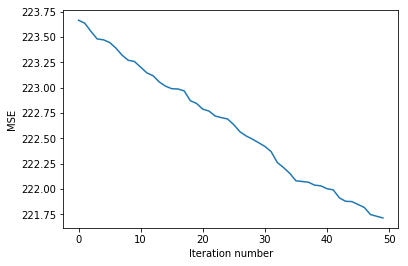

In [23]:
%pylab inline
plot(range(50), stoch_errors_by_iter[:50])
xlabel('Iteration number')
ylabel('MSE')

**Теперь посмотрим на зависимость ошибки от номера итерации для $10^5$ итераций стохастического градиентного спуска. Видим, что алгоритм сходится.**

Populating the interactive namespace from numpy and matplotlib


Text(0,0.5,'MSE')

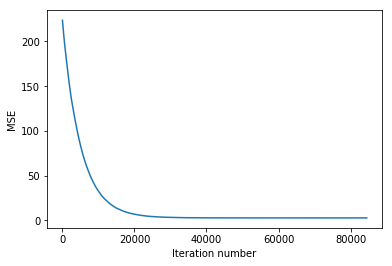

In [24]:
%pylab inline
plot(range(len(stoch_errors_by_iter)), stoch_errors_by_iter)
xlabel('Iteration number')
ylabel('MSE')

**Посмотрим на вектор весов, к которому сошелся метод.**

In [25]:
stoch_grad_desc_weights

array([ 3.91069256e+00,  2.78209808e+00, -8.10462217e-03,  1.40190566e+01])

**Посмотрим на среднеквадратичную ошибку на последней итерации.**

In [26]:
stoch_errors_by_iter[-1]

2.7844125884067052

**Какова среднеквадратичная ошибка прогноза значений Sales в виде линейной модели с весами, найденными с помощью градиентного спуска? Запишите ответ в файл '4.txt'.**

In [27]:
answer4 = mserror(y, linear_prediction(X, stoch_grad_desc_weights)) 
print(answer4)
write_answer_to_file(answer4, '4.txt')

2.784412588406704


**Ответами к заданию будут текстовые файлы, полученные в ходе этого решения. Обратите внимание, что отправленные файлы не должны содержать пустую строку в конце. Данный нюанс является ограничением платформы Coursera. Мы работаем над исправлением этого ограничения.**